In [70]:
# A more general approach to download all .xls/.xlsx links on the page
# This will catch any Excel files linked on the page, regardless of surrounding text.
# It also handles relative URLs and downloading same name files by adding a numbered suffix (_1, _2, etc.)..
import os
import requests
import asyncio
from playwright.async_api import async_playwright
from tqdm import tqdm

# --- Configuration ---
# The main page URL
EXPORT_PAGE = "https://epb.gov.bd/site/view/epb_export_data/-"
# Directory to save downloaded excel files
OUTPUT_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel"

# Add a User-Agent to mimic a real browser visit for the download request
HEADERS = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
}

async def run():
    """
    Launches a browser, navigates to the export data page, finds all Excel files,
    and downloads them. If a file with the same name already exists, it renames
    the new file by adding a numbered suffix (_1, _2, etc.).
    """
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    async with async_playwright() as p:
        browser = await p.chromium.launch(headless=True)
        page = await browser.new_page()

        print(f"Navigating to page: {EXPORT_PAGE}")
        try:
            await page.goto(EXPORT_PAGE, wait_until="networkidle", timeout=180000)
        except Exception as e:
            print(f"Failed to navigate to the page. Please check your network connection. Error: {e}")
            await browser.close()
            return

        print("Waiting for data table to load...")
        try:
            await page.wait_for_selector("table.bordered tbody tr", timeout=180000)
        except Exception as e:
            print(f"Timed out waiting for the data table to appear. The website structure may have changed. Error: {e}")
            await browser.close()
            return

        links = await page.query_selector_all("a")
        print(f"Found {len(links)} <a> tags on page. Filtering for Excel files...")

        download_tasks = []
        for link in links:
            href = await link.get_attribute("href")
            if not href:
                continue

            # Only process .xls or .xlsx links
            if not (href.lower().endswith(".xls") or href.lower().endswith(".xlsx")):
                continue

            # Fix relative URLs
            if href.startswith("//"):
                href = "https:" + href
            elif href.startswith("/"):
                href = "https://epb.gov.bd" + href

            download_tasks.append(href)

        if not download_tasks:
            print("No Excel files found on the page.")
            await browser.close()
            return

        print(f"\nFound {len(download_tasks)} Excel files to download.")

        for url in tqdm(download_tasks, desc="Downloading Files"):
            original_filename = os.path.basename(url).split('?')[0]
            base_name, extension = os.path.splitext(original_filename)
            
            filepath = os.path.join(OUTPUT_DIR, original_filename)
            counter = 1

            # --- New Logic to Handle Duplicates ---
            # Keep checking for a unique filename until one is found
            while os.path.exists(filepath):
                new_filename = f"{base_name}_{counter}{extension}"
                filepath = os.path.join(OUTPUT_DIR, new_filename)
                counter += 1
            # ------------------------------------

            # By the end of the loop, 'filepath' is guaranteed to be unique
            final_filename = os.path.basename(filepath)

            try:
                r = requests.get(url, timeout=120, headers=HEADERS)
                r.raise_for_status()
                with open(filepath, "wb") as f:
                    f.write(r.content)
                if final_filename != original_filename:
                    tqdm.write(f"✅ Downloaded and renamed: {original_filename} -> {final_filename}")
                else:
                    tqdm.write(f"✅ Downloaded: {final_filename}")

            except requests.RequestException as e:
                tqdm.write(f"❌ Failed to download {url}: {e}")

        await browser.close()
        print("\nDownload process complete.")

# Run in Jupyter
await run()

Navigating to page: https://epb.gov.bd/site/view/epb_export_data/-
Waiting for data table to load...
Found 1630 <a> tags on page. Filtering for Excel files...

Found 783 Excel files to download.


✅ Downloaded: 2025-09-02-10-07-35c4f80ae7706ad5d48bb43deca52329.xls


✅ Downloaded: 2025-08-06-05-43-008331d3ae17b58fe8b9e566a82a6330.xls


✅ Downloaded: 2025-08-18-05-21-3ae3bc4f2c9b555d94fabe3c0d668487.xlsx


✅ Downloaded: 2025-08-18-05-22-86d1886466e640a821384886ec87dd60.xlsx


✅ Downloaded: 2025-08-18-05-22-9a28dc0ccc8235d33aa101db9aec7011.xlsx


✅ Downloaded: 2025-08-18-05-22-b3ab085bb3361b56456a72ac2e1c06fe.xlsx


✅ Downloaded: 2025-07-03-06-23-b4ec11f1f6d70fc8f7d3264d5731d55e.xls


✅ Downloaded: 2025-07-08-08-10-44d01191d0c5ffcc8ff4592f8ee2b0ee.xlsx


✅ Downloaded: 2025-07-08-08-11-9e04096dd78324125e0300d91c42f821.xlsx


✅ Downloaded: 2025-07-08-08-11-eca51d4ee12ce188cc8c0fa3768a7537.xlsx


✅ Downloaded: 2025-07-08-08-11-0bb3ac351533703c3c0cb8fd68f3ffed.xlsx


✅ Downloaded: 2025-07-08-08-13-5dc13627f4b96cd65b187deb2095d565.xlsx


✅ Downloaded: 2025-06-03-09-40-4fb66441b7c71e40fb3afad380dde48c.xls


✅ Downloaded: 2025-06-04-08-42-4d892af444bab11f98b0d4ccceb379e3.xlsx


✅ Downloaded: 2025-06-04-08-42-5275c243d3f7c4b2a349d02b2d87a5f8.xlsx


✅ Downloaded: 2025-06-04-08-43-e6facb38930b77768639d6d934d270c6.xlsx


✅ Downloaded: 2025-07-07-08-02-6eb45fa4771d5b4c3f6b5734023dd73b.xlsx


✅ Downloaded: 2025-05-08-03-44-21aefac972a8f015934242458b22fd27.xls


✅ Downloaded: 2025-05-08-08-31-921ae742364550704240e3230276cf47.xlsx


✅ Downloaded: 2025-05-08-08-31-66a37bba42a9a19d7b76ad1e50777e81.xlsx


✅ Downloaded: 2025-05-08-08-32-5a33f9ed73de24baa4e1a13d0fc0f644.xlsx


✅ Downloaded: 2025-05-08-08-33-779e819d897259c1db800bb305093f9e.xlsx


✅ Downloaded: 2025-04-07-08-07-95736c7f675f5e3ab34ade0bcaaa326d.xls


✅ Downloaded: 2025-04-16-06-16-907b0be83f77610621c1ce7c28de082a.xlsx


✅ Downloaded: 2025-04-16-06-17-279b4c7312ed80e61b35c6ad3e4aaaf8.xlsx


✅ Downloaded: 2025-04-16-06-17-f64f6b11bc10b278af7a684c52cdc984.xlsx


✅ Downloaded: 2025-04-16-06-17-1408ad621392c9baa1ad6c76a6e5cfe3.xlsx


✅ Downloaded: 2025-05-08-04-50-2cbc2a44ffbb08908772d5f1da767fd6.xlsx


✅ Downloaded: 2025-03-04-08-20-ef25a1b5a083e901f134542708431dd4.xls


✅ Downloaded: 2025-03-16-06-46-fd4cc95b60e8941840803922c24415fb.xlsx


✅ Downloaded: 2025-03-16-06-47-b2bc02db8346b8cef3ad49d9d12743e4.xlsx


✅ Downloaded: 2025-03-16-06-47-fac9b90b73bdd125cfc3fc8e4e0fa0a4.xlsx


✅ Downloaded: 2025-05-08-03-42-f578a12a6e1404d34aa9f49688ba1141.xlsx


✅ Downloaded: 2025-02-05-09-47-ac8ad47e914b9b9b79476b13cffae2d8.xls


✅ Downloaded: 2025-02-17-04-39-8c1d8a0297aaac0d51396cfa5d9c6dc9.xlsx


✅ Downloaded: 2025-02-17-04-39-588c7e54ba269ae81b13d1d89871693a.xlsx


✅ Downloaded: 2025-02-17-04-40-5db4aa7a31ce70d665bef6ec37be9de2.xlsx


✅ Downloaded: 2025-02-17-04-40-b60334fd053c8622d27c609b1eb9e69b.xlsx


✅ Downloaded: 2025-01-02-10-32-df6037b961ce1ed1332a66a7c5c3d3e0.xls


✅ Downloaded: 2025-01-13-05-46-5cfccef596401ba2654ed5cc0ca50992.xlsx


✅ Downloaded: 2025-01-13-05-47-3e7aa13908ea232063b761806102ebc9.xlsx


✅ Downloaded: 2025-01-13-05-47-f48a8d33d09125bb1c9acfb2cd4544f8.xlsx


✅ Downloaded: 2025-01-13-05-48-b69174eb6f53228dd3e0f697681812c2.xlsx


✅ Downloaded: 2025-01-15-03-47-068429d58408d511ce82b8c830c69c32.xlsx


✅ Downloaded: 2024-12-08-03-34-20a5ad4488b1e48dfca3c4cb6a5c2052.xls


✅ Downloaded: 2024-12-12-03-29-0ed53245e15eb87f09d892789d84d7d0.xlsx


✅ Downloaded: 2024-12-12-03-29-db869d0c2eaf4661781d9902e487b4f5.xlsx


✅ Downloaded: 2024-12-12-03-29-35513ea9ed859c8600bc30d8b0333f9d.xlsx


✅ Downloaded: 2024-12-12-03-29-f4487347a25cb545f8c60e8b91d9ec96.xlsx


✅ Downloaded: 2024-11-25-05-11-c08bcfc751af946ee97b9d740fc9da76.xls


✅ Downloaded: 2024-11-25-06-59-7c8d2019d1c7d5ce46a277d43b90473d.xlsx


✅ Downloaded: 2024-11-25-06-59-2bbd4a4c218a620ad0b0deb3213b7ce9.xlsx


✅ Downloaded: 2024-11-25-06-59-6d9c8018621101ceb3a9fd2512aad209.xlsx


✅ Downloaded: 2024-11-25-06-59-fb89c3f4a7daf5447f116fa68f4c095a.xlsx


✅ Downloaded: 2024-11-25-05-10-b404bb49f64fb2bd14bc90f0b0dee0a0.xls


✅ Downloaded: 2024-11-25-06-57-1d9a66ddf4f3b55c6c0a2655b00e2c09.xlsx


✅ Downloaded: 2024-11-25-06-57-d1fa17bdee1adabaf57c21e4b33f5ef4.xlsx


✅ Downloaded: 2024-11-25-06-58-1761f592ead0786ad18a10f9c6122dcb.xlsx


✅ Downloaded: 2024-11-25-06-58-6e467b2041b24e247b2990dd8a34e6ea.xlsx


✅ Downloaded: 2025-01-13-05-42-f2e152cb5cbd42b7501f9105a6ad9fe4.xlsx


✅ Downloaded: 2024-11-25-05-07-c5e6c40a293938f1bb48ef7f32f865ba.xls


✅ Downloaded: 2024-11-25-06-55-6f8ae6e1f93397e8ee5cd788cf9df117.xlsx


✅ Downloaded: 2024-11-25-06-55-8d0d1c5391b673a0a275b95d7ed5e648.xlsx


✅ Downloaded: 2024-11-25-06-56-27c2b6268754227b1d36c97111ee8dca.xlsx


✅ Downloaded: 2024-11-25-04-54-e0291d6bb5e3c749d473277276222689.xls


✅ Downloaded: 2024-11-25-06-52-e17be8d8a1eb2b93d487e29cdc7ac5fd.xlsx


✅ Downloaded: 2024-11-25-06-52-cdc06ebf1c26ade0556cd10d76c6e7ff.xlsx


✅ Downloaded: 2024-11-25-06-53-7495fd2154a5de4e9de5fc4e109db5ef.xlsx


✅ Downloaded: 2024-11-25-06-53-b2855b1411c4fdaecc382122aef904a1.xlsx


✅ Downloaded: 2024-11-25-06-47-34d00d69581e9c75fcb6ac5408aa2c5c.xlsx


✅ Downloaded: 2024-11-25-06-48-8ac979585013f729e1339649383d606b.xlsx


✅ Downloaded: 2024-11-25-06-48-e0645a1fa65d36289b15a11f6f6af83f.xlsx


✅ Downloaded: 2024-11-25-06-48-a4f39f1fd397e5949560f9cdb35e2b2b.xlsx


✅ Downloaded: 2024-11-25-06-43-1a3af53ef587d59eed1517e7ada9ad40.xlsx


✅ Downloaded: 2024-11-25-06-43-3f259c8f98c5cb5688b4a2ea2c918f88.xlsx


✅ Downloaded: 2024-11-25-06-43-71e11e02f9087f5c4c345e56ad47a7c3.xlsx


✅ Downloaded: 2024-11-25-06-43-e4d49bd18f351e0bc68b625e53b9e504.xlsx


✅ Downloaded: 2024-11-25-06-39-00924486910119280c0f721cd1ce42ef.xlsx


✅ Downloaded: 2024-11-25-06-40-74fb20e0b0f8968c098c260d1f1ba0c4.xlsx


✅ Downloaded: 2024-11-25-06-40-f8ad84fffadb6e102f89f5fbc085170f.xlsx


✅ Downloaded: 2024-11-25-06-40-ad90c4d9471297bcaef8b2723b6e0f61.xlsx


✅ Downloaded: 2024-11-25-06-36-0ec9f1c75f5dd60f99754ec9a7e1ff17.xlsx


✅ Downloaded: 2024-11-25-06-37-dad43f1a1da85eb055fb8e566539ff29.xlsx


✅ Downloaded: 2024-11-25-06-37-7b5ee0a6c988b649259a3d2a797d6e9a.xlsx


✅ Downloaded: 2024-11-25-06-37-cf2b2ed3cbc83638219806593dd12094.xlsx


✅ Downloaded: 2024-11-25-06-33-3c92e67fc40f687872df9ca7e2d5b3e8.xlsx


✅ Downloaded: 2024-11-25-06-33-12f1a501ce77c76424fa5b69d02a773c.xlsx


✅ Downloaded: 2024-11-25-06-33-d82afffe9f40a5a6b76f70fcf2c0a1cb.xlsx


✅ Downloaded: 2024-11-25-06-34-83c7e077c094d4ffbd50735b3028fe53.xlsx


✅ Downloaded: 2024-11-25-06-29-6745266fc696e58397b9201bb7704996.xlsx


✅ Downloaded: 2024-11-25-06-30-0058baa79531a67ab21339b4349c7cb9.xlsx


✅ Downloaded: 2024-11-25-06-30-de7f3a17ec13672a478ac368b9dc8cb8.xlsx


✅ Downloaded: 2024-11-25-06-30-c31f395894cc08687f40ba4ee9b3fa6e.xlsx


✅ Downloaded: 2024-11-25-06-25-f7cc98b66460a8dbc07a47cec8180641.xlsx


✅ Downloaded: 2024-11-25-06-25-0fbcd4e63e6a9a8136034da19e1287a2.xlsx


✅ Downloaded: 2024-11-25-06-25-cf567d130e2ce85721a7ab8b17825724.xlsx


✅ Downloaded: 2024-11-25-06-26-7b14438dd020dca30e7c18f25e123337.xlsx


✅ Downloaded: 2024-11-25-06-20-22d2108f18426a2f81529561af55c086.xlsx


✅ Downloaded: 2024-11-25-06-20-681b8a66a99e139814fa2a4803493b01.xlsx


✅ Downloaded: 2024-11-25-06-20-dd6246355bcedbaff196457fa790ea4a.xlsx


✅ Downloaded: 2024-11-25-06-21-1d775a87dcbbb2f5c717fe77997af642.xlsx


✅ Downloaded: 2024-11-25-06-15-7cdbaadc4cd5a43d602293eb0814e2ed.xlsx


✅ Downloaded: 2024-11-25-06-16-fef4325783c6aad6fcd1a4bcc8f78fb1.xlsx


✅ Downloaded: 2024-11-25-06-16-aea8e04ce224004c08ae880fd93feb60.xlsx


✅ Downloaded: 2024-11-25-06-16-a1496b7a7f983ef8bbc120fabcdf3754.xlsx


✅ Downloaded: 2024-11-25-06-12-a5cc43d2de935ea3de28227c0efac397.xlsx


✅ Downloaded: 2024-11-25-06-12-170fa76621fffa27b97c0dd8c984b335.xlsx


✅ Downloaded: 2024-11-25-06-12-2010b9e9391cb6bebcff19692e09b9c3.xlsx


✅ Downloaded: 2024-11-25-06-12-aeb7934e470efc7a39272e4912bdac3b.xlsx


✅ Downloaded: 2024-11-25-06-03-471202c24de0feacf164efcbdd22c987.xlsx


✅ Downloaded: 2024-11-25-06-03-8189e59f8fd11c83b1a680af4954cd6f.xlsx


✅ Downloaded: 2024-11-25-06-03-0ab73f327f8ccff08d23359fe8c8e6f7.xlsx


✅ Downloaded: 2024-11-25-06-04-903b792184b6b5da500d10181d4061eb.xlsx


✅ Downloaded: 2024-11-25-05-57-cb0dbcde785eba5da02ecd2e6a30846c.xlsx


✅ Downloaded: 2024-11-25-05-57-ff443c17b5af04b7c9e197abf2ab99a3.xlsx


✅ Downloaded: 2024-11-25-05-58-d7f8c4e6075a50cba0966e7c8c3b27b3.xlsx


✅ Downloaded: 2024-11-25-05-58-b560346c3d990990ef0db1c82580fbc0.xlsx


✅ Downloaded: 2025-01-13-04-46-4d88a9b406e69ef7a0e1c87ee8b329f9.xlsx


✅ Downloaded: 2025-01-13-04-46-8169c63fa8793cc79200b084c7328c72.xlsx


✅ Downloaded: 2025-01-13-04-48-b796ddf7a48b0e0c82ae7416ec40fa7a.xlsx


✅ Downloaded: 2025-01-13-04-48-c7b83f3d836c58d4146793398cc16c77.xlsx


✅ Downloaded: 2025-01-13-04-43-3f856366fbe9fd4c9dc18a4c6eb17e11.xlsx


✅ Downloaded: 2025-01-13-04-43-ec3ffa4fbf1644de1221ba713d1c11fe.xlsx


✅ Downloaded: 2025-01-13-04-45-6a5d5081b24193f2f0058df306f19a6d.xlsx


✅ Downloaded: 2025-01-13-04-45-29309f1487bac6d085e99bf9424eccc5.xlsx


✅ Downloaded: 2025-01-13-04-41-9d02f5b72c1d4d1a0447058782d3991c.xlsx


✅ Downloaded: 2025-01-13-04-41-b615abfdc0e682d555a882bebacbff45.xlsx


✅ Downloaded: 2025-01-13-04-42-5f04fc0fa8f6a72008c29cfb653be25b.xlsx


✅ Downloaded: 2025-01-13-04-42-09ce64f88c4b12684dd295818035fbac.xlsx


✅ Downloaded: 2025-01-13-04-39-0239984595ab8850e22b1ee5c50b05cb.xlsx


✅ Downloaded: 2025-01-13-04-39-6510e50db3655b8d1d2df394907cdd75.xlsx


✅ Downloaded: 2025-01-13-04-40-8ea9f5665a76b5e3c66ecd67457b8f14.xlsx


✅ Downloaded: 2025-01-13-04-41-e89fbb4bf7b723fb1c230f6a472e428c.xlsx


✅ Downloaded: 2025-01-13-04-36-8cfcdae7d0aa7bd626030d41c43f706e.xlsx


✅ Downloaded: 2025-01-13-04-37-d1425362a93e76a6aeda5083eb6d2279.xlsx


✅ Downloaded: 2025-01-13-04-38-4dc2f2d111d2e9d3340ba42cfc619c3a.xlsx


✅ Downloaded: 2025-01-13-04-38-38f8a1b4bbff62dcb0afdc7124126541.xlsx


✅ Downloaded: 2025-01-13-04-34-3e5f9a54e9e10bf97a35f4c7eff20e23.xlsx


✅ Downloaded: 2025-01-13-04-35-7114b50cea45f6d30bfaa5c811b88c85.xlsx


✅ Downloaded: 2025-01-13-04-36-b5fac1671a9219f7e68f9d400df2b00e.xlsx


✅ Downloaded: 2025-01-13-04-36-b67df79970b65bfa93ffdca703439834.xlsx


✅ Downloaded: 2025-01-13-04-31-7f9168515a5c598f1fe830f8ea0f27cd.xlsx


✅ Downloaded: 2025-01-13-04-32-902676d785ec69fe9d1590b925fa6fab.xlsx


✅ Downloaded: 2025-01-13-04-33-8b0fff2c4e769d311ea0741c4a06038f.xlsx


✅ Downloaded: 2025-01-13-04-33-559586680929d80ffe31e90eff162382.xlsx


✅ Downloaded: 2025-01-13-04-29-9bc4e330a032d6747f53c29e0dec9286.xlsx


✅ Downloaded: 2025-01-13-04-29-9fb09b3d2690fd4d3c8700bac00d35aa.xlsx


✅ Downloaded: 2025-01-13-04-30-1b908f2f01b393796c4f4ce73c42a58a.xlsx


✅ Downloaded: 2025-01-13-04-31-f2e124f36f31c410c8c03f70fa0a4a37.xlsx


✅ Downloaded: 2025-01-13-04-27-a55c35cd0f3bc768fe94704e44c7f6e1.xlsx


✅ Downloaded: 2025-01-13-04-28-13e0d515497ad91c5e602eab5c427d3d.xlsx


✅ Downloaded: 2025-01-13-04-28-eb8fd3fae93e8c9779fced8f0df2f8d5.xlsx


✅ Downloaded: 2025-01-13-04-29-dc2caa91a291a64d6da5725bbc6fddcd.xlsx


✅ Downloaded: 2025-01-13-04-25-750a44a42da8a65734ce201eee1630e4.xlsx


✅ Downloaded: 2025-01-13-04-25-3f4e35d87f327ba032fd8c3b1ccd2e54.xlsx


✅ Downloaded: 2025-01-13-04-26-df8e5088e59b15c20946c6f7fa857be7.xlsx


✅ Downloaded: 2025-01-13-04-27-44cbd6907d5fe1475bc652dafa84e7af.xlsx


✅ Downloaded: 2025-01-13-04-22-86ae3eae96ff8ae53a7c071b475a66f6.xlsx


✅ Downloaded: 2025-01-13-04-23-e55feec530a85ff3d922de25229d5c34.xlsx


✅ Downloaded: 2025-01-13-04-24-10804af8151ab2531d1f68455cdb6790.xlsx


✅ Downloaded: 2025-01-13-04-24-97c01aa565b1006e1e23690f8530b70a.xlsx


✅ Downloaded: 2025-01-13-04-20-ce9095d095b393d80d7a0c389745e0da.xlsx


✅ Downloaded: 2025-01-13-04-20-3e51c29e7c1b21a3dd88e806eb26938d.xlsx


✅ Downloaded: 2025-01-13-04-21-8756e8482ef946a674d0889adc2b11ef.xlsx


✅ Downloaded: 2025-01-13-04-21-0efd3adbe608585ead92310dc5f2cf38.xlsx


✅ Downloaded: 2022-07-06-10-18-6e1e3f92e60289ee00bc3d1112777c5f.xlsx


✅ Downloaded: 2022-07-06-10-18-0cdf435893db52f1e2903c78401b4134.xlsx


✅ Downloaded: 2022-07-06-10-19-897c6234fb33c60d9fd1a866a5a6c309.xlsx


✅ Downloaded: 2022-07-06-10-19-b7cc52a3d6f3a6cc269fde02c3d3a886.xlsx


✅ Downloaded: 2022-07-06-10-21-6468d71ee2285ea7c6cd40416eb7fc3e.xlsx


✅ Downloaded: 2022-06-19-05-51-98e6c22f089475688f01b2f78f911c39.xlsx


✅ Downloaded: 2022-06-19-05-52-6c22c248d43048919665dd7963e7ab72.xlsx


✅ Downloaded: 2022-06-19-05-52-606ac3949257891d7fc38905208545b9.xlsx


✅ Downloaded: 2022-06-19-05-53-8ab5ac574deefedc2af00384c8bb93f2.xlsx


✅ Downloaded: 2022-05-11-08-31-7a0e29637877ebf563998745c48c163c.xlsx


✅ Downloaded: 2022-05-11-08-31-b8180ad364d606821ea8d83fd0b3a7c0.xlsx


✅ Downloaded: 2022-05-11-08-31-252a3bc0d8775d91443474cf23126aa5.xlsx


✅ Downloaded: 2022-05-11-08-31-d36666a0f3af343b82b724c6bf24c7dc.xlsx


✅ Downloaded: 2022-04-19-03-48-22b4a6178e98c730da0931216b889efd.xlsx


✅ Downloaded: 2022-04-19-03-49-2d6ac89307e997a8b3dc8780c24318a1.xlsx


✅ Downloaded: 2022-04-19-03-49-0cfc9a310e531df9b9bab69e3c6cb6c3.xlsx


✅ Downloaded: 2022-04-19-03-51-02a52a1153f6ab25ecb38ea1e1126748.xlsx


✅ Downloaded: 2022-05-16-04-14-e09b642488c0483cc2bdb6bd4b77cd1b.xlsx


✅ Downloaded: 2022-03-23-06-40-43b6b40378c2d1679bf9522c201f18b8.xlsx


✅ Downloaded: 2022-03-23-06-41-c291e7559e16a452d849e351c89ca585.xlsx


✅ Downloaded: 2022-03-23-06-41-7276e89b2d60799eed1f3321238fd90c.xlsx


✅ Downloaded: 2022-03-23-06-42-482ca1e3b277478b21d6b14f77ba2585.xlsx


✅ Downloaded: 2022-02-16-05-59-e69b6e313d34f405db0aeb3c0313a7b4.xlsx


✅ Downloaded: 2022-02-16-05-59-883aff02ac532fe92707787ed32de4fd.xlsx


✅ Downloaded: 2022-02-16-06-00-8edb982107d69a4d66ed414d42ad5928.xlsx


✅ Downloaded: 2022-02-16-06-01-938a7f4639330cbb0e1a003ee8fb0147.xlsx


✅ Downloaded: 2022-01-05-08-19-b243d1502960c6295f568c22775376a1.xlsx


✅ Downloaded: 2022-01-05-08-20-8cb324d4459f9d728d98dcb7c9f8ca28.xlsx


✅ Downloaded: 2022-01-05-08-20-b67016208cb9551a7ef01bc5a12b31b1.xlsx


✅ Downloaded: 2022-01-05-08-21-50185507c13628ed1c05f0bdd8966172.xlsx


✅ Downloaded: 2022-01-17-05-43-fcb0d7919d9d03efc6622c63efb6354b.xlsx


✅ Downloaded: 2021-12-21-05-35-6ad5f61a016b3475f531e54343c1844a.xlsx


✅ Downloaded: 2021-12-21-05-37-c0dfea7f9cdda2df5b51c0ca2c545503.xlsx


✅ Downloaded: 2021-12-21-05-46-ca869a8fe1168c40e19bb0cc8bda68d6.xlsx


✅ Downloaded: 2021-12-21-05-47-704b65ddb9700e9d1979d48f52ac2ada.xlsx


✅ Downloaded: 2021-11-10-08-57-bbd64ccb51ed3bcae2661bbfd7e007ee.xlsx


✅ Downloaded: 2021-11-10-09-00-92da244a085c1fd711ead858f4362fdd.xlsx


✅ Downloaded: 2021-11-10-09-02-1b67043c339c5e5ed8fce6489843a0a8.xlsx


✅ Downloaded: 2021-11-10-09-03-d8d932c45d5af0d21f377b56aa18de4f.xlsx


✅ Downloaded: 2021-10-13-10-10-1d7a9d1db7240cdb6e48cffc48611adb.xlsx


✅ Downloaded: 2021-10-13-10-11-03f5d1318c98e5bccf88ccfdceea55f9.xlsx


✅ Downloaded: 2021-10-13-10-11-481bdb84960109e3aaf494df51b4c246.xlsx


✅ Downloaded: 2021-10-13-10-12-ba4679ea2de9f46b07a4fadae53e79d7.xlsx


✅ Downloaded: 2021-11-02-09-55-0c19bd43e3f6a06d5c7c4706086e70ae.xlsx


✅ Downloaded: 2021-09-11-04-36-1d271e99e04a9ddf74d8224e20ab27e5.xlsx


✅ Downloaded: 2021-09-11-04-37-cd0f9128aa90d73cc9c99208f1a3fd47.xlsx


✅ Downloaded: 2021-09-11-04-37-97de7ca37cf70fbf7084c026710cdb80.xlsx


✅ Downloaded: 2021-09-11-04-37-c298cf07880e8cdae7636ac4523a5147.xlsx


✅ Downloaded: 2021-09-11-04-30-64232311cb1f262d43a34982ce3e1856.xlsx


✅ Downloaded: 2021-09-11-04-31-d4c82f14f3c9edabc5dab47522f62f33.xlsx


✅ Downloaded: 2021-09-11-04-31-91855e23cadc9239363fabb5cb72e298.xlsx


✅ Downloaded: 2021-09-11-04-32-92f87c1e2bcfc120453bb88f353f22ae.xlsx


✅ Downloaded: 2021-07-11-10-13-efda93e82e3256a97f22eb3d3b7adab1.xlsx


✅ Downloaded: 2021-07-11-10-14-9d99fdca98a41b6c3d99af4681faf61d.xlsx


✅ Downloaded: 2021-07-11-10-14-7df60ecfa99698edc27a86b91c67e79d.xlsx


✅ Downloaded: 2021-07-11-10-14-d97e5e490a79ed5c07fde9e227b290c8.xlsx


✅ Downloaded: 2021-07-18-08-36-ff1131314f0be0bfea37b5cfac7a109b.xlsx


✅ Downloaded: 2021-06-03-09-00-efc8877ec4dbe8f906f2109274d06b1f.xlsx


✅ Downloaded: 2021-06-03-09-00-83824062d31c955df7d09cdcd772e616.xlsx


✅ Downloaded: 2021-06-03-09-00-0da02e5a60e28c2e9a10e546a5a10e67.xlsx


✅ Downloaded: 2021-06-03-09-00-a12e2442742dae94b8d07e98547d6a2b.xlsx


✅ Downloaded: 2021-05-27-10-52-cfeea6db893ea1e36c9a183d6017003a.xlsx


✅ Downloaded: 2021-05-27-10-52-df87cf84e96ed8a8b859f286adb8664e.xlsx


✅ Downloaded: 2021-05-27-10-53-f94ac583b98d852fcc1555d9c121943f.xlsx


✅ Downloaded: 2021-05-27-10-54-4d2b8827ea19f1ffcef20bfb8f741c3b.xlsx


✅ Downloaded: 2021-04-08-09-36-7489f670401275476fd7a1461dd89d3b.xlsx


✅ Downloaded: 2021-04-08-09-38-0db5181365e0e873e64c191cc1a73a29.xlsx


✅ Downloaded: 2021-04-08-09-39-35c1db924d50acce08843e5f9c0d9f80.xlsx


✅ Downloaded: 2021-04-08-09-40-28e599441c498ab925ce6a9e4178deba.xlsx


✅ Downloaded: 2021-04-13-10-05-749dedeb470a47e8b13724f5a33ae790.xlsx


✅ Downloaded: 2021-03-07-12-30-ae7f13b8ebe7b208bf81d9a79fab52ea.xlsx


✅ Downloaded: 2021-03-07-12-31-c64ead64ff59eabfc6e7544ccdf0e497.xlsx


✅ Downloaded: 2021-03-07-12-31-381e68147bfc24657aa432761df1a300.xlsx


✅ Downloaded: 2021-03-07-12-30-bbe0e2df2d748902210e4a6a03363a9c.xlsx


✅ Downloaded: 2021-02-10-10-55-4dc921fc8c62079f24f43a1899dd479c.xlsx


✅ Downloaded: 2021-02-10-10-59-ebce2e883d6369b39cbece8355677eca.xlsx


✅ Downloaded: 2021-02-10-10-55-5893bebc2a4dbaaab73caeed3f60e42d.xlsx


✅ Downloaded: 2021-01-11-10-43-b4fa0e3213af85485caae98c95747a2f.xlsx


✅ Downloaded: 2021-01-11-10-43-22e3b8be1d467507297de023be127303.xlsx


✅ Downloaded: 2021-01-11-10-44-3aa6ba511c003fa00f229931ea439728.xlsx


✅ Downloaded: 2021-01-11-10-46-c8670016828a834ee2681a03de1981d4.xlsx


✅ Downloaded: 2021-01-11-10-45-bb477524957d21021cdb3d390a070c6f.xlsx


✅ Downloaded: 2021-02-01-13-58-11d3f81bec5150482c95f8371471793b.xlsx


❌ Failed to download https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-17-33ac120e98d7605b44040dcd4e572a3c.xlsx: 404 Client Error: Not Found for url: https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-17-33ac120e98d7605b44040dcd4e572a3c.xlsx


❌ Failed to download https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-17-3c8fe7e589343142a210546d61f32035.xlsx: 404 Client Error: Not Found for url: https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-17-3c8fe7e589343142a210546d61f32035.xlsx


❌ Failed to download https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-17-3f662ca552c4c09cd2b16cfc7cacb2d9.xlsx: 404 Client Error: Not Found for url: https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-17-3f662ca552c4c09cd2b16cfc7cacb2d9.xlsx


❌ Failed to download https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-18-4d671bb974f568a02cdbb1c933bb03d6.xlsx: 404 Client Error: Not Found for url: https://epb.gov.bd/sites/default/files/files/epb.portal.gov.bd/epb_export_data/a2372c7b_c29e_469e_8418_4451278e44be/2020-12-13-15-18-4d671bb974f568a02cdbb1c933bb03d6.xlsx


✅ Downloaded: 2020-12-20-09-22-d68551bd3cb63a604e23bc9be4ea6e1f.xlsx


✅ Downloaded: 2020-12-27-09-31-dd213ccfc97fd0b81fc4e8364633a150.xlsx


✅ Downloaded: 2020-12-27-09-32-e9e78f1e2d0cd6ec8a60671e11ddd59f.xlsx


✅ Downloaded: 2020-12-27-19-01-16520c83443e0b3cb180262a24d44469.xlsx


✅ Downloaded: 2020-11-04-16-09-02162965aaec7636db2cbf26755c8b14.xlsx


✅ Downloaded: 2020-11-04-16-09-be21dfc8eb2a503d89ae5dbab72ccdd9.xlsx


✅ Downloaded: 2020-11-04-16-09-2575504f952d0c657981f7042eaa8242.xlsx


✅ Downloaded: 2020-11-04-16-09-419af6b64d23b8991825888388f05a66.xlsx


✅ Downloaded: 2020-10-11-11-48-9f8b1d0ca18f568d09f24daa5683e934.xlsx


✅ Downloaded: 2020-10-11-11-48-35fe6eed1b550de9df83164b4e57dcc8.xlsx


✅ Downloaded: 2020-10-11-11-48-c38fc5d3837350b3a4df28d4ee803b19.xlsx


✅ Downloaded: 2020-10-11-11-48-403148845dc8c8d64c70789caa0d4755.xlsx


✅ Downloaded: 2021-01-11-10-48-fba7cd2da43ba93869ee56386a5f9cc7.xlsx


✅ Downloaded: 2020-09-10-23-46-96f33ac4aa05f96f06d374c4ec6cfec8.xlsx


✅ Downloaded: 2020-09-10-23-46-17bdae45c5037a9623b2ac5bed4d9152.xlsx


✅ Downloaded: 2020-09-10-23-47-9820c9dd09a91fc11a1e07218c90f8cf.xlsx


✅ Downloaded: 2020-09-10-23-47-5363d4031a62c729e657e08c3698b8f7.xlsx


✅ Downloaded: 2020-08-10-09-22-ee242e596e729668cefa9ad22035bed7.xlsx


✅ Downloaded: 2020-08-10-09-22-ada70e520c4a803bc369b9c3cad0a0a8.xlsx


✅ Downloaded: 2020-08-10-09-23-26d66e22ec29d9db2ddd48192a36926f.xlsx


✅ Downloaded: 2020-08-10-09-23-c87673b25aeba88d9886faaee7512c17.xlsx


✅ Downloaded: 2020-07-08-16-23-71264ad1fd61c72ac4e478f30a046aba.xlsx


✅ Downloaded: 2020-07-08-16-24-35671c98f275d000e757b5166ba25f33.xlsx


✅ Downloaded: 2020-07-19-14-56-daeebac082496a3c2e4993e9a5bd8599.xlsx


✅ Downloaded: 2020-07-19-14-56-8021dea4b48271b62ed5fbe6211e4879.xlsx


✅ Downloaded: 2020-07-19-14-56-381affe033b9df68d39b62e54d1b5867.xlsx


✅ Downloaded: 2020-06-10-09-35-08a43c4ee06dd5a6544d91fa568006dc.xlsx


✅ Downloaded: 2020-06-10-09-35-1f6ee3fd81058b6a996280c32ef5f550.xlsx


✅ Downloaded: 2020-06-10-09-36-6aa1574fee0a4722fea75b7c8754b3ba.xlsx


✅ Downloaded: 2020-06-10-09-36-7e68a630801b3b7da87becaa51f73077.xlsx


✅ Downloaded: 2020-06-10-09-33-ad179e1433e757a7b2df60455ec6d2ff.xlsx


✅ Downloaded: 2020-06-10-09-33-c663cb81371ce7db3b491b3f4dbad3ec.xlsx


✅ Downloaded: 2020-06-10-09-34-537cddb8d699b3aa57aa554839afe41c.xlsx


✅ Downloaded: 2020-06-10-09-34-18437dda7a4f500b537ecce4676c065b.xlsx


✅ Downloaded: 2020-06-10-09-31-dfd8da9c3309a87cccfb18552a883226.xlsx


✅ Downloaded: 2020-06-10-09-31-7400b47e768573d6f4dfc878c19f6842.xlsx


✅ Downloaded: 2020-06-10-09-31-47d748db16714185b7489b875a7c667e.xlsx


✅ Downloaded: 2020-06-10-09-32-47d21a0fd8aef534685cb36d5891c8dd.xlsx


✅ Downloaded: 2020-06-17-15-39-d0c0cf3852aa647fe92e81bd796cb41e.xlsx


✅ Downloaded: 2020-03-18-10-05-b0546fc71007d381838ff5c84af332bc.xlsx


✅ Downloaded: 2020-03-18-10-05-50b8807ddba1725ef67dd15466822295.xlsx


✅ Downloaded: 2020-03-18-10-06-21e44bf307184c1ec17e24acaa4e317f.xlsx


✅ Downloaded: 2020-03-18-10-07-eb35899d5c5a99b3f268a960952fe0c9.xlsx


✅ Downloaded: 2020-02-09-12-21-bc235b448f91ab8134b0135196c20708.xlsx


✅ Downloaded: 2020-02-09-12-21-c857971a72324fe5347c8425804f0b4a.xlsx


✅ Downloaded: 2020-02-09-12-21-ed3825613f39c588bace595caaa65d69.xlsx


✅ Downloaded: 2020-02-09-12-21-48f309bba666569f48479eb8ed500758.xlsx


✅ Downloaded: 2020-01-06-14-01-8d6b9f71fddfd2558a29621a4af027a5.xlsx


✅ Downloaded: 2020-01-06-14-01-6911f791bc1b0c01aaa9cb468fb51695.xlsx


✅ Downloaded: 2020-01-06-14-02-ca5da2f64870d57e1d158efab6ceb33e.xlsx


✅ Downloaded: 2020-01-06-14-02-708d6a06422035a6ebd513c1e7d870df.xlsx


✅ Downloaded: 2020-02-17-10-41-d095d37c1e2650f8aaf6fd79efc6de09.xlsx


✅ Downloaded: 2020-06-17-15-40-36f55344c63d93e87ea6d9976ef470a6.xlsx


✅ Downloaded: 4242c032e2790a0b99d5d3a9363be772.xlsx


✅ Downloaded: ad1770a1b5cde528fbaae7e500ef324a.xlsx


✅ Downloaded: 20f4abb7c1805b705c26a506c284672a.xlsx


✅ Downloaded: c7055569e18289d5055d290c8f68a552.xlsx


✅ Downloaded: 830222065531ca70b26e9785b7b7a4ec.xlsx


✅ Downloaded: f23c9efe1ee07b8121fa76c1cc16c115.xlsx


✅ Downloaded: 2c0810d1f4212d352f13a912ca62ccc0.xlsx


✅ Downloaded: b76474e422c0163f041cd2cf3ae2a260.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-Sep  2019-20.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-Sep  2019-20.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-Sep  2019-20.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-Sep  2019-20.xlsx


✅ Downloaded: 7c349919a64f127ea2cb1eb4d5b9c4ec.xlsx


✅ Downloaded: 2020-06-17-15-40-b9e2d12cda0a492b1f58a39d14c5d3d2.xlsx


✅ Downloaded: Country Wise Export For The Month of July-March 2010-11.xls


✅ Downloaded: Details Export For The Month of July-March 2010-11.xls


✅ Downloaded: Product Wise Export For The Month of July-March 2010-11.xls


✅ Downloaded: Region Wise Export For The Month of July-March 2010-11.xls


✅ Downloaded: Country Wise Export For The Month of July-June 2011-12.xls


✅ Downloaded: Details Export For The Month of July-June 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-June 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-June 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-May 2011-12.xls


✅ Downloaded: Details Export For The Month of July-May 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-May 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-May 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-April 2011-12.xls


✅ Downloaded: Details Export For The Month of July-April 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-April 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-April 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-March 2011-12.xls


✅ Downloaded: Details Export For The Month of July-March 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-March 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-March 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-February 2011-12.xls


✅ Downloaded: Detals Export For The Month of July-February 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-February 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-February 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-January 2011-12.xls


✅ Downloaded: Details Export For The Month of July-January 2011-12.xls


✅ Downloaded: Mission Wise Export.xls


✅ Downloaded: Product Wise Export For The Month of July-January 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-January 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-December 2011-12.xls


✅ Downloaded: Details Export For The Month of July-December 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-December 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-December 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-November 2011-12.xls


✅ Downloaded: Details Export For The Month of July-November 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-November 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-November 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-October 2011-12.xls


✅ Downloaded: Details Export For The Month of July-October 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-October 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-October 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-September 2011-12.xls


✅ Downloaded: Details Export For The Month of July-September 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-September 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-September 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-August 2011-12.xls


✅ Downloaded: Details Export For The Month of July-August 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July-August 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July-August 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July 2011-12.xls


✅ Downloaded: Details Export For The Month of July 2011-12.xls


✅ Downloaded: Product Wise Export For The Month of July 2011-12.xls


✅ Downloaded: Region Wise Export For The Month of July 2011-12.xls


✅ Downloaded: Country Wise Export For The Month of July-June 2012-13.xls


✅ Downloaded: Details Export For The Month of July-June 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-June 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-June 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-May 2012-13.xls


✅ Downloaded: Details Esport For The Month of July-May 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-May 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-May 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-April 2012-13.xls


✅ Downloaded: Details Export For The Month of July-April 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-April 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-April 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-March 2012-13.xls


✅ Downloaded: Details Export For The Month of July-March 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-March 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-March 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-February 2012-13.xls


✅ Downloaded: Details Export For The Month of July-February 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-February 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-February 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-January 2012-13.xls


✅ Downloaded: Details Export For The Month of July-January 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-January 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-January 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-December 2012-13.xls


✅ Downloaded: Details Export For The Month of July-December 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-December 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-December 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-November 2012-13.xls


✅ Downloaded: Details Export For The Month of July-November 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-November 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-November 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-October 2012-13.xls


✅ Downloaded: Details Export For The Month of July-October 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-October 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-October 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-September 2012-13.xls


✅ Downloaded: Details Export For The Month of July-September 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-September 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-September 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July-August 2012-13.xls


✅ Downloaded: Details Export For The Month of July-August 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July-August 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July-August 2012-13.xls


✅ Downloaded: Country Wise Export For The Month of July 2012-13.xls


✅ Downloaded: Details Export For The Month of July 2012-13.xls


✅ Downloaded: Product Wise Export For The Month of July 2012-13.xls


✅ Downloaded: Region Wise Export For The Month of July 2012-13.xls


✅ Downloaded: Country Wise Export for the month of July-June 2013-14.xls


✅ Downloaded: Details Export for the month of July-June 2013-14.xls


✅ Downloaded: Product Wise Export for the month of July-June 2013-14.xls


✅ Downloaded: Region Wise Export for the month of July-June 2013-14.xls


✅ Downloaded: Country Wise Export for the Month of July-June 2014-2015.xls


✅ Downloaded: Details Export for the Month of July-June 2014-2015.xls


✅ Downloaded: Product Wise Export for the Month of July-June 2014-2015.xls


✅ Downloaded: Region Wise Export for the Month of July-June 2014-2015.xls


✅ Downloaded: Country Wise Export for the Month of July-May 2014-2015.xls


✅ Downloaded: Details Export for the Month of July-May 2014-2015.xls


✅ Downloaded: Product Wise Export for the Month of July-May 2014-2015.xls


✅ Downloaded: Region Wise Export for the Month of July-May 2014-2015.xls


✅ Downloaded: Country Wise Export for the Month of July-April 2014-2015.xls


✅ Downloaded: Details Export for the Month of July-April 2014-2015.xls


✅ Downloaded: Product Wise Export for the Month of July-April 2014-2015.xls


✅ Downloaded: Region Wise Export for the Month of July-April 2014-2015.xls


✅ Downloaded: Country Wise Export for the Month of July-March 2014-2015.xls


✅ Downloaded: Details Export for the Month of July-March 2014-2015.xls


✅ Downloaded: Product Wise Export for the Month of July-March 2014-2015.xls


✅ Downloaded: Region Wise Export for the Month of July-March 2014-2015.xls


✅ Downloaded: Country Wise Export for the Month of July-February 2014-2015.xls


✅ Downloaded: Details Export for the Month of July-February 2014-2015.xls


✅ Downloaded: Product Wise Export  for the Month of July-February 2014-2015.xls


✅ Downloaded: Region Wise Export for the Month of July-February 2014-2015.xls


✅ Downloaded: Country Wise Export for the Month of July -January 2014-15.xls


✅ Downloaded: Details Export for the Month of July-January 2014-2015.xls


✅ Downloaded: Product Wise Export for the Month of July-January 2014-15.xls


✅ Downloaded: Region Wise Export for the Month of July-January 2014-15.xls


✅ Downloaded: Country Wise Export for the Month of July- December 2014-15.xls


✅ Downloaded: Details Export for the Month of July-December 2014-2015.xls


✅ Downloaded: Product Wise Export for the Month of July-December 2014-15.xls


✅ Downloaded: Region Wise Export for the Month of July-December 2014-15.xls


✅ Downloaded: Country Wise Export for the Month of July-November 2014-15.xls


✅ Downloaded: Details Export for the Month of July-November 2014-15.xls


✅ Downloaded: Product Wise Export for the Month of July-November 2014-15.xls


✅ Downloaded: Region Wise Export for the Month of July-November 2014-15.xls


✅ Downloaded: Country Wise Export for the Month of July-October 2014-15.xls


✅ Downloaded: Details Export for the Month of July-October 2014-15.xls


✅ Downloaded: Product Wise Export for the Month of July-October 2014-15.xls


✅ Downloaded: Region Wise Export for the Month of July-October 2014-15.xls


✅ Downloaded: Country Wise Export for the Month of July-September 2014-15.xls


✅ Downloaded: Details Export for the Month of July-September 2014-15.xls


✅ Downloaded: Product Wise Export for the Month of July-September 2014-15.xls


✅ Downloaded: Region Wise Export for the Month of July-September 2014-15.xls


✅ Downloaded: Country Wise Export for the Month of July-August 2014-15.xls


✅ Downloaded: Details Export for the Month of July-August 2014-15.xls


✅ Downloaded: Product Wise Export for the Month of July-August 2014-15.xls


✅ Downloaded: Region Wise Export for the Month of July-August 2014-15.xls


✅ Downloaded: Country Wise Export for the month of July 2014-15.xls


✅ Downloaded: Details Export for the month of July 2014-15.xls


✅ Downloaded: Product Wise Export for the month of July 2014-15.xls


✅ Downloaded: Region Wise Export for the month of July 2014-15.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-August  2019-20.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-August  2019-20.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-August  2019-20.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-August  2019-20.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-2019-20.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July 2019-20.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July 2019-20.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July 2019-20.xlsx


✅ Downloaded: countryDetails.xls


✅ Downloaded: country-hs2.xls


✅ Downloaded: country-hs4.xls


✅ Downloaded: country-hs6.xls


✅ Downloaded: country-hs8.xls


✅ Downloaded: CountrySummary.xls


✅ Downloaded: Details Export Report.xls


✅ Downloaded: MissonWise.xls


✅ Downloaded: Product Wise 2 Digit.xls


✅ Downloaded: Product Wise 4 Digit.xls


✅ Downloaded: Product Wise 6 Digit.xls


✅ Downloaded: Product Wise 8 Digit.xls


✅ Downloaded: Regionwise.xls


✅ Downloaded: Country Details.xls


✅ Downloaded: Country Summary.xls


✅ Downloaded: Country Wise 2 Digit.xls


✅ Downloaded: Country Wise 4 Digit.xls


✅ Downloaded: Country Wise 6 Digit.xls


✅ Downloaded: Country Wise 8 Digit.xls


✅ Downloaded: Details Export.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_1.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_1.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_1.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_1.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_1.xls


✅ Downloaded: Region Wise Export.xls


✅ Downloaded and renamed: Country Details.xls -> Country Details_1.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_1.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_1.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_1.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_1.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_1.xls


✅ Downloaded and renamed: Details Export.xls -> Details Export_1.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_2.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_2.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_2.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_2.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_2.xls


✅ Downloaded and renamed: Region Wise Export.xls -> Region Wise Export_1.xls


✅ Downloaded and renamed: Country Details.xls -> Country Details_2.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_2.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_2.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_2.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_2.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_2.xls


✅ Downloaded and renamed: Details Export.xls -> Details Export_2.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_3.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_3.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_3.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_3.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_3.xls


✅ Downloaded and renamed: Region Wise Export.xls -> Region Wise Export_2.xls


✅ Downloaded and renamed: Country Details.xls -> Country Details_3.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_3.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_3.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_3.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_3.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_3.xls


✅ Downloaded and renamed: Details Export.xls -> Details Export_3.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_4.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_4.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_4.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_4.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_4.xls


✅ Downloaded and renamed: Region Wise Export.xls -> Region Wise Export_3.xls


✅ Downloaded: country details.xls


✅ Downloaded: country hs 2.xls


✅ Downloaded: country hs 4.xls


✅ Downloaded: country hs 6.xls


✅ Downloaded: country hs 8.xls


✅ Downloaded: country summary.xls


✅ Downloaded: hs 2.xls


✅ Downloaded: hs 4.xls


✅ Downloaded: hs 6.xls


✅ Downloaded: hs 8.xls


✅ Downloaded: hs detail (1).xls


✅ Downloaded: mission wise.xls


✅ Downloaded: region wise.xls


✅ Downloaded and renamed: Country Details.xls -> Country Details_4.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_4.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_4.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_4.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_4.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_4.xls


✅ Downloaded: Detalis Export.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_5.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_5.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_5.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_5.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_5.xls


✅ Downloaded and renamed: Region Wise Export.xls -> Region Wise Export_4.xls


✅ Downloaded and renamed: Country Details.xls -> Country Details_5.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_5.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_5.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_5.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_5.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_5.xls


✅ Downloaded and renamed: Details Export.xls -> Details Export_4.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_6.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_6.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_6.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_6.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_6.xls


✅ Downloaded and renamed: Region Wise Export.xls -> Region Wise Export_5.xls


✅ Downloaded: Country Detail.xls


✅ Downloaded: Country summary.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_6.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_6.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_6.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_6.xls


✅ Downloaded and renamed: Details Export.xls -> Details Export_5.xls


✅ Downloaded: Mission.xls


✅ Downloaded and renamed: Product Wise 2 Digit.xls -> Product Wise 2 Digit_7.xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_7.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_7.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_7.xls


✅ Downloaded: Region Wise Eport.xls


✅ Downloaded: Country 2 Digit.xls


✅ Downloaded: Country 4 Digit.xls


✅ Downloaded: Country 6 Digit.xls


✅ Downloaded: Country 8 Digit.xls


✅ Downloaded and renamed: Country Detail.xls -> Country Detail_1.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_6.xls


✅ Downloaded: Detail Eport (1).xls


✅ Downloaded: Miion ie Eport.xls


✅ Downloaded: Product 2 Digit.xls


✅ Downloaded: Product 4 Digit.xls


✅ Downloaded: Product 6 Digit.xls


✅ Downloaded: Product 8 Digit.xls


✅ Downloaded: Region ie Eport.xls


✅ Downloaded and renamed: Country Details.xls -> Country Details_6.xls


✅ Downloaded and renamed: Country Summary.xls -> Country Summary_7.xls


✅ Downloaded and renamed: Country Wise 2 Digit.xls -> Country Wise 2 Digit_7.xls


✅ Downloaded and renamed: Country Wise 4 Digit.xls -> Country Wise 4 Digit_7.xls


✅ Downloaded and renamed: Country Wise 6 Digit.xls -> Country Wise 6 Digit_7.xls


✅ Downloaded and renamed: Country Wise 8 Digit.xls -> Country Wise 8 Digit_7.xls


✅ Downloaded and renamed: Mission Wise Export.xls -> Mission Wise Export_7.xls


✅ Downloaded: Mission Wise Export (1).xls


✅ Downloaded and renamed: Product Wise 4 Digit.xls -> Product Wise 4 Digit_8.xls


✅ Downloaded and renamed: Product Wise 6 Digit.xls -> Product Wise 6 Digit_8.xls


✅ Downloaded and renamed: Product Wise 8 Digit.xls -> Product Wise 8 Digit_8.xls


✅ Downloaded and renamed: Region Wise Export.xls -> Region Wise Export_6.xls


✅ Downloaded: Country Details (2).xls


✅ Downloaded: Country Summary (2).xls


✅ Downloaded: Country Wise 2 Digit (2).xls


✅ Downloaded: Country Wise 4 Digit (1).xls


✅ Downloaded: Country Wise 6 Digit (1).xls


✅ Downloaded: Country Wise 8 Digit (1).xls


✅ Downloaded: Details Export (1).xls


✅ Downloaded and renamed: Mission Wise Export (1).xls -> Mission Wise Export (1)_1.xls


✅ Downloaded: Product Wise 2 Digit (1).xls


✅ Downloaded: Product Wise 4 Digit (1).xls


✅ Downloaded: Product Wise 6 Digit (1).xls


✅ Downloaded: Product Wise 8 Digit (1).xls


✅ Downloaded: Region Wise Export (1).xls


✅ Downloaded: Country Wise Export For The Month of July-June 2016-17.xls


✅ Downloaded: Details Export For The Month of July-June 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-June 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-June 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-May 2016-17.xls


✅ Downloaded: Details Export For The Month of July-May 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-May 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-May 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-April 2016-17.xls


✅ Downloaded: Details Export For The Month of July-April 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-April 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-April 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-March 2016-17.xls


✅ Downloaded: Details Export For The Month of July-March 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-March 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-March 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-February 2016-17.xls


✅ Downloaded: Details Export For The Month of July-Feruary 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-February 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-February 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-January 2016-17.xls


✅ Downloaded: Details Export For The Month of July-January 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-January 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-January 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-December 2016-17.xls


✅ Downloaded: Details Export For The Month of July-December 2016-17.xls


✅ Downloaded: Product Wise  Export For The Month of July-December 2016-17.xls


✅ Downloaded: Region Wise  Export For The Month of July-December 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-November 2016-17.xls


✅ Downloaded: Details Export For The Month of July-November 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-November 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-November 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-October 2016-17.xls


✅ Downloaded: Details Export For The Month of July-October 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-October 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-October 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-September 2016-17.xls


✅ Downloaded and renamed: Details Export.xls -> Details Export_6.xls


✅ Downloaded: Product Wise Export For The Month of July-September 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-September 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July-August 2016-17.xls


✅ Downloaded: Details Export For The Month of July-August 2016-17.xls


✅ Downloaded: Product Wise Export For The Month of July-August 2016-17.xls


✅ Downloaded: Region Wise Export For The Month of July-August 2016-17.xls


✅ Downloaded: Country Wise Export For The Month of July 2016-17.xls


✅ Downloaded: Details Export For The Month of July 2016-17.xls


✅ Downloaded: Mission wise Export.xls


✅ Downloaded: Product Wise Export For The Month of July 2016-17.xls


✅ Downloaded: Region Wise Export Export For The Month of July 2016-17.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-June 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-June 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-June 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-June 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-May 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-May 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-May 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-May 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-April 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-April 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-April 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-April 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-March 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-March 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-March 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-March 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-February 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-February 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-February 2017-18.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-February 2017-18.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-January 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-Janury 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-January 2017-18.xlsx


✅ Downloaded: RegionWise Export (Goods) For The Month of July-January 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-December 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-December 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-December 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-December 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-November 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-November 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-November 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-November 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-October 2017-18.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-October 2017-18.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-October 2017-18.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-October 2017-18.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-September 2017-18.xls


✅ Downloaded: Details Export (Goods) For The Month of July-September 2017-18.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-September 2017-18.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-September 2017-18.xls


✅ Downloaded: Country Wise Export For The Month of July-August 2017-18.xls


✅ Downloaded: Details Export For The Month of July-Augut  2017-18.xls


✅ Downloaded: Product Wise Export For The Month of July-August 2017-18.xls


✅ Downloaded: Region Wise Export For The Month of July-August 2017-18.xls


✅ Downloaded: Country Wise Export For The Month of July 2017-18.xls


✅ Downloaded: Details Export For The Month of July 2017-18.xls


✅ Downloaded: Product Wise Export For The Month of July 2017-18 (1).xls


✅ Downloaded: Region Wise Export For The Month of July 2017-18.xls


✅ Downloaded: 4th Quarter-2018-2019 (July-June).xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-June 2018-19.xlsx


✅ Downloaded: Details Export  (Goods) For The Month of July-June 2018-19.xlsx


✅ Downloaded: Monthly Statement 2018-19_(P4) July-May.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-June 2018-19.xls


✅ Downloaded: 2020-04-29-10-51-84b14dcdd5af5d93f3d5e49937c7b3b3.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-May 2018-19.xlsx


✅ Downloaded: Details Export  (Goods) For The Month of July-May 2018-19.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-May 2018-19.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-May 2018-19 (1).xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-May 2018-19.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-April 2018-19.xls


✅ Downloaded: Details Export (Goods) For The Month of July-April 2018-19.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-April 2018-19.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-April 2018-19.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-March 2018-19.xls


✅ Downloaded: Details Export (Goods) For The Month of July-March 2018-19.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-March 2018-19.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-March 2018-19.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-February 2018-19.xls


✅ Downloaded: Details Export (Goods) For The Month of July-February 2018-19.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-February 2018-19.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-February 2018-19.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-January 2018-19.xls


✅ Downloaded: Details Export (Goods) For The Month of July-January 2018-19.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-January 2018-19.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-January 2018-19.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-December 2018-19.xls


✅ Downloaded: Details Export (Goods) For The Month of July-December 2018-19.xls


✅ Downloaded: Product Wise Export (Goods) For The Month of July-December 2018-19.xls


✅ Downloaded: Region Wise Export (Goods) For The Month of July-December 2018-19.xls


✅ Downloaded: Country Wise Export (Goods) For The Month of July-November 2018-19.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-November 2018-19.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-November 2018-19.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-November 2018-19.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-October 2018-19.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-October 2018-19.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-October 2018-19.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-October 2018-19.xlsx


✅ Downloaded: Country Wise  Export (Goods) For The Month of July-September  2018-19.xls


✅ Downloaded: Details Export (Goods) For The Month of July-September  2018-19.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-September  2018-19.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-September  2018-19.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July-August  2018-19.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-August  2018-19.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July-August  2018-19.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July-August  2018-19.xlsx


✅ Downloaded: Country Wise Export (Goods) For The Month of July 2018-19.xlsx


✅ Downloaded: Details Export (Goods) For The Month of July-2018-19.xlsx


✅ Downloaded: Product Wise Export (Goods) For The Month of July 2018-19.xlsx


✅ Downloaded: Region Wise Export (Goods) For The Month of July 2018-19.xlsx

Download process complete.


In [ ]:
# This script sort through all Excel files in a specified directory,
# checks if they contain a sheet named "2 Digit", and moves those files
# to a designated subdirectory. If the subdirectory doesn't exist,
# it creates it. It also provides a summary of how many files were moved
# and how many were skipped.
import os
import shutil
import pandas as pd
from tqdm import tqdm

# --- Configuration ---
SOURCE_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel"
DEST_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_2Digit"
# --- End of Configuration ---


def move_files_with_2digit_sheet(source_path, dest_path):
    """
    Moves Excel files from source_path to dest_path if they contain a sheet named '2 Digit'.
    """
    print(f"Source directory: {source_path}")
    print(f"Destination directory: {dest_path}")

    os.makedirs(dest_path, exist_ok=True)

    all_files = [f for f in os.listdir(source_path) if os.path.isfile(os.path.join(source_path, f))]
    if not all_files:
        print("No files found in the source directory.")
        return

    moved_count = 0
    skipped_count = 0

    for filename in tqdm(all_files, desc="Checking files"):
        filepath = os.path.join(source_path, filename)

        # Process only Excel files
        if not filename.lower().endswith(('.xls', '.xlsx')):
            continue

        try:
            # Load file metadata without reading full data
            excel_file = pd.ExcelFile(filepath)
            if "2 Digit" in excel_file.sheet_names:
                shutil.move(filepath, os.path.join(dest_path, filename))
                tqdm.write(f"✅ Moved: {filename}")
                moved_count += 1
            else:
                skipped_count += 1
        except Exception as e:
            tqdm.write(f"❌ Error reading '{filename}': {e}")
            skipped_count += 1

    print("\n--- Process Complete ---")
    print(f"Moved: {moved_count} files")
    print(f"Skipped or had errors: {skipped_count} files")


if __name__ == "__main__":
    if not os.path.isdir(SOURCE_DIR):
        print(f"Error: Source directory not found at '{SOURCE_DIR}'")
    else:
        move_files_with_2digit_sheet(SOURCE_DIR, DEST_DIR)

Source directory: /media/abdul-aziz/sdb7/epb_exports_excel
Destination directory: /media/abdul-aziz/sdb7/epb_exports_excel/product_2Digit


Checking files:   1%|          | 4/779 [00:00<00:23, 32.48it/s]

✅ Moved: 2025-08-18-05-21-3ae3bc4f2c9b555d94fabe3c0d668487.xlsx


Checking files:   1%|          | 8/779 [00:00<00:24, 31.18it/s]

✅ Moved: 2025-08-18-05-22-9a28dc0ccc8235d33aa101db9aec7011.xlsx
✅ Moved: 20f4abb7c1805b705c26a506c284672a.xlsx


Checking files:   1%|          | 8/779 [00:00<00:24, 31.18it/s]

✅ Moved: 2c0810d1f4212d352f13a912ca62ccc0.xlsx
✅ Moved: 4242c032e2790a0b99d5d3a9363be772.xlsx


Checking files:   2%|▏         | 12/779 [00:00<00:25, 30.25it/s]

✅ Moved: 2025-06-04-08-42-4d892af444bab11f98b0d4ccceb379e3.xlsx


Checking files:   2%|▏         | 16/779 [00:00<00:27, 27.30it/s]

✅ Moved: 2025-07-07-08-02-6eb45fa4771d5b4c3f6b5734023dd73b.xlsx


Checking files:   2%|▏         | 19/779 [00:00<00:32, 23.16it/s]

✅ Moved: 2025-07-08-08-10-44d01191d0c5ffcc8ff4592f8ee2b0ee.xlsx


Checking files:   4%|▎         | 28/779 [00:01<00:42, 17.56it/s]

✅ Moved: 2025-04-16-06-17-f64f6b11bc10b278af7a684c52cdc984.xlsx
✅ Moved: 2025-05-08-03-42-f578a12a6e1404d34aa9f49688ba1141.xlsx


Checking files:   4%|▍         | 31/779 [00:01<00:44, 16.78it/s]

✅ Moved: 2025-05-08-08-31-921ae742364550704240e3230276cf47.xlsx
✅ Moved: 2025-05-08-08-32-5a33f9ed73de24baa4e1a13d0fc0f644.xlsx
✅ Moved: 2025-02-17-04-39-8c1d8a0297aaac0d51396cfa5d9c6dc9.xlsx


Checking files:   5%|▍         | 37/779 [00:01<00:37, 19.61it/s]

✅ Moved: 2025-02-17-04-40-5db4aa7a31ce70d665bef6ec37be9de2.xlsx
✅ Moved: 2025-03-16-06-47-b2bc02db8346b8cef3ad49d9d12743e4.xlsx


Checking files:   6%|▌         | 44/779 [00:02<00:30, 24.03it/s]

✅ Moved: 2024-12-12-03-29-35513ea9ed859c8600bc30d8b0333f9d.xlsx
✅ Moved: 2025-01-13-04-20-ce9095d095b393d80d7a0c389745e0da.xlsx


Checking files:   6%|▋         | 50/779 [00:02<00:34, 21.39it/s]

✅ Moved: 2025-01-13-04-21-8756e8482ef946a674d0889adc2b11ef.xlsx
✅ Moved: 2025-01-13-04-22-86ae3eae96ff8ae53a7c071b475a66f6.xlsx
✅ Moved: 2025-01-13-04-24-10804af8151ab2531d1f68455cdb6790.xlsx


Checking files:   7%|▋         | 56/779 [00:02<00:33, 21.83it/s]

✅ Moved: 2025-01-13-04-25-750a44a42da8a65734ce201eee1630e4.xlsx
✅ Moved: 2025-01-13-04-26-df8e5088e59b15c20946c6f7fa857be7.xlsx
✅ Moved: 2025-01-13-04-27-a55c35cd0f3bc768fe94704e44c7f6e1.xlsx


Checking files:   8%|▊         | 62/779 [00:02<00:33, 21.61it/s]

✅ Moved: 2024-11-25-06-57-1d9a66ddf4f3b55c6c0a2655b00e2c09.xlsx
✅ Moved: 2024-11-25-06-58-1761f592ead0786ad18a10f9c6122dcb.xlsx


Checking files:   8%|▊         | 65/779 [00:03<00:33, 21.52it/s]

✅ Moved: 2024-11-25-06-59-6d9c8018621101ceb3a9fd2512aad209.xlsx
✅ Moved: 2024-11-25-06-59-7c8d2019d1c7d5ce46a277d43b90473d.xlsx


Checking files:   9%|▉         | 72/779 [00:03<00:31, 22.23it/s]

✅ Moved: 2024-11-25-06-48-e0645a1fa65d36289b15a11f6f6af83f.xlsx
✅ Moved: 2024-11-25-06-52-e17be8d8a1eb2b93d487e29cdc7ac5fd.xlsx
✅ Moved: 2024-11-25-06-53-7495fd2154a5de4e9de5fc4e109db5ef.xlsx


Checking files:  10%|▉         | 75/779 [00:03<00:36, 19.24it/s]

✅ Moved: 2024-11-25-06-55-6f8ae6e1f93397e8ee5cd788cf9df117.xlsx
✅ Moved: 2024-11-25-06-55-8d0d1c5391b673a0a275b95d7ed5e648.xlsx


Checking files:  10%|█         | 78/779 [00:03<00:39, 17.79it/s]

✅ Moved: 2024-11-25-06-39-00924486910119280c0f721cd1ce42ef.xlsx
✅ Moved: 2024-11-25-06-40-f8ad84fffadb6e102f89f5fbc085170f.xlsx


Checking files:  10%|█         | 81/779 [00:03<00:38, 17.90it/s]

✅ Moved: 2024-11-25-06-43-1a3af53ef587d59eed1517e7ada9ad40.xlsx


Checking files:  11%|█         | 87/779 [00:04<00:45, 15.15it/s]

✅ Moved: 2024-11-25-06-43-71e11e02f9087f5c4c345e56ad47a7c3.xlsx
✅ Moved: 2024-11-25-06-30-de7f3a17ec13672a478ac368b9dc8cb8.xlsx


Checking files:  12%|█▏        | 92/779 [00:04<00:41, 16.43it/s]

✅ Moved: 2024-11-25-06-33-3c92e67fc40f687872df9ca7e2d5b3e8.xlsx
✅ Moved: 2024-11-25-06-33-d82afffe9f40a5a6b76f70fcf2c0a1cb.xlsx
✅ Moved: 2024-11-25-06-36-0ec9f1c75f5dd60f99754ec9a7e1ff17.xlsx


Checking files:  12%|█▏        | 94/779 [00:04<00:41, 16.40it/s]

✅ Moved: 2024-11-25-06-37-7b5ee0a6c988b649259a3d2a797d6e9a.xlsx
✅ Moved: 2024-11-25-06-20-22d2108f18426a2f81529561af55c086.xlsx


Checking files:  13%|█▎        | 101/779 [00:05<00:40, 16.80it/s]

✅ Moved: 2024-11-25-06-20-dd6246355bcedbaff196457fa790ea4a.xlsx
✅ Moved: 2024-11-25-06-25-cf567d130e2ce85721a7ab8b17825724.xlsx
✅ Moved: 2024-11-25-06-25-f7cc98b66460a8dbc07a47cec8180641.xlsx


Checking files:  14%|█▍        | 108/779 [00:05<00:31, 21.57it/s]

✅ Moved: 2025-01-13-04-48-b796ddf7a48b0e0c82ae7416ec40fa7a.xlsx
✅ Moved: 2025-01-13-05-47-3e7aa13908ea232063b761806102ebc9.xlsx


Checking files:  15%|█▍        | 116/779 [00:05<00:26, 24.91it/s]

✅ Moved: 2025-01-15-03-47-068429d58408d511ce82b8c830c69c32.xlsx
✅ Moved: 2025-01-13-04-41-9d02f5b72c1d4d1a0447058782d3991c.xlsx
✅ Moved: 2025-01-13-04-42-5f04fc0fa8f6a72008c29cfb653be25b.xlsx


Checking files:  15%|█▌        | 119/779 [00:06<00:28, 23.19it/s]

✅ Moved: 2025-01-13-04-43-3f856366fbe9fd4c9dc18a4c6eb17e11.xlsx
✅ Moved: 2025-01-13-04-45-6a5d5081b24193f2f0058df306f19a6d.xlsx


Checking files:  16%|█▌        | 125/779 [00:06<00:33, 19.54it/s]

✅ Moved: 2025-01-13-04-36-8cfcdae7d0aa7bd626030d41c43f706e.xlsx
✅ Moved: 2025-01-13-04-36-b5fac1671a9219f7e68f9d400df2b00e.xlsx


Checking files:  16%|█▋        | 128/779 [00:06<00:32, 19.92it/s]

✅ Moved: 2025-01-13-04-38-4dc2f2d111d2e9d3340ba42cfc619c3a.xlsx
✅ Moved: 2025-01-13-04-39-0239984595ab8850e22b1ee5c50b05cb.xlsx
✅ Moved: 2025-01-13-04-29-9bc4e330a032d6747f53c29e0dec9286.xlsx


Checking files:  17%|█▋        | 134/779 [00:06<00:32, 19.94it/s]

✅ Moved: 2025-01-13-04-30-1b908f2f01b393796c4f4ce73c42a58a.xlsx
✅ Moved: 2025-01-13-04-31-7f9168515a5c598f1fe830f8ea0f27cd.xlsx


Checking files:  18%|█▊        | 140/779 [00:07<00:38, 16.79it/s]

✅ Moved: 2025-01-13-04-33-8b0fff2c4e769d311ea0741c4a06038f.xlsx
✅ Moved: 2024-11-25-06-03-471202c24de0feacf164efcbdd22c987.xlsx


Checking files:  19%|█▊        | 146/779 [00:07<00:31, 19.81it/s]

✅ Moved: 2024-11-25-06-12-2010b9e9391cb6bebcff19692e09b9c3.xlsx
✅ Moved: 2024-11-25-06-12-a5cc43d2de935ea3de28227c0efac397.xlsx
✅ Moved: 2024-11-25-06-15-7cdbaadc4cd5a43d602293eb0814e2ed.xlsx


Checking files:  20%|█▉        | 154/779 [00:07<00:20, 30.09it/s]

✅ Moved: 2024-11-25-05-57-cb0dbcde785eba5da02ecd2e6a30846c.xlsx
✅ Moved: 2024-11-25-05-58-d7f8c4e6075a50cba0966e7c8c3b27b3.xlsx


Checking files:  21%|██        | 161/779 [00:08<00:25, 23.89it/s]

✅ Moved: 2022-05-16-04-14-e09b642488c0483cc2bdb6bd4b77cd1b.xlsx
✅ Moved: 2022-06-19-05-51-98e6c22f089475688f01b2f78f911c39.xlsx
✅ Moved: 2022-06-19-05-52-606ac3949257891d7fc38905208545b9.xlsx


Checking files:  21%|██▏       | 167/779 [00:08<00:29, 21.08it/s]

✅ Moved: 2022-07-06-10-18-6e1e3f92e60289ee00bc3d1112777c5f.xlsx
✅ Moved: 2022-07-06-10-19-897c6234fb33c60d9fd1a866a5a6c309.xlsx
✅ Moved: 2022-03-23-06-41-7276e89b2d60799eed1f3321238fd90c.xlsx


Checking files:  22%|██▏       | 174/779 [00:08<00:27, 22.07it/s]

✅ Moved: 2022-04-19-03-49-2d6ac89307e997a8b3dc8780c24318a1.xlsx
✅ Moved: 2022-05-11-08-31-252a3bc0d8775d91443474cf23126aa5.xlsx
✅ Moved: 2022-05-11-08-31-7a0e29637877ebf563998745c48c163c.xlsx


Checking files:  23%|██▎       | 177/779 [00:08<00:29, 20.71it/s]

✅ Moved: 2022-01-05-08-19-b243d1502960c6295f568c22775376a1.xlsx
✅ Moved: 2022-01-05-08-20-b67016208cb9551a7ef01bc5a12b31b1.xlsx


Checking files:  24%|██▎       | 184/779 [00:09<00:26, 22.69it/s]

✅ Moved: 2022-02-16-05-59-e69b6e313d34f405db0aeb3c0313a7b4.xlsx
✅ Moved: 2022-02-16-06-00-8edb982107d69a4d66ed414d42ad5928.xlsx
✅ Moved: 2021-11-10-08-57-bbd64ccb51ed3bcae2661bbfd7e007ee.xlsx


Checking files:  24%|██▍       | 190/779 [00:09<00:25, 23.45it/s]

✅ Moved: 2021-11-10-09-02-1b67043c339c5e5ed8fce6489843a0a8.xlsx
✅ Moved: 2021-12-21-05-35-6ad5f61a016b3475f531e54343c1844a.xlsx
✅ Moved: 2021-12-21-05-46-ca869a8fe1168c40e19bb0cc8bda68d6.xlsx


Checking files:  25%|██▌       | 196/779 [00:09<00:24, 23.46it/s]

✅ Moved: 2021-09-11-04-31-91855e23cadc9239363fabb5cb72e298.xlsx
✅ Moved: 2021-09-11-04-36-1d271e99e04a9ddf74d8224e20ab27e5.xlsx
✅ Moved: 2021-09-11-04-37-97de7ca37cf70fbf7084c026710cdb80.xlsx


Checking files:  26%|██▌       | 203/779 [00:09<00:25, 22.60it/s]

✅ Moved: 2021-10-13-10-10-1d7a9d1db7240cdb6e48cffc48611adb.xlsx
✅ Moved: 2024-12-12-03-29-0ed53245e15eb87f09d892789d84d7d0.xlsx
✅ Moved: 2025-01-13-04-28-eb8fd3fae93e8c9779fced8f0df2f8d5.xlsx


Checking files:  26%|██▌       | 203/779 [00:09<00:25, 22.60it/s]

✅ Moved: 2025-01-13-04-34-3e5f9a54e9e10bf97a35f4c7eff20e23.xlsx


Checking files:  26%|██▋       | 206/779 [00:10<00:44, 12.95it/s]

✅ Moved: 2025-01-13-04-40-8ea9f5665a76b5e3c66ecd67457b8f14.xlsx
✅ Moved: 2025-01-13-04-46-4d88a9b406e69ef7a0e1c87ee8b329f9.xlsx
✅ Moved: 2025-04-16-06-16-907b0be83f77610621c1ce7c28de082a.xlsx


Checking files:  27%|██▋       | 210/779 [00:10<00:36, 15.59it/s]

✅ Moved: 2025-07-08-08-11-eca51d4ee12ce188cc8c0fa3768a7537.xlsx
✅ Moved: 830222065531ca70b26e9785b7b7a4ec.xlsx


Checking files:  28%|██▊       | 215/779 [00:11<00:54, 10.39it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-June 2017-18.xlsx


Checking files:  28%|██▊       | 217/779 [00:11<01:10,  7.92it/s]

✅ Moved: Country Wise Export for the Month of July -January 2014-15.xls


Checking files:  28%|██▊       | 219/779 [00:12<01:21,  6.84it/s]

✅ Moved: 2021-06-03-09-00-0da02e5a60e28c2e9a10e546a5a10e67.xlsx
✅ Moved: 2021-06-03-09-00-efc8877ec4dbe8f906f2109274d06b1f.xlsx


Checking files:  29%|██▉       | 224/779 [00:12<00:58,  9.50it/s]

✅ Moved: 2021-07-11-10-13-efda93e82e3256a97f22eb3d3b7adab1.xlsx
✅ Moved: 2021-07-11-10-14-7df60ecfa99698edc27a86b91c67e79d.xlsx


Checking files:  30%|██▉       | 230/779 [00:12<00:39, 13.93it/s]

✅ Moved: 2021-04-08-09-36-7489f670401275476fd7a1461dd89d3b.xlsx
✅ Moved: 2021-04-08-09-39-35c1db924d50acce08843e5f9c0d9f80.xlsx
✅ Moved: 2021-05-27-10-52-cfeea6db893ea1e36c9a183d6017003a.xlsx


Checking files:  31%|███       | 241/779 [00:13<00:24, 22.09it/s]

✅ Moved: 2021-05-27-10-53-f94ac583b98d852fcc1555d9c121943f.xlsx
✅ Moved: 2021-01-11-10-44-3aa6ba511c003fa00f229931ea439728.xlsx
✅ Moved: 2021-01-11-10-46-c8670016828a834ee2681a03de1981d4.xlsx
✅ Moved: 2021-02-10-10-55-4dc921fc8c62079f24f43a1899dd479c.xlsx


Checking files:  32%|███▏      | 247/779 [00:13<00:22, 23.21it/s]

✅ Moved: 2021-02-10-10-59-ebce2e883d6369b39cbece8355677eca.xlsx
✅ Moved: 2021-03-07-12-30-ae7f13b8ebe7b208bf81d9a79fab52ea.xlsx
✅ Moved: 2020-11-04-16-09-02162965aaec7636db2cbf26755c8b14.xlsx
✅ Moved: 2020-11-04-16-09-2575504f952d0c657981f7042eaa8242.xlsx


Checking files:  33%|███▎      | 254/779 [00:13<00:23, 22.37it/s]

✅ Moved: 2020-12-27-09-31-dd213ccfc97fd0b81fc4e8364633a150.xlsx
✅ Moved: 2020-12-27-19-01-16520c83443e0b3cb180262a24d44469.xlsx


Checking files:  33%|███▎      | 258/779 [00:13<00:21, 24.03it/s]

✅ Moved: 2020-08-10-09-23-26d66e22ec29d9db2ddd48192a36926f.xlsx
✅ Moved: 2020-09-10-23-46-96f33ac4aa05f96f06d374c4ec6cfec8.xlsx
✅ Moved: 2020-09-10-23-47-9820c9dd09a91fc11a1e07218c90f8cf.xlsx


Checking files:  34%|███▍      | 266/779 [00:14<00:19, 26.00it/s]

✅ Moved: 2020-10-11-11-48-9f8b1d0ca18f568d09f24daa5683e934.xlsx
✅ Moved: 2020-06-10-09-36-6aa1574fee0a4722fea75b7c8754b3ba.xlsx


Checking files:  35%|███▍      | 270/779 [00:14<00:19, 25.57it/s]

✅ Moved: 2020-07-08-16-23-71264ad1fd61c72ac4e478f30a046aba.xlsx
✅ Moved: 2020-07-08-16-24-35671c98f275d000e757b5166ba25f33.xlsx


Checking files:  36%|███▌      | 280/779 [00:14<00:18, 26.45it/s]

✅ Moved: 2020-06-10-09-31-47d748db16714185b7489b875a7c667e.xlsx
✅ Moved: 2020-06-10-09-31-dfd8da9c3309a87cccfb18552a883226.xlsx
✅ Moved: 2020-06-10-09-33-ad179e1433e757a7b2df60455ec6d2ff.xlsx


Checking files:  37%|███▋      | 286/779 [00:14<00:20, 23.91it/s]

✅ Moved: 2020-06-10-09-34-537cddb8d699b3aa57aa554839afe41c.xlsx
✅ Moved: 2020-06-10-09-35-08a43c4ee06dd5a6544d91fa568006dc.xlsx


Checking files:  42%|████▏     | 327/779 [00:19<00:32, 13.87it/s]

✅ Moved: Product Wise  Export For The Month of July-December 2016-17.xls


Checking files:  42%|████▏     | 331/779 [00:20<00:39, 11.40it/s]

✅ Moved: Country Wise Export For The Month of July-March 2012-13.xls


Checking files:  42%|████▏     | 331/779 [00:20<00:39, 11.40it/s]

✅ Moved: Country Wise Export for the Month of July-March 2014-2015.xls


Checking files:  42%|████▏     | 331/779 [00:21<00:39, 11.40it/s]

✅ Moved: Country Wise Export For The Month of July-March 2016-17.xls


Checking files:  43%|████▎     | 334/779 [00:21<01:09,  6.38it/s]

✅ Moved: Country Wise Export For The Month of July-May 2011-12.xls


Checking files:  43%|████▎     | 334/779 [00:22<01:09,  6.38it/s]

✅ Moved: Country Wise Export For The Month of July-May 2012-13.xls


Checking files:  43%|████▎     | 334/779 [00:22<01:09,  6.38it/s]

✅ Moved: Country Wise Export for the Month of July-May 2014-2015.xls


Checking files:  43%|████▎     | 337/779 [00:23<01:48,  4.06it/s]

✅ Moved: Country Wise Export For The Month of July-May 2016-17.xls


Checking files:  43%|████▎     | 337/779 [00:23<01:48,  4.06it/s]

✅ Moved: Country Wise Export For The Month of July-November 2011-12.xls


Checking files:  44%|████▎     | 339/779 [00:24<01:54,  3.83it/s]

✅ Moved: Country Wise Export For The Month of July-November 2012-13.xls


Checking files:  44%|████▎     | 339/779 [00:24<01:54,  3.83it/s]

✅ Moved: Country Wise Export for the Month of July-November 2014-15.xls


Checking files:  44%|████▍     | 341/779 [00:25<02:13,  3.29it/s]

✅ Moved: Country Wise Export For The Month of July-November 2016-17.xls


Checking files:  44%|████▍     | 343/779 [00:25<02:10,  3.35it/s]

✅ Moved: Country Wise Export For The Month of July-October 2011-12.xls
✅ Moved: Country Wise Export For The Month of July-October 2012-13.xls


Checking files:  48%|████▊     | 377/779 [00:26<00:14, 28.47it/s]

✅ Moved: Product Wise Export For The Month of July-June 2012-13.xls


Checking files:  48%|████▊     | 377/779 [00:27<00:14, 28.47it/s]

✅ Moved: Product Wise Export for the month of July-June 2013-14.xls


Checking files:  48%|████▊     | 377/779 [00:27<00:14, 28.47it/s]

✅ Moved: Product Wise Export for the Month of July-June 2014-2015.xls


Checking files:  49%|████▉     | 383/779 [00:28<00:42,  9.42it/s]

✅ Moved: Product Wise Export For The Month of July-June 2016-17.xls
✅ Moved: Product Wise Export For The Month of July-March 2010-11.xls


Checking files:  49%|████▉     | 383/779 [00:28<00:42,  9.42it/s]

✅ Moved: Product Wise Export For The Month of July-March 2011-12.xls


Checking files:  49%|████▉     | 383/779 [00:29<00:42,  9.42it/s]

✅ Moved: Product Wise Export For The Month of July-March 2012-13.xls


Checking files:  49%|████▉     | 383/779 [00:29<00:42,  9.42it/s]

✅ Moved: Product Wise Export for the Month of July-March 2014-2015.xls


Checking files:  50%|████▉     | 388/779 [00:30<01:05,  6.00it/s]

✅ Moved: Product Wise Export For The Month of July-March 2016-17.xls


Checking files:  50%|████▉     | 388/779 [00:30<01:05,  6.00it/s]

✅ Moved: Product Wise Export For The Month of July-May 2011-12.xls


Checking files:  50%|████▉     | 388/779 [00:30<01:05,  6.00it/s]

✅ Moved: Product Wise Export For The Month of July-May 2012-13.xls


Checking files:  50%|█████     | 391/779 [00:31<01:20,  4.79it/s]

✅ Moved: Country Wise Export For The Month of July-December 2012-13.xls


Checking files:  50%|█████     | 391/779 [00:31<01:20,  4.79it/s]

✅ Moved: Country Wise Export For The Month of July-December 2016-17.xls


Checking files:  50%|█████     | 391/779 [00:32<01:20,  4.79it/s]

✅ Moved: Country Wise Export For The Month of July-February 2011-12.xls


Checking files:  51%|█████     | 394/779 [00:32<01:38,  3.89it/s]

✅ Moved: Country Wise Export For The Month of July-February 2012-13.xls


Checking files:  51%|█████     | 394/779 [00:33<01:38,  3.89it/s]

✅ Moved: Country Wise Export for the Month of July-February 2014-2015.xls


Checking files:  51%|█████     | 396/779 [00:33<01:54,  3.33it/s]

✅ Moved: Country Wise Export For The Month of July-February 2016-17.xls


Checking files:  51%|█████     | 396/779 [00:33<01:54,  3.33it/s]

✅ Moved: Country Wise Export For The Month of July-January 2011-12.xls


Checking files:  51%|█████     | 398/779 [00:34<02:01,  3.14it/s]

✅ Moved: Country Wise Export For The Month of July-January 2012-13.xls


Checking files:  51%|█████     | 399/779 [00:34<02:10,  2.92it/s]

✅ Moved: Country Wise Export For The Month of July-January 2016-17.xls


Checking files:  51%|█████▏    | 400/779 [00:35<02:19,  2.71it/s]

✅ Moved: Country Wise Export For The Month of July-June 2011-12.xls


Checking files:  51%|█████▏    | 401/779 [00:36<02:31,  2.50it/s]

✅ Moved: Country Wise Export For The Month of July-June 2012-13.xls


Checking files:  52%|█████▏    | 402/779 [00:36<02:42,  2.31it/s]

✅ Moved: Country Wise Export for the month of July-June 2013-14.xls


Checking files:  52%|█████▏    | 403/779 [00:36<02:34,  2.43it/s]

✅ Moved: Country Wise Export for the Month of July-June 2014-2015.xls


Checking files:  52%|█████▏    | 404/779 [00:37<03:15,  1.92it/s]

✅ Moved: Country Wise Export For The Month of July-June 2016-17.xls


Checking files:  53%|█████▎    | 410/779 [00:38<01:04,  5.76it/s]

✅ Moved: Country Wise Export For The Month of July-March 2010-11.xls


Checking files:  56%|█████▋    | 439/779 [00:39<00:18, 18.30it/s]

✅ Moved: Product Wise Export for the Month of July-August 2014-15.xls


Checking files:  57%|█████▋    | 442/779 [00:40<00:27, 12.21it/s]

✅ Moved: Product Wise Export For The Month of July-August 2016-17.xls
✅ Moved: Product Wise Export For The Month of July-August 2017-18.xls


Checking files:  57%|█████▋    | 444/779 [00:40<00:31, 10.47it/s]

✅ Moved: Product Wise Export For The Month of July-December 2011-12.xls


Checking files:  57%|█████▋    | 446/779 [00:41<00:49,  6.74it/s]

✅ Moved: Product Wise Export For The Month of July-December 2012-13.xls
✅ Moved: Product Wise Export for the Month of July-December 2014-15.xls


Checking files:  57%|█████▋    | 446/779 [00:41<00:49,  6.74it/s]

✅ Moved: Product Wise Export For The Month of July-February 2011-12.xls


Checking files:  58%|█████▊    | 448/779 [00:41<01:02,  5.34it/s]

✅ Moved: Product Wise Export For The Month of July-February 2012-13.xls


Checking files:  58%|█████▊    | 450/779 [00:42<01:13,  4.48it/s]

✅ Moved: Product Wise Export For The Month of July-February 2016-17.xls
✅ Moved: Product Wise Export For The Month of July-January 2011-12.xls


Checking files:  58%|█████▊    | 451/779 [00:42<01:26,  3.77it/s]

✅ Moved: Product Wise Export For The Month of July-January 2012-13.xls


Checking files:  58%|█████▊    | 452/779 [00:43<01:36,  3.38it/s]

✅ Moved: Product Wise Export for the Month of July-January 2014-15.xls


Checking files:  58%|█████▊    | 453/779 [00:43<01:31,  3.55it/s]

✅ Moved: Product Wise Export For The Month of July-January 2016-17.xls


Checking files:  60%|█████▉    | 467/779 [00:44<00:26, 11.85it/s]

✅ Moved: Country Wise Export For The Month of July-March 2011-12.xls


Checking files:  61%|██████    | 472/779 [00:44<00:27, 11.22it/s]

✅ Moved: Country Wise Export for the Month of July-October 2014-15.xls


Checking files:  61%|██████▏   | 479/779 [00:45<00:39,  7.58it/s]

✅ Moved: Country Wise Export For The Month of July-October 2016-17.xls
✅ Moved: Country Wise Export For The Month of July-September 2011-12.xls


Checking files:  61%|██████▏   | 479/779 [00:45<00:39,  7.58it/s]

✅ Moved: Country Wise Export For The Month of July-September 2012-13.xls


Checking files:  62%|██████▏   | 481/779 [00:46<00:51,  5.77it/s]

✅ Moved: Country Wise Export for the Month of July-September 2014-15.xls


Checking files:  62%|██████▏   | 484/779 [00:46<00:50,  5.81it/s]

✅ Moved: Country Wise Export For The Month of July-September 2016-17.xls


Checking files:  63%|██████▎   | 492/779 [00:48<00:46,  6.14it/s]

✅ Moved: Country Wise Export For The Month of July-December 2011-12.xls
✅ Moved: Product Wise Export (Goods) For The Month of July-June 2017-18.xlsx
✅ Moved: Country Wise Export For The Month of July 2011-12.xls


Checking files:  63%|██████▎   | 494/779 [00:48<00:52,  5.39it/s]

✅ Moved: Country Wise Export For The Month of July 2012-13.xls
✅ Moved: Country Wise Export for the month of July 2014-15.xls


Checking files:  64%|██████▎   | 496/779 [00:49<00:59,  4.75it/s]

✅ Moved: Country Wise Export For The Month of July 2016-17.xls
✅ Moved: Country Wise Export For The Month of July 2017-18.xls


Checking files:  64%|██████▍   | 497/779 [00:49<01:19,  3.55it/s]

✅ Moved: Country Wise Export for the Month of July- December 2014-15.xls


Checking files:  64%|██████▍   | 498/779 [00:50<01:37,  2.88it/s]

✅ Moved: Country Wise Export For The Month of July-April 2011-12.xls


Checking files:  64%|██████▍   | 499/779 [00:50<01:50,  2.54it/s]

✅ Moved: Country Wise Export For The Month of July-April 2012-13.xls


Checking files:  64%|██████▍   | 500/779 [00:51<01:43,  2.69it/s]

✅ Moved: Country Wise Export for the Month of July-April 2014-2015.xls


Checking files:  64%|██████▍   | 501/779 [00:51<02:01,  2.28it/s]

✅ Moved: Country Wise Export For The Month of July-April 2016-17.xls


Checking files:  65%|██████▍   | 503/779 [00:52<01:34,  2.93it/s]

✅ Moved: Country Wise Export For The Month of July-August 2011-12.xls
✅ Moved: Country Wise Export For The Month of July-August 2012-13.xls


Checking files:  65%|██████▍   | 505/779 [00:52<01:27,  3.14it/s]

✅ Moved: Country Wise Export for the Month of July-August 2014-15.xls
✅ Moved: Country Wise Export For The Month of July-August 2016-17.xls


Checking files:  65%|██████▍   | 506/779 [00:53<01:34,  2.88it/s]

✅ Moved: Country Wise Export For The Month of July-August 2017-18.xls


Checking files:  69%|██████▉   | 536/779 [00:54<00:22, 10.69it/s]

✅ Moved: Product Wise Export  for the Month of July-February 2014-2015.xls
✅ Moved: Product Wise Export (Goods) For The Month of July 2018-19.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July 2019-20.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-April 2017-18.xlsx


Checking files:  70%|██████▉   | 542/779 [00:55<00:22, 10.35it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-April 2018-19.xls
✅ Moved: Product Wise Export (Goods) For The Month of July-August  2018-19.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-August  2019-20.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-December 2017-18.xlsx


Checking files:  70%|██████▉   | 544/779 [00:56<00:30,  7.62it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-February 2017-18.xls


Checking files:  70%|███████   | 546/779 [00:56<00:31,  7.51it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-February 2018-19.xls
✅ Moved: Product Wise Export (Goods) For The Month of July-January 2017-18.xlsx


Checking files:  71%|███████   | 553/779 [00:56<00:21, 10.39it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-January 2018-19.xls


Checking files:  80%|███████▉  | 622/779 [01:03<00:10, 14.53it/s]

✅ Moved: Product Wise Export For The Month of July-May 2016-17.xls


Checking files:  80%|████████  | 624/779 [01:04<00:16,  9.68it/s]

✅ Moved: Product Wise Export For The Month of July-November 2011-12.xls
✅ Moved: Product Wise Export For The Month of July-November 2012-13.xls


Checking files:  80%|████████  | 624/779 [01:04<00:16,  9.68it/s]

✅ Moved: Product Wise Export for the Month of July-November 2014-15.xls


Checking files:  80%|████████  | 627/779 [01:04<00:21,  7.11it/s]

✅ Moved: Product Wise Export For The Month of July-November 2016-17.xls
✅ Moved: Product Wise Export For The Month of July-October 2011-12.xls


Checking files:  81%|████████  | 629/779 [01:05<00:27,  5.52it/s]

✅ Moved: Product Wise Export For The Month of July-October 2012-13.xls
✅ Moved: Product Wise Export for the Month of July-October 2014-15.xls


Checking files:  81%|████████  | 631/779 [01:06<00:31,  4.69it/s]

✅ Moved: Product Wise Export For The Month of July-October 2016-17.xls
✅ Moved: Product Wise Export For The Month of July-September 2011-12.xls


Checking files:  81%|████████  | 632/779 [01:06<00:29,  5.04it/s]

✅ Moved: Product Wise Export For The Month of July-September 2012-13.xls


Checking files:  81%|████████▏ | 633/779 [01:06<00:36,  3.99it/s]

✅ Moved: Product Wise Export for the Month of July-September 2014-15.xls


Checking files:  81%|████████▏ | 634/779 [01:06<00:34,  4.20it/s]

✅ Moved: Product Wise Export For The Month of July-September 2016-17.xls


Checking files:  82%|████████▏ | 635/779 [01:07<00:44,  3.24it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-June 2018-19.xls
✅ Moved: Product Wise Export (Goods) For The Month of July-March 2017-18.xlsx


Checking files:  82%|████████▏ | 638/779 [01:07<00:28,  4.90it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-March 2018-19.xls
✅ Moved: Product Wise Export (Goods) For The Month of July-May 2017-18.xlsx


Checking files:  82%|████████▏ | 639/779 [01:08<00:39,  3.50it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-May 2018-19 (1).xls


Checking files:  82%|████████▏ | 642/779 [01:08<00:28,  4.75it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-May 2018-19.xls
✅ Moved: Product Wise Export (Goods) For The Month of July-November 2017-18.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-November 2018-19.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-October 2017-18.xlsx


Checking files:  83%|████████▎ | 646/779 [01:08<00:16,  8.16it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-October 2018-19.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-Sep  2019-20.xlsx
✅ Moved: Product Wise Export (Goods) For The Month of July-September  2018-19.xlsx


Checking files:  84%|████████▎ | 651/779 [01:09<00:11, 11.54it/s]

✅ Moved: Product Wise Export (Goods) For The Month of July-September 2017-18.xls
✅ Moved: 2020-01-06-14-01-8d6b9f71fddfd2558a29621a4af027a5.xlsx
✅ Moved: 2020-01-06-14-02-ca5da2f64870d57e1d158efab6ceb33e.xlsx


Checking files:  84%|████████▍ | 657/779 [01:09<00:07, 16.32it/s]

✅ Moved: 2020-02-09-12-21-bc235b448f91ab8134b0135196c20708.xlsx
✅ Moved: 2020-02-09-12-21-ed3825613f39c588bace595caaa65d69.xlsx


Checking files:  87%|████████▋ | 674/779 [01:09<00:02, 42.43it/s]

✅ Moved: 2020-03-18-10-05-b0546fc71007d381838ff5c84af332bc.xlsx
✅ Moved: 2020-03-18-10-06-21e44bf307184c1ec17e24acaa4e317f.xlsx


Checking files:  87%|████████▋ | 674/779 [01:10<00:02, 42.43it/s]

✅ Moved: 2020-08-10-09-22-ee242e596e729668cefa9ad22035bed7.xlsx
✅ Moved: 2020-10-11-11-48-c38fc5d3837350b3a4df28d4ee803b19.xlsx
✅ Moved: 2021-01-11-10-43-b4fa0e3213af85485caae98c95747a2f.xlsx


Checking files:  88%|████████▊ | 683/779 [01:10<00:03, 27.75it/s]

✅ Moved: 2021-03-07-12-31-381e68147bfc24657aa432761df1a300.xlsx
✅ Moved: 2021-09-11-04-30-64232311cb1f262d43a34982ce3e1856.xlsx
✅ Moved: 2021-10-13-10-11-481bdb84960109e3aaf494df51b4c246.xlsx
✅ Moved: 2022-03-23-06-40-43b6b40378c2d1679bf9522c201f18b8.xlsx


Checking files:  88%|████████▊ | 687/779 [01:10<00:03, 25.74it/s]

✅ Moved: 2024-11-25-06-03-0ab73f327f8ccff08d23359fe8c8e6f7.xlsx
✅ Moved: 2024-11-25-06-16-aea8e04ce224004c08ae880fd93feb60.xlsx
✅ Moved: 2024-11-25-06-29-6745266fc696e58397b9201bb7704996.xlsx


Checking files:  89%|████████▊ | 690/779 [01:10<00:03, 24.46it/s]

✅ Moved: 2024-11-25-06-47-34d00d69581e9c75fcb6ac5408aa2c5c.xlsx


Checking files:  89%|████████▉ | 693/779 [01:11<00:05, 14.73it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July 2018-19.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July 2019-20.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July-April 2017-18.xlsx


Checking files:  90%|████████▉ | 699/779 [01:12<00:08,  9.78it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-April 2018-19.xls
✅ Moved: Country Wise Export (Goods) For The Month of July-August  2018-19.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July-August  2019-20.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July-December 2017-18.xlsx


Checking files:  90%|████████▉ | 701/779 [01:12<00:11,  7.00it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-February 2017-18.xlsx


Checking files:  90%|█████████ | 703/779 [01:13<00:13,  5.46it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-February 2018-19.xls
✅ Moved: Country Wise Export (Goods) For The Month of July-January 2017-18.xlsx


Checking files:  91%|█████████ | 706/779 [01:14<00:14,  5.03it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-January 2018-19.xls


Checking files:  93%|█████████▎| 728/779 [01:15<00:03, 13.40it/s]

✅ Moved: Product Wise Export For The Month of July 2012-13.xls
✅ Moved: Product Wise Export for the month of July 2014-15.xls


Checking files:  93%|█████████▎| 728/779 [01:15<00:03, 13.40it/s]

✅ Moved: Product Wise Export For The Month of July 2016-17.xls
✅ Moved: Product Wise Export For The Month of July 2017-18 (1).xls


Checking files:  94%|█████████▍| 731/779 [01:16<00:05,  8.88it/s]

✅ Moved: Product Wise Export For The Month of July-April 2011-12.xls
✅ Moved: Product Wise Export For The Month of July-April 2012-13.xls


Checking files:  94%|█████████▍| 733/779 [01:16<00:07,  6.48it/s]

✅ Moved: Product Wise Export for the Month of July-April 2014-2015.xls


Checking files:  94%|█████████▍| 735/779 [01:17<00:08,  5.18it/s]

✅ Moved: Product Wise Export For The Month of July-April 2016-17.xls
✅ Moved: Product Wise Export For The Month of July-August 2011-12.xls
✅ Moved: Country Wise Export (Goods) For The Month of July-June 2018-19.xlsx


Checking files:  95%|█████████▍| 737/779 [01:17<00:06,  6.12it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-March 2017-18.xlsx


Checking files:  95%|█████████▍| 737/779 [01:17<00:06,  6.12it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-March 2018-19.xls


Checking files:  95%|█████████▍| 739/779 [01:18<00:08,  4.98it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-May 2017-18.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July-May 2018-19.xlsx


Checking files:  95%|█████████▌| 743/779 [01:18<00:05,  6.82it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-November 2017-18.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July-October 2017-18.xlsx


Checking files:  96%|█████████▌| 745/779 [01:18<00:04,  7.92it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-October 2018-19.xlsx
✅ Moved: Country Wise Export (Goods) For The Month of July-Sep  2019-20.xlsx


Checking files:  96%|█████████▌| 747/779 [01:18<00:04,  7.93it/s]

✅ Moved: Country Wise Export (Goods) For The Month of July-September 2017-18.xls


Checking files:  98%|█████████▊| 760/779 [01:19<00:01, 17.18it/s]

✅ Moved: Product Wise Export For The Month of July 2011-12.xls
✅ Moved: Product Wise Export For The Month of July-August 2012-13.xls


Checking files:  98%|█████████▊| 762/779 [01:19<00:01, 10.68it/s]

✅ Moved: Product Wise Export For The Month of July-June 2011-12.xls


Checking files:  99%|█████████▉| 771/779 [01:20<00:00, 15.97it/s]

✅ Moved: Product Wise Export for the Month of July-May 2014-2015.xls


Checking files: 100%|██████████| 779/779 [01:21<00:00,  9.62it/s]


--- Process Complete ---
Moved: 292 files
Skipped or had errors: 487 files


In [ ]:
# This script sort through all Excel files in a specified directory,
# checks if they contain a sheet named "Country Details" (although they have "2 Digit" sheet and they are not desired files), and moves those files
# to a designated subdirectory. If the subdirectory doesn't exist,
# it creates it. It also provides a summary of how many files were moved
# Sort and move country-wise files
# Move having "Country Details" sheet from this folder ""/media/abdul-aziz/sdb7/epb_exports_excel/product_2Digit"" to this folder "/media/abdul-aziz/sdb7/epb_exports_excel/country_wise"
import os
import shutil
import pandas as pd

SOURCE_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_2Digit"
DEST_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/country_wise"

def move_files_with_country_summary(source_path, dest_path):
    os.makedirs(dest_path, exist_ok=True)
    
    files = [f for f in os.listdir(source_path) if f.lower().endswith((".xls", ".xlsx"))]
    moved_count = 0
    skipped_count = 0

    for fname in files:
        fpath = os.path.join(source_path, fname)
        try:
            xls = pd.ExcelFile(fpath)
            if any(s.strip().lower() == "country details" for s in xls.sheet_names):
                shutil.move(fpath, os.path.join(dest_path, fname))
                print(f"✅ Moved: {fname}")
                moved_count += 1
            else:
                skipped_count += 1
        except Exception as e:
            print(f"❌ Error processing {fname}: {e}")
            skipped_count += 1
    
    print("\n--- Process Complete ---")
    print(f"Moved: {moved_count}")
    print(f"Skipped: {skipped_count}")

if __name__ == "__main__":
    move_files_with_country_summary(SOURCE_DIR, DEST_DIR)



✅ Moved: Country Wise Export (Goods) For The Month of July-October 2018-19.xlsx

--- Process Complete ---
Moved: 1
Skipped: 0


In [ ]:
# This script processes Excel files in a specified directory,
# extracts a period from the header rows, sanitizes it, and renames
# the files accordingly. It also moves processed files to an archive directory.
# If a file with the target name already exists, it appends a version suffix (_v1, _v2, etc.).
import os
import shutil
import pandas as pd
import re
from tqdm import tqdm

# --- Configuration (update paths if needed) ---
SOURCE_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_2Digit"
DEST_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_wise"
ARCHIVE_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_wise_source"
# ------------------------------------------------

# month mapping: keys lower-case -> 3-letter capitalized abbreviation
MONTH_MAP = {
    "january": "Jan", "jan": "Jan",
    "february": "Feb", "feb": "Feb",
    "march": "Mar", "mar": "Mar",
    "april": "Apr", "apr": "Apr",
    "may": "May",
    "june": "Jun", "jun": "Jun",
    "july": "Jul", "jul": "Jul",
    "august": "Aug", "aug": "Aug",
    "september": "Sep", "sept": "Sep", "sep": "Sep",
    "october": "Oct", "oct": "Oct",
    "november": "Nov", "nov": "Nov",
    "december": "Dec", "dec": "Dec",
}


def normalize_text(s):
    if not isinstance(s, str):
        return ""
    return re.sub(r"\s+", " ", s.strip()).lower()


def header_matches_any(row_text):
    """
    Accept the header if any of these patterns (loose) appear:
     - Report: Product-wise 2 Digit  (various spacing/cases)
     - Report: Commodity-wise Data of Countries
     - HS Code <n> Digit Wise Export Report (accept any digit count)
    """
    txt = normalize_text(row_text)
    if not txt:
        return False

    if "product" in txt and "wise" in txt and "2" in txt and "digit" in txt:
        return True
    if "commodity" in txt and "data of countries" in txt:
        return True
    # hs code ... digit wise export report (accept 2,8,...)
    if re.search(r"hs\s*code.*\d+\s*digit.*wise\s*export\s*report", txt):
        return True
    # fallback: explicit phrase sometimes appears with colon or not
    if "report: product-wise 2 digit" in txt or "report: commodity-wise data of countries" in txt:
        return True

    return False


def extract_period_from_rows(rows):
    """
    Look for a substring starting with 'period' in the given list of strings (rows).
    Returns the period substring after 'period:' or None if not found.
    """
    for r in rows:
        if r and re.search(r"(?i)\bperiod\b", r):
            # capture everything after the first 'period' word and optional colon
            m = re.search(r"(?i)\bperiod\b[:\s]*(.*)", r)
            if m:
                return m.group(1).strip()
    return None


def expand_two_digit_year(y1_str, y2_raw):
    """Expand a 2-digit year (e.g. '18') to full using prefix of y1 (e.g. '2018')."""
    y1 = str(y1_str)
    if len(y2_raw) == 2:
        prefix = y1[:2]
        return prefix + y2_raw
    return y2_raw


def sanitize_period(period_str):
    """
    Return a string like "Jul_May_2023_2024" given various period inputs:
      - "July-May 2023-24"
      - "2014-2015 (July-May)"
      - "July 2020"
      - etc.
    Months preserve the order they appear in the original text.
    """
    if not period_str or not isinstance(period_str, str):
        return None

    txt = period_str.strip()
    # normalize dashes
    txt = txt.replace("–", "-").replace("—", "-")
    # collapse spaces
    txt = re.sub(r"\s+", " ", txt)

    # --- find months in order of appearance ---
    # build month regex (longer first to avoid partial match issues)
    month_keys = sorted(MONTH_MAP.keys(), key=lambda k: -len(k))
    month_regex = r"\b(" + "|".join(re.escape(k) for k in month_keys) + r")\b"
    months_found = re.findall(month_regex, txt, flags=re.IGNORECASE)
    months_abbr = []
    for m in months_found:
        abbr = MONTH_MAP.get(m.lower())
        if abbr:
            months_abbr.append(abbr)

    # --- find year-range (prefer range like 2017-18 or 2017-2018) ---
    years_part = None
    yr_match = re.search(r"(\d{4})\s*[-/]\s*(\d{2,4})", txt)
    if yr_match:
        y1 = yr_match.group(1)
        y2_raw = yr_match.group(2)
        y2 = expand_two_digit_year(y1, y2_raw)
        years_part = f"{y1}_{y2}"
    else:
        # if no range, search for single 4-digit year (take the first)
        single_year = re.search(r"\b(19|20)\d{2}\b", txt)
        if single_year:
            years_part = single_year.group(0)

    # Build sanitized string: months first (in original order), then years
    parts = []
    if months_abbr:
        parts.extend(months_abbr)
    if years_part:
        parts.append(years_part)

    if not parts:
        # fallback: fallback to a safe sanitized token of the original input
        cleaned = re.sub(r"[^\w]+", "_", txt).strip("_")
        return cleaned if cleaned else None

    return "_".join(parts)


def process_excel_files(source_path, dest_path, archive_path):
    os.makedirs(dest_path, exist_ok=True)
    os.makedirs(archive_path, exist_ok=True)

    files = [f for f in os.listdir(source_path) if f.lower().endswith((".xls", ".xlsx"))]

    renamed_count = 0
    skipped_count = 0

    for fname in tqdm(files, desc="Processing files"):
        fpath = os.path.join(source_path, fname)
        try:
            xls = pd.ExcelFile(fpath)
            # find sheet whose name contains "2 digit" (case-insensitive)
            sheet_name = next((s for s in xls.sheet_names if "2 digit" in s.lower()), None)
            if not sheet_name:
                skipped_count += 1
                continue

            # read first 10 rows (safe)
            df = pd.read_excel(fpath, sheet_name=sheet_name, header=None, nrows=10)

            # prepare flattened row strings (first 8 rows)
            row_texts = []
            for i in range(min(8, len(df))):
                row = df.iloc[i]
                row_content = " ".join(str(cell) for cell in row if pd.notna(cell))
                row_texts.append(row_content.strip())

            # header validation: accept if any header pattern appears in any of these row_texts
            if not any(header_matches_any(rt) for rt in row_texts):
                skipped_count += 1
                continue

            # extract period string from first rows that contain 'Period'
            period_raw = extract_period_from_rows(row_texts)
            if not period_raw:
                skipped_count += 1
                continue

            sanitized = sanitize_period(period_raw)
            if not sanitized:
                skipped_count += 1
                continue

            _, ext = os.path.splitext(fname)
            base_name = f"Product_wise_export_2Digit_{sanitized}"
            dest_filepath = os.path.join(dest_path, base_name + ext)

            # If exists, append _v1, _v2, ... (start at _v1)
            if os.path.exists(dest_filepath):
                counter = 1
                while True:
                    candidate = os.path.join(dest_path, f"{base_name}_v{counter}{ext}")
                    if not os.path.exists(candidate):
                        dest_filepath = candidate
                        break
                    counter += 1

            # copy and archive
            shutil.copy2(fpath, dest_filepath)
            shutil.move(fpath, os.path.join(archive_path, fname))

            tqdm.write(f"✅ {fname} -> {os.path.basename(dest_filepath)}")
            renamed_count += 1

        except Exception as e:
            tqdm.write(f"❌ Error processing {fname}: {e}")
            skipped_count += 1
            continue

    print("\n--- Process Complete ---")
    print(f"Renamed + copied: {renamed_count}")
    print(f"Skipped: {skipped_count}")


if __name__ == "__main__":
    process_excel_files(SOURCE_DIR, DEST_DIR, ARCHIVE_DIR)

Processing files:   1%|▏         | 2/148 [00:00<00:20,  7.13it/s]

✅ 2020-01-06-14-02-ca5da2f64870d57e1d158efab6ceb33e.xlsx -> Product_wise_export_2Digit_Jul_Dec_2019_2020.xlsx
✅ 2020-02-09-12-21-ed3825613f39c588bace595caaa65d69.xlsx -> Product_wise_export_2Digit_Jul_Jan_2019_2020.xlsx


Processing files:   3%|▎         | 4/148 [00:00<00:19,  7.24it/s]

✅ 2020-03-18-10-06-21e44bf307184c1ec17e24acaa4e317f.xlsx -> Product_wise_export_2Digit_Jul_Feb_2019_2020.xlsx
✅ 2020-06-10-09-31-47d748db16714185b7489b875a7c667e.xlsx -> Product_wise_export_2Digit_Jul_Mar_2019_2020.xlsx


Processing files:   3%|▎         | 5/148 [00:00<00:20,  7.06it/s]

✅ 2020-06-10-09-34-537cddb8d699b3aa57aa554839afe41c.xlsx -> Product_wise_export_2Digit_Jul_Apr_2019_2020.xlsx


Processing files:   5%|▍         | 7/148 [00:01<00:27,  5.05it/s]

✅ 2020-06-10-09-36-6aa1574fee0a4722fea75b7c8754b3ba.xlsx -> Product_wise_export_2Digit_Jul_May_2019_2020.xlsx
✅ 2020-07-08-16-24-35671c98f275d000e757b5166ba25f33.xlsx -> Product_wise_export_2Digit_Jul_Jun_2019_2020.xlsx


Processing files:   6%|▌         | 9/148 [00:01<00:22,  6.24it/s]

✅ 2020-08-10-09-23-26d66e22ec29d9db2ddd48192a36926f.xlsx -> Product_wise_export_2Digit_Jul_2020.xlsx
✅ 2020-09-10-23-47-9820c9dd09a91fc11a1e07218c90f8cf.xlsx -> Product_wise_export_2Digit_Jul_Aug_2020_2021.xlsx


Processing files:   7%|▋         | 11/148 [00:01<00:19,  7.14it/s]

✅ 2020-10-11-11-48-c38fc5d3837350b3a4df28d4ee803b19.xlsx -> Product_wise_export_2Digit_Jul_Sep_2020_2021.xlsx
✅ 2020-12-27-19-01-16520c83443e0b3cb180262a24d44469.xlsx -> Product_wise_export_2Digit_Jul_Nov_2020_2021.xlsx


Processing files:   9%|▉         | 13/148 [00:01<00:17,  7.67it/s]

✅ 2021-01-11-10-44-3aa6ba511c003fa00f229931ea439728.xlsx -> Product_wise_export_2Digit_Jul_Dec_2020_2021.xlsx
✅ 2021-01-11-10-46-c8670016828a834ee2681a03de1981d4.xlsx -> Product_wise_export_2Digit_Jul_Dec_2020_2021_v1.xlsx


Processing files:  10%|█         | 15/148 [00:02<00:16,  7.97it/s]

✅ 2021-02-10-10-59-ebce2e883d6369b39cbece8355677eca.xlsx -> Product_wise_export_2Digit_Jul_Jan_2020_2021.xlsx
✅ 2021-03-07-12-31-381e68147bfc24657aa432761df1a300.xlsx -> Product_wise_export_2Digit_Jul_Feb_2020_2021.xlsx


Processing files:  11%|█▏        | 17/148 [00:02<00:18,  7.01it/s]

✅ 2021-04-08-09-39-35c1db924d50acce08843e5f9c0d9f80.xlsx -> Product_wise_export_2Digit_Jul_Mar_2020_2021.xlsx
✅ 2021-05-27-10-53-f94ac583b98d852fcc1555d9c121943f.xlsx -> Product_wise_export_2Digit_Jul_Apr_2020_2021.xlsx


Processing files:  13%|█▎        | 19/148 [00:02<00:17,  7.35it/s]

✅ 2021-06-03-09-00-0da02e5a60e28c2e9a10e546a5a10e67.xlsx -> Product_wise_export_2Digit_Jul_May_2020_2021.xlsx
✅ 2021-07-11-10-14-7df60ecfa99698edc27a86b91c67e79d.xlsx -> Product_wise_export_2Digit_Jul_Jun_2020_2021.xlsx


Processing files:  14%|█▍        | 21/148 [00:02<00:14,  8.47it/s]

✅ 2021-09-11-04-31-91855e23cadc9239363fabb5cb72e298.xlsx -> Product_wise_export_2Digit_Jul_2021.xlsx
✅ 2021-10-13-10-11-481bdb84960109e3aaf494df51b4c246.xlsx -> Product_wise_export_2Digit_Jul_Sep_2021_2022.xlsx


Processing files:  16%|█▌        | 23/148 [00:03<00:14,  8.53it/s]

✅ 2021-11-10-09-02-1b67043c339c5e5ed8fce6489843a0a8.xlsx -> Product_wise_export_2Digit_Jul_Oct_2021_2022.xlsx
✅ 2021-12-21-05-46-ca869a8fe1168c40e19bb0cc8bda68d6.xlsx -> Product_wise_export_2Digit_Jul_Nov_2021_2022.xlsx


Processing files:  17%|█▋        | 25/148 [00:03<00:15,  7.78it/s]

✅ 2022-01-05-08-20-b67016208cb9551a7ef01bc5a12b31b1.xlsx -> Product_wise_export_2Digit_Jul_Dec_2021_2022.xlsx
✅ 2022-02-16-06-00-8edb982107d69a4d66ed414d42ad5928.xlsx -> Product_wise_export_2Digit_Jul_Jan_2021_2022.xlsx


Processing files:  18%|█▊        | 27/148 [00:03<00:18,  6.68it/s]

✅ 2022-03-23-06-41-7276e89b2d60799eed1f3321238fd90c.xlsx -> Product_wise_export_2Digit_Jul_Feb_2021_2022.xlsx
✅ 2022-04-19-03-49-2d6ac89307e997a8b3dc8780c24318a1.xlsx -> Product_wise_export_2Digit_Jul_Mar_2021_2022.xlsx


Processing files:  19%|█▉        | 28/148 [00:03<00:17,  6.78it/s]

✅ 2022-05-11-08-31-252a3bc0d8775d91443474cf23126aa5.xlsx -> Product_wise_export_2Digit_Jul_Apr_2021_2022.xlsx


Processing files:  20%|██        | 30/148 [00:04<00:23,  5.06it/s]

✅ 2022-06-19-05-52-606ac3949257891d7fc38905208545b9.xlsx -> Product_wise_export_2Digit_Jul_May_2021_2022.xlsx
✅ 2022-07-06-10-19-897c6234fb33c60d9fd1a866a5a6c309.xlsx -> Product_wise_export_2Digit_Jul_Jun_2021_2022.xlsx


Processing files:  22%|██▏       | 32/148 [00:04<00:18,  6.34it/s]

✅ 2024-11-25-06-03-0ab73f327f8ccff08d23359fe8c8e6f7.xlsx -> Product_wise_export_2Digit_Jul_Aug_2023_2024.xlsx
✅ 2024-11-25-06-12-2010b9e9391cb6bebcff19692e09b9c3.xlsx -> Product_wise_export_2Digit_Jul_Sep_2023_2024.xlsx


Processing files:  23%|██▎       | 34/148 [00:04<00:17,  6.57it/s]

✅ 2024-11-25-06-16-aea8e04ce224004c08ae880fd93feb60.xlsx -> Product_wise_export_2Digit_Jul_Oct_2023_2024.xlsx
✅ 2024-11-25-06-20-dd6246355bcedbaff196457fa790ea4a.xlsx -> Product_wise_export_2Digit_Jul_Nov_2023_2024.xlsx


Processing files:  24%|██▍       | 36/148 [00:05<00:16,  6.85it/s]

✅ 2024-11-25-06-25-cf567d130e2ce85721a7ab8b17825724.xlsx -> Product_wise_export_2Digit_Jul_Dec_2023_2024.xlsx
✅ 2024-11-25-06-30-de7f3a17ec13672a478ac368b9dc8cb8.xlsx -> Product_wise_export_2Digit_Jul_Jan_2023_2024.xlsx


Processing files:  26%|██▌       | 38/148 [00:05<00:17,  6.23it/s]

✅ 2024-11-25-06-33-d82afffe9f40a5a6b76f70fcf2c0a1cb.xlsx -> Product_wise_export_2Digit_Jul_Feb_2023_2024.xlsx
✅ 2024-11-25-06-37-7b5ee0a6c988b649259a3d2a797d6e9a.xlsx -> Product_wise_export_2Digit_Jul_Mar_2023_2024.xlsx


Processing files:  27%|██▋       | 40/148 [00:05<00:16,  6.43it/s]

✅ 2024-11-25-06-40-f8ad84fffadb6e102f89f5fbc085170f.xlsx -> Product_wise_export_2Digit_Jul_Apr_2023_2024.xlsx
✅ 2024-11-25-06-43-71e11e02f9087f5c4c345e56ad47a7c3.xlsx -> Product_wise_export_2Digit_Jul_May_2023_2024.xlsx


Processing files:  28%|██▊       | 42/148 [00:06<00:14,  7.56it/s]

✅ 2024-11-25-06-53-7495fd2154a5de4e9de5fc4e109db5ef.xlsx -> Product_wise_export_2Digit_Jul_2024_2025.xlsx
✅ 2024-11-25-06-55-8d0d1c5391b673a0a275b95d7ed5e648.xlsx -> Product_wise_export_2Digit_Jul_Aug_2024_2025.xlsx


Processing files:  30%|██▉       | 44/148 [00:06<00:13,  7.44it/s]

✅ 2024-11-25-06-58-1761f592ead0786ad18a10f9c6122dcb.xlsx -> Product_wise_export_2Digit_Jul_Sep_2024_2025.xlsx
✅ 2024-11-25-06-59-6d9c8018621101ceb3a9fd2512aad209.xlsx -> Product_wise_export_2Digit_Jul_Oct_2024_2025.xlsx


Processing files:  32%|███▏      | 47/148 [00:06<00:11,  8.61it/s]

✅ 2024-12-12-03-29-35513ea9ed859c8600bc30d8b0333f9d.xlsx -> Product_wise_export_2Digit_Jul_Nov_2024_2025.xlsx
✅ 2025-01-13-04-21-8756e8482ef946a674d0889adc2b11ef.xlsx -> Product_wise_export_2Digit_Jul_2022.xlsx
✅ 2025-01-13-04-24-10804af8151ab2531d1f68455cdb6790.xlsx -> Product_wise_export_2Digit_Jul_Aug_2022_2023.xlsx


Processing files:  33%|███▎      | 49/148 [00:07<00:12,  7.99it/s]

✅ 2025-01-13-04-26-df8e5088e59b15c20946c6f7fa857be7.xlsx -> Product_wise_export_2Digit_Jul_Sep_2022_2023.xlsx
✅ 2025-01-13-04-28-eb8fd3fae93e8c9779fced8f0df2f8d5.xlsx -> Product_wise_export_2Digit_Jul_Oct_2022_2023.xlsx


Processing files:  34%|███▍      | 51/148 [00:07<00:16,  5.90it/s]

✅ 2025-01-13-04-30-1b908f2f01b393796c4f4ce73c42a58a.xlsx -> Product_wise_export_2Digit_Jul_Nov_2022_2023.xlsx
✅ 2020-11-04-16-09-2575504f952d0c657981f7042eaa8242.xlsx -> Product_wise_export_2Digit_Jul_Oct_2020_2021.xlsx


Processing files:  36%|███▌      | 53/148 [00:07<00:13,  7.15it/s]

✅ 2021-09-11-04-37-97de7ca37cf70fbf7084c026710cdb80.xlsx -> Product_wise_export_2Digit_Jul_Aug_2021_2022.xlsx
✅ 2024-11-25-05-58-d7f8c4e6075a50cba0966e7c8c3b27b3.xlsx -> Product_wise_export_2Digit_Jul_2023.xlsx


Processing files:  37%|███▋      | 55/148 [00:07<00:12,  7.18it/s]

✅ 2024-11-25-06-48-e0645a1fa65d36289b15a11f6f6af83f.xlsx -> Product_wise_export_2Digit_Jul_Jun_2023_2024.xlsx
✅ 2025-01-13-04-33-8b0fff2c4e769d311ea0741c4a06038f.xlsx -> Product_wise_export_2Digit_Jul_Dec_2022_2023.xlsx


Processing files:  39%|███▊      | 57/148 [00:08<00:13,  6.62it/s]

✅ 2025-05-08-08-32-5a33f9ed73de24baa4e1a13d0fc0f644.xlsx -> Product_wise_export_2Digit_Jul_Apr_2024_2025.xlsx
✅ Product Wise Export (Goods) For The Month of July-April 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Apr_2017_2018.xlsx


Processing files:  39%|███▉      | 58/148 [00:08<00:26,  3.36it/s]

✅ Product Wise Export (Goods) For The Month of July-June 2018-19.xls -> Product_wise_export_2Digit_Jul_Jun_2018_2019.xls


Processing files:  40%|███▉      | 59/148 [00:09<00:36,  2.42it/s]

✅ Product Wise Export For The Month of July-April 2011-12.xls -> Product_wise_export_2Digit_Jul_Apr_2011_2012.xls


Processing files:  41%|████      | 60/148 [00:10<00:43,  2.05it/s]

✅ Product Wise Export For The Month of July-December 2012-13.xls -> Product_wise_export_2Digit_Jul_Dec_2012_2013.xls


Processing files:  41%|████      | 61/148 [00:11<00:50,  1.74it/s]

✅ Product Wise Export For The Month of July-June 2012-13.xls -> Product_wise_export_2Digit_Jul_Jun_2012_2013.xls


Processing files:  43%|████▎     | 63/148 [00:12<00:41,  2.07it/s]

✅ Product Wise Export For The Month of July-May 2012-13.xls -> Product_wise_export_2Digit_Jul_May_2012_2013.xls
✅ 2025-01-13-04-36-b5fac1671a9219f7e68f9d400df2b00e.xlsx -> Product_wise_export_2Digit_Jul_Jan_2022_2023.xlsx


Processing files:  44%|████▍     | 65/148 [00:12<00:25,  3.25it/s]

✅ 2025-01-13-04-38-4dc2f2d111d2e9d3340ba42cfc619c3a.xlsx -> Product_wise_export_2Digit_Jul_Feb_2022_2023.xlsx
✅ 2025-01-13-04-40-8ea9f5665a76b5e3c66ecd67457b8f14.xlsx -> Product_wise_export_2Digit_Jul_Mar_2022_2023.xlsx


Processing files:  45%|████▌     | 67/148 [00:12<00:19,  4.22it/s]

✅ 2025-01-13-04-42-5f04fc0fa8f6a72008c29cfb653be25b.xlsx -> Product_wise_export_2Digit_Jul_Apr_2022_2023.xlsx
✅ 2025-01-13-04-45-6a5d5081b24193f2f0058df306f19a6d.xlsx -> Product_wise_export_2Digit_Jul_May_2022_2023.xlsx


Processing files:  47%|████▋     | 69/148 [00:13<00:20,  3.85it/s]

✅ 2025-01-13-04-48-b796ddf7a48b0e0c82ae7416ec40fa7a.xlsx -> Product_wise_export_2Digit_Jul_Jun_2022_2023.xlsx
✅ 2025-01-13-05-47-3e7aa13908ea232063b761806102ebc9.xlsx -> Product_wise_export_2Digit_Jul_Dec_2024_2025.xlsx


Processing files:  48%|████▊     | 71/148 [00:13<00:15,  4.91it/s]

✅ 2025-02-17-04-40-5db4aa7a31ce70d665bef6ec37be9de2.xlsx -> Product_wise_export_2Digit_Jul_Jan_2024_2025.xlsx
✅ 2025-03-16-06-47-b2bc02db8346b8cef3ad49d9d12743e4.xlsx -> Product_wise_export_2Digit_Jul_Feb_2024_2025.xlsx


Processing files:  49%|████▉     | 73/148 [00:13<00:13,  5.53it/s]

✅ 2025-04-16-06-17-f64f6b11bc10b278af7a684c52cdc984.xlsx -> Product_wise_export_2Digit_Jul_Mar_2024_2025.xlsx
✅ 2025-07-07-08-02-6eb45fa4771d5b4c3f6b5734023dd73b.xlsx -> Product_wise_export_2Digit_Jul_May_2024_2025.xlsx


Processing files:  51%|█████     | 75/148 [00:14<00:11,  6.38it/s]

✅ 2025-07-08-08-11-eca51d4ee12ce188cc8c0fa3768a7537.xlsx -> Product_wise_export_2Digit_Jul_Jun_2024_2025.xlsx
✅ 2025-08-18-05-22-9a28dc0ccc8235d33aa101db9aec7011.xlsx -> Product_wise_export_2Digit_Jul_2025_2026.xlsx


Processing files:  52%|█████▏    | 77/148 [00:14<00:09,  7.26it/s]

✅ 20f4abb7c1805b705c26a506c284672a.xlsx -> Product_wise_export_2Digit_Jul_Nov_2019_2020.xlsx
✅ 2c0810d1f4212d352f13a912ca62ccc0.xlsx -> Product_wise_export_2Digit_Jul_Oct_2019_2020.xlsx


Processing files:  53%|█████▎    | 78/148 [00:15<00:21,  3.27it/s]

✅ Product Wise  Export For The Month of July-December 2016-17.xls -> Product_wise_export_2Digit_Jul_Dec_2016_2017.xls


Processing files:  55%|█████▍    | 81/148 [00:15<00:18,  3.70it/s]

✅ Product Wise Export  for the Month of July-February 2014-2015.xls -> Product_wise_export_2Digit_Jul_Feb_2014_2015.xls
✅ Product Wise Export (Goods) For The Month of July 2018-19.xlsx -> Product_wise_export_2Digit_Jul_2018.xlsx
✅ Product Wise Export (Goods) For The Month of July 2019-20.xlsx -> Product_wise_export_2Digit_Jul_2019_2020.xlsx


Processing files:  55%|█████▌    | 82/148 [00:16<00:23,  2.80it/s]

✅ Product Wise Export For The Month of July-April 2012-13.xls -> Product_wise_export_2Digit_Jul_Apr_2012_2013.xls


Processing files:  56%|█████▌    | 83/148 [00:17<00:30,  2.16it/s]

✅ Product Wise Export for the Month of July-April 2014-2015.xls -> Product_wise_export_2Digit_Jul_Apr_2014_2015.xls


Processing files:  57%|█████▋    | 84/148 [00:18<00:35,  1.79it/s]

✅ Product Wise Export For The Month of July-April 2016-17.xls -> Product_wise_export_2Digit_Jul_Apr_2016_2017.xls


Processing files:  57%|█████▋    | 85/148 [00:18<00:34,  1.80it/s]

✅ Product Wise Export For The Month of July-August 2011-12.xls -> Product_wise_export_2Digit_Jul_Aug_2011_2012.xls


Processing files:  58%|█████▊    | 86/148 [00:19<00:30,  2.04it/s]

✅ Product Wise Export For The Month of July-August 2012-13.xls -> Product_wise_export_2Digit_Jul_Aug_2012_2013.xls


Processing files:  59%|█████▉    | 87/148 [00:19<00:30,  2.00it/s]

✅ Product Wise Export for the Month of July-August 2014-15.xls -> Product_wise_export_2Digit_Jul_Aug_2014_2015.xls


Processing files:  59%|█████▉    | 88/148 [00:20<00:31,  1.90it/s]

✅ Product Wise Export For The Month of July-August 2016-17.xls -> Product_wise_export_2Digit_Jul_Aug_2016_2017.xls


Processing files:  60%|██████    | 89/148 [00:20<00:30,  1.96it/s]

✅ Product Wise Export For The Month of July-August 2017-18.xls -> Product_wise_export_2Digit_Jul_Aug_2017.xls


Processing files:  61%|██████    | 90/148 [00:21<00:27,  2.12it/s]

✅ Product Wise Export For The Month of July-December 2011-12.xls -> Product_wise_export_2Digit_Jul_Dec_2011_2012.xls


Processing files:  61%|██████▏   | 91/148 [00:21<00:30,  1.84it/s]

✅ Product Wise Export for the Month of July-December 2014-15.xls -> Product_wise_export_2Digit_Jul_Dec_2014_2015.xls


Processing files:  62%|██████▏   | 92/148 [00:22<00:33,  1.68it/s]

✅ Product Wise Export For The Month of July-February 2011-12.xls -> Product_wise_export_2Digit_Jul_Feb_2011_2012.xls


Processing files:  63%|██████▎   | 93/148 [00:23<00:34,  1.60it/s]

✅ Product Wise Export For The Month of July-February 2012-13.xls -> Product_wise_export_2Digit_Jul_Feb_Jul_Feb_2012_2013.xls


Processing files:  64%|██████▎   | 94/148 [00:24<00:37,  1.43it/s]

✅ Product Wise Export For The Month of July-February 2016-17.xls -> Product_wise_export_2Digit_Jul_Feb_2016_2017.xls


Processing files:  64%|██████▍   | 95/148 [00:24<00:36,  1.45it/s]

✅ Product Wise Export For The Month of July-January 2011-12.xls -> Product_wise_export_2Digit_Jul_Jan_2011_2012.xls


Processing files:  65%|██████▍   | 96/148 [00:25<00:35,  1.46it/s]

✅ Product Wise Export For The Month of July-January 2012-13.xls -> Product_wise_export_2Digit_Jul_Jan_2012_2013.xls


Processing files:  66%|██████▌   | 97/148 [00:26<00:35,  1.45it/s]

✅ Product Wise Export for the Month of July-January 2014-15.xls -> Product_wise_export_2Digit_Jul_Jan_2014_2015.xls


Processing files:  66%|██████▌   | 98/148 [00:26<00:36,  1.38it/s]

✅ Product Wise Export For The Month of July-January 2016-17.xls -> Product_wise_export_2Digit_Jul_Jan_2016_2017.xls


Processing files:  67%|██████▋   | 99/148 [00:27<00:36,  1.35it/s]

✅ Product Wise Export For The Month of July-June 2011-12.xls -> Product_wise_export_2Digit_Jul_Jun_2011_2012.xls


Processing files:  68%|██████▊   | 100/148 [00:28<00:36,  1.31it/s]

✅ Product Wise Export for the month of July-June 2013-14.xls -> Product_wise_export_2Digit_Jul_Jun_2013_2014.xls


Processing files:  68%|██████▊   | 101/148 [00:29<00:37,  1.27it/s]

✅ Product Wise Export for the Month of July-June 2014-2015.xls -> Product_wise_export_2Digit_Jul_Jun_2014_2015.xls


Processing files:  69%|██████▉   | 102/148 [00:30<00:41,  1.12it/s]

✅ Product Wise Export For The Month of July-June 2016-17.xls -> Product_wise_export_2Digit_Jul_Jun_2016_2017.xls


Processing files:  70%|██████▉   | 103/148 [00:31<00:37,  1.20it/s]

✅ Product Wise Export For The Month of July-March 2010-11.xls -> Product_wise_export_2Digit_Jul_Mar_2010_2011.xls


Processing files:  70%|███████   | 104/148 [00:31<00:34,  1.29it/s]

✅ Product Wise Export For The Month of July-March 2011-12.xls -> Product_wise_export_2Digit_Jul_Mar_2011_2012.xls


Processing files:  71%|███████   | 105/148 [00:32<00:33,  1.28it/s]

✅ Product Wise Export For The Month of July-March 2012-13.xls -> Product_wise_export_2Digit_Jul_Mar_2012_2013.xls


Processing files:  72%|███████▏  | 106/148 [00:33<00:32,  1.29it/s]

✅ Product Wise Export for the Month of July-March 2014-2015.xls -> Product_wise_export_2Digit_Jul_Mar_2014_2015.xls


Processing files:  72%|███████▏  | 107/148 [00:34<00:32,  1.27it/s]

✅ Product Wise Export For The Month of July-March 2016-17.xls -> Product_wise_export_2Digit_Jul_Mar_2016_2017.xls


Processing files:  73%|███████▎  | 108/148 [00:34<00:30,  1.30it/s]

✅ Product Wise Export For The Month of July-May 2011-12.xls -> Product_wise_export_2Digit_Jul_May_2011_2012.xls


Processing files:  74%|███████▎  | 109/148 [00:35<00:30,  1.27it/s]

✅ Product Wise Export for the Month of July-May 2014-2015.xls -> Product_wise_export_2Digit_Jul_May_2014_2015.xls


Processing files:  74%|███████▍  | 110/148 [00:36<00:31,  1.22it/s]

✅ Product Wise Export For The Month of July-May 2016-17.xls -> Product_wise_export_2Digit_Jul_May_2016_2017.xls


Processing files:  75%|███████▌  | 111/148 [00:37<00:28,  1.29it/s]

✅ Product Wise Export For The Month of July-November 2011-12.xls -> Product_wise_export_2Digit_Jul_Nov_2011_2012.xls


Processing files:  76%|███████▌  | 112/148 [00:37<00:23,  1.51it/s]

✅ Product Wise Export For The Month of July-November 2012-13.xls -> Product_wise_export_2Digit_Jul_Nov_2012_2013.xls


Processing files:  76%|███████▋  | 113/148 [00:38<00:23,  1.48it/s]

✅ Product Wise Export for the Month of July-November 2014-15.xls -> Product_wise_export_2Digit_Jul_Nov_2014_2015.xls


Processing files:  77%|███████▋  | 114/148 [00:39<00:23,  1.47it/s]

✅ Product Wise Export For The Month of July-November 2016-17.xls -> Product_wise_export_2Digit_Jul_Nov_2016_2017.xls


Processing files:  78%|███████▊  | 115/148 [00:39<00:20,  1.59it/s]

✅ Product Wise Export For The Month of July-October 2011-12.xls -> Product_wise_export_2Digit_Jul_Oct_2011_2012.xls


Processing files:  78%|███████▊  | 116/148 [00:40<00:19,  1.60it/s]

✅ Product Wise Export For The Month of July-October 2012-13.xls -> Product_wise_export_2Digit_Jul_Oct_2012_2013.xls


Processing files:  79%|███████▉  | 117/148 [00:40<00:17,  1.82it/s]

✅ Product Wise Export for the Month of July-October 2014-15.xls -> Product_wise_export_2Digit_Jul_Oct_2014_2015.xls


Processing files:  80%|███████▉  | 118/148 [00:41<00:17,  1.67it/s]

✅ Product Wise Export For The Month of July-October 2016-17.xls -> Product_wise_export_2Digit_Jul_Oct_2016_2017.xls


Processing files:  80%|████████  | 119/148 [00:41<00:16,  1.73it/s]

✅ Product Wise Export For The Month of July-September 2011-12.xls -> Product_wise_export_2Digit_Jul_Sep_2011_2012.xls


Processing files:  81%|████████  | 120/148 [00:42<00:16,  1.73it/s]

✅ Product Wise Export For The Month of July-September 2012-13.xls -> Product_wise_export_2Digit_Jul_Sep_2012_2013.xls


Processing files:  82%|████████▏ | 121/148 [00:42<00:13,  1.97it/s]

✅ Product Wise Export for the Month of July-September 2014-15.xls -> Product_wise_export_2Digit_Jul_Sep_2014_2015.xls


Processing files:  82%|████████▏ | 122/148 [00:43<00:14,  1.84it/s]

✅ Product Wise Export For The Month of July-September 2016-17.xls -> Product_wise_export_2Digit_Jul_Sep_2016_2017.xls


Processing files:  83%|████████▎ | 123/148 [00:44<00:14,  1.72it/s]

✅ Product Wise Export (Goods) For The Month of July-April 2018-19.xls -> Product_wise_export_2Digit_Jul_Apr_2018_2019.xls
✅ Product Wise Export (Goods) For The Month of July-August  2018-19.xlsx -> Product_wise_export_2Digit_Jul_Aug_2018_2019.xlsx


Processing files:  85%|████████▌ | 126/148 [00:44<00:07,  2.86it/s]

✅ Product Wise Export (Goods) For The Month of July-August  2019-20.xlsx -> Product_wise_export_2Digit_Jul_Aug_2019_2020.xlsx
✅ Product Wise Export (Goods) For The Month of July-December 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Dec_2017_2018.xlsx


Processing files:  86%|████████▌ | 127/148 [00:45<00:08,  2.46it/s]

✅ Product Wise Export (Goods) For The Month of July-February 2017-18.xls -> Product_wise_export_2Digit_Jul_Feb_2017_2018.xls


Processing files:  87%|████████▋ | 129/148 [00:46<00:07,  2.62it/s]

✅ Product Wise Export (Goods) For The Month of July-February 2018-19.xls -> Product_wise_export_2Digit_Jul_Feb_2018_2019.xls
✅ Product Wise Export (Goods) For The Month of July-January 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Jan_2017_2018.xlsx


Processing files:  89%|████████▊ | 131/148 [00:46<00:06,  2.77it/s]

✅ Product Wise Export (Goods) For The Month of July-January 2018-19.xls -> Product_wise_export_2Digit_Jul_Jan_2018_2019.xls
✅ Product Wise Export (Goods) For The Month of July-June 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Jun_2017_2018.xlsx


Processing files:  89%|████████▉ | 132/148 [00:46<00:04,  3.43it/s]

✅ Product Wise Export (Goods) For The Month of July-March 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Mar_2017_2018.xlsx


Processing files:  91%|█████████ | 134/148 [00:47<00:05,  2.71it/s]

✅ Product Wise Export (Goods) For The Month of July-March 2018-19.xls -> Product_wise_export_2Digit_Jul_Mar_2018_2019.xls
✅ Product Wise Export (Goods) For The Month of July-May 2017-18.xlsx -> Product_wise_export_2Digit_Jul_May_2017_2018.xlsx


Processing files:  91%|█████████ | 135/148 [00:48<00:06,  2.14it/s]

✅ Product Wise Export (Goods) For The Month of July-May 2018-19 (1).xls -> Product_wise_export_2Digit_Jul_May_2018_2019.xls


Processing files:  93%|█████████▎| 137/148 [00:49<00:04,  2.33it/s]

✅ Product Wise Export (Goods) For The Month of July-May 2018-19.xls -> Product_wise_export_2Digit_Jul_May_2018_2019_v1.xls
✅ Product Wise Export (Goods) For The Month of July-November 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Nov_2017_2018.xlsx


Processing files:  94%|█████████▍| 139/148 [00:49<00:02,  3.62it/s]

✅ Product Wise Export (Goods) For The Month of July-November 2018-19.xlsx -> Product_wise_export_2Digit_Jul_Nov_2018_2019.xlsx
✅ Product Wise Export (Goods) For The Month of July-October 2017-18.xlsx -> Product_wise_export_2Digit_Jul_Oct_2017_2018.xlsx


Processing files:  95%|█████████▌| 141/148 [00:50<00:01,  5.14it/s]

✅ Product Wise Export (Goods) For The Month of July-October 2018-19.xlsx -> Product_wise_export_2Digit_Jul_Oct_2018_2019.xlsx
✅ Product Wise Export (Goods) For The Month of July-Sep  2019-20.xlsx -> Product_wise_export_2Digit_Jul_Sep_2019_2020.xlsx


Processing files:  96%|█████████▌| 142/148 [00:50<00:01,  5.91it/s]

✅ Product Wise Export (Goods) For The Month of July-September  2018-19.xlsx -> Product_wise_export_2Digit_Jul_Sep_2018_2019.xlsx


Processing files:  97%|█████████▋| 144/148 [00:50<00:01,  3.71it/s]

✅ Product Wise Export (Goods) For The Month of July-September 2017-18.xls -> Product_wise_export_2Digit_Jul_Sep_2017_2018.xls
✅ Product Wise Export For The Month of July 2011-12.xls -> Product_wise_export_2Digit_Jul_2011_2012.xls


Processing files:  98%|█████████▊| 145/148 [00:51<00:00,  3.05it/s]

✅ Product Wise Export For The Month of July 2012-13.xls -> Product_wise_export_2Digit_Jul_2012_2013.xls


Processing files:  99%|█████████▊| 146/148 [00:51<00:00,  3.32it/s]

✅ Product Wise Export for the month of July 2014-15.xls -> Product_wise_export_2Digit_Jul_2014_2015.xls


Processing files:  99%|█████████▉| 147/148 [00:52<00:00,  2.86it/s]

✅ Product Wise Export For The Month of July 2016-17.xls -> Product_wise_export_2Digit_Jul_2016_2017.xls


Processing files: 100%|██████████| 148/148 [00:52<00:00,  2.83it/s]

✅ Product Wise Export For The Month of July 2017-18 (1).xls -> Product_wise_export_2Digit_Jul_2017.xls

--- Process Complete ---
Renamed + copied: 148
Skipped: 0


In [3]:
import os
import shutil

# --- Configuration ---
DATA_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_wise"
FAILED_DIR = os.path.join(DATA_DIR, "failed_files")
SKIPPED_FILE_LIST = os.path.join(DATA_DIR, "skipped_files.txt")
# --- End of Configuration ---

def copy_skipped_files():
    # Ensure skipped file list exists
    if not os.path.exists(SKIPPED_FILE_LIST):
        print(f"❌ Skipped file list not found: {SKIPPED_FILE_LIST}")
        return

    # Ensure failed folder exists
    os.makedirs(FAILED_DIR, exist_ok=True)

    # Read skipped file names
    with open(SKIPPED_FILE_LIST, "r") as f:
        skipped_files = [line.strip() for line in f if line.strip()]

    if not skipped_files:
        print("✅ No skipped files to copy.")
        return

    print(f"Found {len(skipped_files)} skipped files. Copying to {FAILED_DIR}...")

    copied = 0
    missing = 0
    for filename in skipped_files:
        src = os.path.join(DATA_DIR, filename)
        dst = os.path.join(FAILED_DIR, filename)
        if os.path.exists(src):
            shutil.copy2(src, dst)
            copied += 1
        else:
            print(f"⚠️ File not found in source directory: {filename}")
            missing += 1

    print(f"\n✅ Copy complete. {copied} files copied.")
    if missing > 0:
        print(f"⚠️ {missing} files listed in skipped_files.txt but not found in {DATA_DIR}")

if __name__ == "__main__":
    copy_skipped_files()


Found 65 skipped files. Copying to /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/failed_files...

✅ Copy complete. 65 files copied.


In [36]:
import os
import re
import pandas as pd
from tqdm import tqdm

# --- Configuration ---
# Set the path to the folder containing your downloaded Excel files.
DATA_DIR = "/media/abdul-aziz/sdb7/epb_exports_excel/product_wise"
# --- End of Configuration ---

def parse_filename_to_date(filename):
    """
    Parses complex filenames to extract the end date of the period they represent.
    Handles different filename patterns for fiscal years.
    
    Returns a tuple (fiscal_year_start, end_date_timestamp) or None.
    """
    # Most specific: range with two years e.g., Jul_Sep_2018_2019
    match_range2y = re.search(r'_Jul_([a-zA-Z]+)_(\d{4})_(\d{4})', filename, re.IGNORECASE)
    # Next specific: range with one year e.g., Jul_Aug_2017
    match_range1y = re.search(r'_Jul_([a-zA-Z]+)_(\d{4})', filename, re.IGNORECASE)
    # Least specific: single month e.g., Jul_2018
    match_single = re.search(r'_Jul_(\d{4})', filename, re.IGNORECASE)

    month_map = {
        'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
        'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
    }
    
    start_year, end_month_str = (None, None)

    if match_range2y:
        end_month_str = match_range2y.group(1)
        start_year = int(match_range2y.group(2))
    elif match_range1y:
        end_month_str = match_range1y.group(1)
        start_year = int(match_range1y.group(2))
    elif match_single:
        end_month_str = 'Jul'
        start_year = int(match_single.group(1))
    else:
        return None # Skip files with unrecognized name patterns

    end_month_num = month_map.get(end_month_str.title())
    if not end_month_num:
        return None

    # Determine the calendar year for the month based on the fiscal year start
    calendar_year = start_year if end_month_num >= 7 else start_year + 1
    
    return start_year, pd.to_datetime(f"{calendar_year}-{end_month_num}-01")

def read_and_clean_file(filepath):
    """
    Reads a single Excel file from the '2 Digit' sheet and extracts data using a flexible,
    pattern-based approach that works across different historical formats.
    """
    try:
        excel_file = pd.ExcelFile(filepath)
        if '2 Digit' not in excel_file.sheet_names:
            return "Sheet '2 Digit' not found"
        
        # Read the raw sheet content without assuming a header
        df = pd.read_excel(filepath, sheet_name='2 Digit', header=None)

        extracted_data = []
        current_hs_code = None

        # Iterate through each row of the dataframe
        for index, row in df.iterrows():
            row_as_list = row.tolist()
            
            # --- Find HS Code ---
            # An HS code row typically starts with a 2-digit number and a colon.
            # We scan the first few cells of the row for this pattern.
            found_hs_code = False
            for cell in row_as_list[:3]: # Check first 3 cells
                cell_str = str(cell).strip()
                hs_match = re.match(r'^(\d{2}):', cell_str)
                if hs_match:
                    current_hs_code = hs_match.group(1)
                    found_hs_code = True
                    break # Found the HS code for this block
            
            if found_hs_code:
                continue # Move to the next row, as this is a header row

            # --- Find Country and Value ---
            # If we have a current HS code, look for country data in subsequent rows.
            if current_hs_code:
                country_name = None
                
                # A country row often contains a pattern like "XX: Country Name"
                country_match = None
                for cell in row_as_list[:3]:
                    cell_str = str(cell).strip()
                    # Match patterns like 'AE: UNITED ARAB EMIRATES' or ',AU: AUSTRALIA'
                    match = re.search(r'([A-Z]{2}):\s?([\w\s.&,\'-]+)', cell_str)
                    if match:
                        country_match = match
                        break
                
                if country_match:
                    country_name = country_match.group(2).strip()
                    
                    # The value is usually the last numeric cell in the row
                    value = None
                    for cell in reversed(row_as_list):
                        if pd.api.types.is_number(cell) and pd.notna(cell):
                            value = cell
                            break
                    
                    if country_name and value is not None:
                        extracted_data.append({
                            'hs_code': current_hs_code,
                            'country': country_name,
                            'usd_cumulative': value
                        })

        if not extracted_data:
            return "No valid HS Code/Country data rows found"
            
        return pd.DataFrame(extracted_data)

    except Exception as e:
        return f"Error: {e}"

def process_export_data(directory):
    """
    Main function to process all Excel files in a directory, calculate
    monthly export values, and create lists of processed and failed files.
    """
    all_files = [f for f in os.listdir(directory) if f.lower().endswith(('.xls', '.xlsx'))]
    if not all_files:
        print(f"No Excel files found in directory: {directory}")
        return pd.DataFrame()

    all_cumulative_data = []
    processed_files = []
    failed_files = []
    
    for filename in tqdm(all_files, desc="Reading and parsing files"):
        parsed_result = parse_filename_to_date(filename)
        if parsed_result is None:
            failed_files.append(f"{filename} (Reason: Unrecognized filename pattern)")
            continue
        
        fiscal_year, end_date = parsed_result
        filepath = os.path.join(directory, filename)
        result = read_and_clean_file(filepath)

        if isinstance(result, pd.DataFrame):
            result['fiscal_year'] = fiscal_year
            result['end_date'] = end_date
            all_cumulative_data.append(result)
            processed_files.append(filename)
        else:
            failed_files.append(f"{filename} (Reason: {result})")

    # --- Write the log files ---
    with open(os.path.join(directory, 'processed_files3.txt'), 'w') as f:
        f.write('\n'.join(processed_files))
    with open(os.path.join(directory, 'failed_files3.txt'), 'w') as f:
        f.write('\n'.join(failed_files))
    print(f"\nLog files 'processed_files.txt' and 'failed_files.txt' have been created in '{directory}'.")
    
    if not all_cumulative_data:
        print("No valid data could be extracted from the files.")
        return pd.DataFrame()
        
    # --- Calculate Monthly Values ---
    master_df = pd.concat(all_cumulative_data, ignore_index=True)
    master_df = master_df.sort_values(by=['fiscal_year', 'hs_code', 'country', 'end_date'])
    
    print("\nCalculating monthly values from cumulative data...")
    master_df['USD'] = master_df.groupby(['fiscal_year', 'hs_code', 'country'])['usd_cumulative'].diff().fillna(master_df['usd_cumulative'])
    
    # --- Format Final DataFrame ---
    master_df['month'] = master_df['end_date'].dt.strftime('%B-%Y')
    final_df = master_df[['hs_code', 'country', 'month', 'USD']].copy()
    final_df['USD'] = final_df['USD'].clip(lower=0).round(2)
    
    return final_df.reset_index(drop=True)


if __name__ == "__main__":
    if not os.path.isdir(DATA_DIR):
        print(f"Error: The directory '{DATA_DIR}' was not found.")
        print("Please update the 'DATA_DIR' variable in the script to the correct path.")
    else:
        monthly_export_df = process_export_data(DATA_DIR)
        
        if not monthly_export_df.empty:
            print("\n--- Processing Complete ---")
            print("Successfully created the DataFrame.")
            print("Here are the first 10 rows:")
            print(monthly_export_df.head(10))
            
            output_filename = os.path.join(DATA_DIR, "monthly_export_data3.csv")
            monthly_export_df.to_csv(output_filename, index=False)
            print(f"\nFinal DataFrame saved to '{output_filename}'")

Reading and parsing files:   0%|          | 0/148 [00:00<?, ?it/s]

Reading and parsing files: 100%|██████████| 148/148 [01:09<00:00,  2.14it/s]



Log files 'processed_files.txt' and 'failed_files.txt' have been created in '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise'.

Calculating monthly values from cumulative data...

--- Processing Complete ---
Successfully created the DataFrame.
Here are the first 10 rows:
  hs_code           country       month          USD
0      01          PAKISTAN  March-2011      3849.56
1      01  SAINT BARTHÉLEMY  March-2011       525.40
2      01    UNITED KINGDOM  March-2011       952.09
3      02             INDIA  March-2011     23703.70
4      03         AUSTRALIA  March-2011    740744.37
5      03           AUSTRIA  March-2011   1122147.54
6      03           BAHRAIN  March-2011    362970.38
7      03           BELGIUM  March-2011  94405651.33
8      03            CANADA  March-2011   8444835.54
9      03             CHINA  March-2011   9228471.89

Final DataFrame saved to '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data3.csv'


In [45]:
import pandas as pd

# --- Configuration ---
# The name of your input CSV file.
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data3.csv'
# The name of the cleaned output CSV file.
OUTPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
# --- End of Configuration ---

def clean_and_combine_countries(csv_path, output_path):
    """
    Reads the raw export data, standardizes the country names using a mapping,
    removes irrelevant entries, and saves the cleaned data to a new CSV file.
    """
    # This comprehensive map is built by analyzing your unique_countries.txt
    country_map = {
        # Case Normalization (examples)
        'AFGHANISTAN': 'Afghanistan', 'ALBANIA': 'Albania', 'ALGERIA': 'Algeria',
        'AMERICAN SAMOA': 'American Samoa', 'ANDORRA': 'Andorra', 'ANGOLA': 'Angola',
        'ARGENTINA': 'Argentina', 'ARMENIA': 'Armenia', 'ARUBA': 'Aruba',
        'AUSTRALIA': 'Australia', 'AUSTRIA': 'Austria', 'AZERBAIJAN': 'Azerbaijan', 'TIMOR': 'Timor', 'CONGO': 'Congo',
        # ... this pattern would continue for all uppercase names ...

        # Synonyms and Alternative Names
        'Great Britain': 'United Kingdom',
        'UNITED KINGDOM': 'United Kingdom',
        'Kampuchea Democratic': 'Cambodia',
        'CAMBODIA': 'Cambodia',
        'Korean Republic of': 'South Korea',
        'KOREA, REPUBLIC OF': 'South Korea',
        'North Korea': 'North Korea',
        "KOREA, DEMOCRATIC PEOPLE'S REPUBLIC OF": "North Korea",
        'Russia': 'Russian Federation',
        'RUSSIAN FEDERATION': 'Russian Federation',
        'Vietnam': 'Vietnam',
        'VIET NAM': 'Vietnam',
        'Western Samoa': 'Samoa',
        'SAMOA': 'Samoa',

        # Official vs. Common Names
        'BOLIVIA, PLURINATIONAL STATE OF': 'Bolivia',
        'CONGO, THE DEMOCRATIC REPUBLIC OF THE': 'Congo, The Democratic Republic of',
        'Congo, The Democratic Republic of': 'Congo, The Democratic Republic of',
        'IRAN, ISLAMIC REPUBLIC OF': 'Iran',
        'LAO PEOPLE\'S DEMOCRATIC REPUBLIC': 'Laos',
        'MOLDOVA, REPUBLIC OF': 'Moldova',
        'PALESTINIAN TERRITORY, OCCUPIED': 'Palestinian Territory',
        'TAIWAN, PROVINCE OF CHINA': 'Taiwan',
        'TANZANIA, UNITED REPUBLIC OF': 'Tanzania',
        'VENEZUELA, BOLIVARIAN REPUBLIC OF': 'Venezuela',
        'DEMOCRATIC YEMEN': 'Yemen',
        'YEMEN': 'Yemen',
        'Democratic Yemen': 'Yemen',
        'LIBYAN ARAB JAMAHIRIYA': 'Libya',
        'Libyan Arab Jamahiriya': 'Libya',
        'MACEDONIA': 'North Macedonia',
        'MACEDONIA, THE FORMER YUGOSLAV REPUBLIC OF': 'North Macedonia',
        'MICRONESIA, FEDERATED STATES OF': 'Micronesia',
        'SYRIAN ARAB REPUBLIC': 'Syria',
        'Syrian Arab Republic': 'Syria',
        'TIMOR LESTE': 'Timor-Leste',
        'TIMOR-LESTE': 'Timor-Leste',
        'VIRGIN ISLANDS, US': 'Virgin Islands, U.S.',
        'VIRGIN ISLANDS, U.S.': 'Virgin Islands, U.S.',
        'Virgin Islands, Us': 'Virgin Islands, U.S.',
        'XK': 'Kosovo',
        'Xk': 'Kosovo',
        'KOSOVO': 'Kosovo',

        # Typos and Variations
        'Brunei Darussalan': 'Brunei Darussalam',
        'BRUNEI DARUSSALAM': 'Brunei Darussalam',
        'Burkino Faso': 'Burkina Faso',
        'BURKINA FASO': 'Burkina Faso',
        'Columbia': 'Colombia',
        'COLOMBIA': 'Colombia',
        'Cote d': "Cote d'Ivoire",
        "COTE D'IVOIRE": "Cote d'Ivoire",
        "CÔTE D'IVOIRE": "Cote d'Ivoire",
        'Guinea Bissau': 'Guinea-Bissau',
        'GUINEA-BISSAU': 'Guinea-Bissau',
        'Kazakstan': 'Kazakhstan',
        'KAZAKHSTAN': 'Kazakhstan',
        'Liberea': 'Liberia',
        'LIBERIA': 'Liberia',
        'Macau': 'Macao',
        'MACAO': 'Macao',
        'Micronesia, Federated State': 'Micronesia',
        'MICRONESIA, FEDERATED STATES OF': 'Micronesia',
        'Papua New Guine': 'Papua New Guinea',
        'PAPUA NEW GUINEA': 'Papua New Guinea',
        'Sao Tome and Principle': 'Sao Tome and Principe',
        'SAO TOME AND PRINCIPE': 'Sao Tome and Principe',
        'Uruguayo': 'Uruguay',
        'URUGUAY': 'Uruguay',
        'New Israel': 'Israel',
        'New Taiwan': 'Taiwan',

        # HTML Entities and Accents
        'Bosnia &amp': 'Bosnia and Herzegovina',
        'BOSNIA AND HERZEGOVINA': 'Bosnia and Herzegovina',
        'RÉUNION': 'Reunion',
        'REUNION': 'Reunion',
    }
    
    # List of junk entries to be removed entirely
    junk_values = [
        'Bangladesh Local Export', 'Bangladesh local export code', 'European Union',
        'Not Defined', 'Unknown', 'Various Countries', 'TP', 'Tp', 'Bangladesh Local Export Code'
    ]

    print(f"Reading data from '{csv_path}'...")
    try:
        df = pd.read_csv(csv_path)
    except FileNotFoundError:
        print(f"Error: The file '{csv_path}' was not found.")
        return

    if 'country' not in df.columns:
        print("Error: 'country' column not found in the CSV.")
        return
        
    initial_rows = len(df)
    print(f"Initial row count: {initial_rows}")
    
    # --- Data Cleaning Steps ---
    # 1. Strip whitespace from all country names
    df['country'] = df['country'].str.strip()

    # --- FIX STARTS HERE ---
    # NEW: Strip whitespace from hs_code and month columns and ensure hs_code is a string
    df['hs_code'] = df['hs_code'].astype(str).str.strip()
    df['month'] = df['month'].str.strip()
    # --- FIX ENDS HERE ---
    
    # 2. Apply the specific mapping for known variations
    df['country'] = df['country'].replace(country_map)
    # 3. Convert remaining unmapped names to Title Case for general consistency
    df['country'] = df['country'].str.title()
    
    # 4. Add a targeted fix for cases that .title() formats incorrectly
    df['country'] = df['country'].replace({'Virgin Islands, Us': 'Virgin Islands, U.S.'})
    
    # 5. Filter out the junk values
    df_cleaned = df[~df['country'].isin(junk_values)].copy()
    
    removed_rows = initial_rows - len(df_cleaned)
    print(f"Removed {removed_rows} rows with irrelevant country names.")
    
    # 6. Group by the newly cleaned names to aggregate data correctly
    print("Aggregating data for combined country names...")
    df_final = df_cleaned.groupby(['hs_code', 'country', 'month'], as_index=False)['USD'].sum()
    
    # 7. Save the cleaned data
    try:
        df_final.to_csv(output_path, index=False)
        print(f"\n--- Success! ---")
        print(f"Cleaned data saved to '{output_path}'")
        print(f"Final row count: {len(df_final)}")
    except Exception as e:
        print(f"\nAn error occurred while saving the file: {e}")


if __name__ == "__main__":
    clean_and_combine_countries(INPUT_CSV, OUTPUT_CSV)

Reading data from '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data3.csv'...
Initial row count: 386420
Removed 5134 rows with irrelevant country names.
Aggregating data for combined country names...

--- Success! ---
Cleaned data saved to '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
Final row count: 375324


In [46]:
import pandas as pd

# --- Configuration ---
# The name of your input CSV file.
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
# The name of the output text file.
OUTPUT_TXT = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/unique_countries_cleaned.txt'
# --- End of Configuration ---

def create_unique_country_list_file(csv_path, output_path):
    """
    Reads a CSV file, finds the unique values in the 'country' column,
    and saves them to a sorted text file.
    """
    print(f"Reading data from '{csv_path}'...")
    try:
        df = pd.read_csv(csv_path)
    except FileNotFoundError:
        print(f"Error: The file '{csv_path}' was not found.")
        print("Please make sure the CSV file is in the same directory as this script.")
        return

    # Check if the 'country' column exists
    if 'country' not in df.columns:
        print(f"Error: The CSV file does not have a 'country' column.")
        return

    # Get the unique values from the 'country' column and convert to a list
    # The dropna() call ensures that any potential empty/NaN values are excluded.
    unique_countries = df['country'].dropna().unique().tolist()
    
    # Sort the list alphabetically for easier review
    unique_countries.sort()

    print(f"Found {len(unique_countries)} unique country names. Saving to '{output_path}'...")
    
    # Write the sorted list to the output text file
    try:
        with open(output_path, 'w', encoding='utf-8') as f:
            for country in unique_countries:
                f.write(f"{country}\n")
        print(f"\nSuccessfully created '{output_path}' with the list of unique countries.")
    except Exception as e:
        print(f"\nAn error occurred while writing to the file: {e}")


if __name__ == "__main__":
    create_unique_country_list_file(INPUT_CSV, OUTPUT_TXT)

Reading data from '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'...
Found 231 unique country names. Saving to '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/unique_countries_cleaned.txt'...

Successfully created '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/unique_countries_cleaned.txt' with the list of unique countries.


In [50]:
import pandas as pd

# --- Configuration ---
ORIGINAL_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data3.csv'
CLEANED_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/verification_results.csv'
# --- End of Configuration ---

def verify_zero_values(original_path, cleaned_path, output_path):
    """
    Compares zero-value rows in the cleaned file against the original data
    and creates a verification report.
    """
    try:
        df_orig = pd.read_csv(original_path, dtype={'hs_code': str})
        df_cleaned = pd.read_csv(cleaned_path, dtype={'hs_code': str})
    except FileNotFoundError as e:
        print(f"Error: Could not find a required file. {e}")
        return

    print("--- Starting Verification Process ---")

    # 1. Prepare the original DataFrame for lookup
    # This cleaning must be IDENTICAL to your original script
    print("Step 1: Cleaning the original source data for comparison...")
    # Clean USD column
    df_orig['USD'] = pd.to_numeric(df_orig['USD'].astype(str).str.replace(',', '', regex=False), errors='coerce').fillna(0)
    # Clean grouping columns (stripping whitespace is the most crucial part for matching)
    df_orig['hs_code'] = df_orig['hs_code'].str.strip()
    df_orig['month'] = df_orig['month'].str.strip()
    # Apply the same country cleaning logic from your script
    # For simplicity here, we'll just strip and title case, as it covers the 'Zambia' example
    df_orig['country'] = df_orig['country'].str.strip().str.title()


    # 2. Calculate the true sum for every group in the original file
    print("Step 2: Calculating the true sum for all groups in the original file...")
    original_sums = df_orig.groupby(['hs_code', 'country', 'month'], as_index=False)['USD'].sum()
    original_sums.rename(columns={'USD': 'Original_USD_Sum'}, inplace=True)


    # 3. Isolate the rows to check from the cleaned file
    zeros_to_check = df_cleaned[df_cleaned['USD'] == 0].copy()
    print(f"Step 3: Found {len(zeros_to_check)} rows with USD=0 in the cleaned file to verify.")


    # 4. Merge the two dataframes to compare side-by-side
    print("Step 4: Merging cleaned data with original sums for comparison...")
    verification_df = pd.merge(
        zeros_to_check,
        original_sums,
        on=['hs_code', 'country', 'month'],
        how='left'
    )
    # If a group from the cleaned file didn't exist in the original (unlikely), its sum will be NaN. Fill with 0.
    verification_df['Original_USD_Sum'].fillna(0, inplace=True)


    # 5. Create the "Verified" column
    print("Step 5: Adding the 'Verified' column...")
    # We check if the original sum is close to zero to handle potential floating point inaccuracies
    verification_df['Verified'] = verification_df['Original_USD_Sum'].apply(
        lambda x: 'Yes' if abs(x) < 0.001 else 'No'
    )

    # 6. Save the results
    try:
        verification_df.to_csv(output_path, index=False)
        print(f"\n--- Success! ---")
        print(f"Verification complete. Results saved to '{output_path}'")
    except Exception as e:
        print(f"\nAn error occurred while saving the file: {e}")


if __name__ == "__main__":
    verify_zero_values(ORIGINAL_CSV, CLEANED_CSV, OUTPUT_CSV)

--- Starting Verification Process ---
Step 1: Cleaning the original source data for comparison...
Step 2: Calculating the true sum for all groups in the original file...
Step 3: Found 132188 rows with USD=0 in the cleaned file to verify.
Step 4: Merging cleaned data with original sums for comparison...


/tmp/ipykernel_5559/2007122771.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  verification_df['Original_USD_Sum'].fillna(0, inplace=True)


Step 5: Adding the 'Verified' column...

--- Success! ---
Verification complete. Results saved to '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/verification_results.csv'


Reading data from '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'...
Filtering data for country: 'Japan'...
Pivoting data...
Generating race chart...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "



--- Success! --- Video saved to '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_final3.mp4'


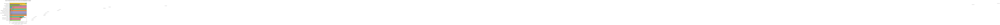

In [66]:
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_final3.mp4'
TARGET_COUNTRY = 'Japan'
NUM_BARS = 15
ANNOTATION_TEXT = """Data Source: Export Promotion Bureau, Bangladesh (https://epb.portal.gov.bd/)
Analysis & Visualisation by: Abdul Aziz Pervez"""
# --- End of Configuration ---

# --- HS Code to Product Name Mapping ---
hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}

# --- Emoji map for some product categories ---
emoji_map = {
    '01': '🐄', '02': '🥩', '03': '🐟', '04': '🥚', '05': '🦴', '06': '🌱', '07': '🥕',
    '08': '🍎', '09': '☕', '10': '🌾', '11': '🍞', '12': '🌰', '13': '🌳', '14': '🧺',
    '15': '🧈', '16': '🥫', '17': '🍬', '18': '🍫', '19': '🥣', '20': '🫙', '21': '🍽️',
    '22': '🍾', '23': '🏭', '24': '🚬', '25': '⛏️', '26': '🪨', '27': '🛢️', '28': '🧪',
    '29': '⚛️', '30': '💊', '31': '🛍️', '32': '🎨', '33': '💧', '34': '🧼', '35': '🩹',
    '36': '🧨', '37': '📷', '38': '⚗️', '39': '🧴', '40': '🛞', '41': '🐾', '42': '👜',
    '43': '🧥', '44': '🪵', '45': '🌳', '46': '👒', '47': '📄', '48': '📦', '49': '📚',
    '50': '🐛', '51': '🧶', '52': '☁️', '53': '🌿', '54': '🧵', '55': '🧵', '56': '🪡',
    '57': '🟥', '58': '👘', '59': '🧥', '60': '🧣', '61': '👕', '62': '👖', '63': '🛏️',
    '64': '👟', '65': '🧢', '66': '☂️', '67': '🪶', '68': '🗿', '69': '🏺', '70': '🍷',
    '71': '💎', '72': '⛓️', '73': '🔩', '74': '🪙', '75': '🪙', '76': '⬜', '78': '⬛',
    '79': '⬜', '80': '🥫', '81': '🧱', '82': '🛠️', '83': '🔑', '84': '⚙️', '85': '🔌',
    '86': '🚂', '87': '🚗', '88': '✈️', '89': '🚢', '90': '🔬', '91': '⌚', '92': '🎸',
    '93': '🔫', '94': '🪑', '95': '⚽', '96': '✒️', '97': '🖼️', '98': '⭐', '99': '✨'
}


def format_value(x):
    """Format values like $ 123.89 M"""
    if x >= 1e9:
        return f"$ {x/1e9:.2f} B"
    elif x >= 1e6:
        return f"$ {x/1e6:.2f} M"
    elif x >= 1e3:
        return f"$ {x/1e3:.2f} K"
    else:
        return f"$ {x:.0f}"

def custom_bar_label(val, rank):
    """Show value + emoji if available"""
    label = format_value(val)
    product_code = rank.name.split("(")[-1].strip(")")
    emoji = emoji_map.get(product_code, "")
    return f"{label} {emoji}"

def create_bar_chart_race(csv_path, output_path, country):
    print(f"Reading data from '{csv_path}'...")
    try:
        df = pd.read_csv(csv_path, dtype={'hs_code': str})
    except FileNotFoundError:
        print(f"Error: The file '{csv_path}' was not found.")
        return

    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    print(f"Filtering data for country: '{country}'...")
    df_country = df[df['country'] == country].copy()
    if df_country.empty:
        print(f"Error: No data found for {country}.")
        return

    df_country['month_dt'] = pd.to_datetime(df_country['month'], format='%B-%Y')

    print("Pivoting data...")
    df_pivot = df_country.pivot_table(
        values='USD', index='month_dt', columns='hs_code', aggfunc='sum'
    ).fillna(0)

    df_pivot.columns = [f"{hs_code_map.get(col, 'Unknown')} ({col})" for col in df_pivot.columns]
    df_cumulative = df_pivot.cumsum(axis=0)

    print("Generating race chart...")
    fig, ax = plt.subplots(figsize=(10, 8), dpi=144)
    ax.set_title(f"Top {NUM_BARS} Exported Products (HS Code) from Bangladesh to {country}", pad=20, fontsize=16)
    ax.grid(True, axis='x', color='#bebebe', linestyle=':', linewidth=0.5)
    ax.set_axisbelow(True)
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: format_value(x)))
    ax.set_xlabel("Cumulative Exports (in USD)", fontsize=12, color='grey', labelpad=10)

    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            title='',
            period_label={'x': .95, 'y': .25, 'ha': 'right', 'va': 'center', 'size': 20},
            period_fmt='%B-%Y',
            bar_size=.90,
            figsize=(12, 7), 
            dpi=300,
            cmap='Dark2',
            fig=fig,
            period_summary_func=lambda v, r: {
                'x': 0.5, 'y': 0.02,
                's': ANNOTATION_TEXT,
                'ha': 'center', 'va': 'bottom', 'size': 10, 'color': "#3A3333"
            }
        )
        plt.tight_layout(rect=[0.2, 0.05, 0.95, 0.92])
        print(f"\n--- Success! --- Video saved to '{output_path}'")
    except Exception as e:
        print(f"Error during animation: {e}")
        print("Check FFmpeg installation.")

if __name__ == "__main__":
    create_bar_chart_race(INPUT_CSV, OUTPUT_VIDEO, TARGET_COUNTRY)


In [73]:
import textwrap
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_fixed_labels2.mp4'
TARGET_COUNTRY = 'Japan'
NUM_BARS = 15
ANNOTATION_TEXT = """Data Source: Export Promotion Bureau, Bangladesh (https://epb.portal.gov.bd/)
Analysis & Visualisation by: Abdul Aziz Pervez"""
# --- End of Configuration ---

# --- HS Code to Product Name Mapping (keep your full mapping here) ---
hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}
# --- end mapping ---

def format_tick_value(x, pos=None):
    """Format axis ticks to $ X.XX M / B etc."""
    if x >= 1e9:
        return f"$ {x/1e9:,.2f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.2f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"

def wrap_product_label(name, code, wrap_width=20):
    """Wrap the product name to multiple lines and put HS code on the next line"""
    wrapped = textwrap.fill(name, width=wrap_width)
    return f"{wrapped}\n({code})"

def create_bar_chart_race(csv_path, output_path, country):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    print(f"Filtering for {country}...")
    df_country = df[df['country'] == country].copy()
    if df_country.empty:
        raise SystemExit(f"No data for {country} found in CSV.")

    # Parse date
    df_country['month_dt'] = pd.to_datetime(df_country['month'], format='%B-%Y')

    print("Pivoting...")
    df_pivot = df_country.pivot_table(
        values='USD', index='month_dt', columns='hs_code', aggfunc='sum'
    ).fillna(0)

    # Wrap product names so left labels are narrower and not cut off
    wrap_width = 27    # <-- tweak this smaller to force more wrapping, or larger to allow longer single-line names
    df_pivot.columns = [
        wrap_product_label(hs_code_map.get(col, 'Unknown'), col, wrap_width=wrap_width)
        for col in df_pivot.columns
    ]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)

    # Create figure with a larger width and explicitly increase left margin
    print("Creating figure and adjusting margins...")
    fig, ax = plt.subplots(figsize=(14, 8), dpi=144)   # increase width/height if needed
    # Give plenty of room on left for wrapped labels. Increase left=... if labels still clip.
    fig.subplots_adjust(left=0.17, right=0.98, top=0.92, bottom=0.10)

    ax.set_title(f"Top {NUM_BARS} Exported Products (with HS Code) from Bangladesh to {country}", fontsize=18, pad=18)
    ax.grid(True, axis='x', linestyle=':', linewidth=0.5, color='#bebebe')
    ax.set_axisbelow(True)
    ax.set_xlabel("Cumulative Exports (in USD)", fontsize=13, color="#1A1818", labelpad=12)

    # Format the x-axis ticks with the nicer formatter
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.tick_params(axis='y', labelsize=11)  # adjust label fontsize as needed
    ax.tick_params(axis='x', labelsize=11, colors='#1A1818')

    print("Generating bar chart race (this may take a while)...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            title='',  # we already set title on ax
            period_label={'x': .95, 'y': .25, 'ha': 'right', 'va': 'center', 'size': 22},
            period_fmt='%B-%Y',
            bar_size=.95,
            bar_label_size=10, 
            dpi=300,
            cmap='Dark2',
            fig=fig,
            period_summary_func=lambda v, r: {
                'x': 0.5, 'y': 0.02,
                's': ANNOTATION_TEXT,
                'ha': 'center', 'va': 'bottom', 'size': 12, 'color': "#1A1818"
            }
        )
        print(f"Saved: {output_path}")
    except Exception as e:
        print("Error during animation:", e)
        print("If this mentions an unexpected argument, remove it (your bar_chart_race version may differ).")
        raise

if __name__ == "__main__":
    create_bar_chart_race(INPUT_CSV, OUTPUT_VIDEO, TARGET_COUNTRY)

Reading CSV...
Filtering for Japan...
Pivoting...
Computing cumulative sums...
Creating figure and adjusting margins...
Generating bar chart race (this may take a while)...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_fixed_labels2.mp4


In [1]:
import textwrap
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.ticker as ticker


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_mobile.mp4'
TARGET_COUNTRY = 'Japan'
NUM_BARS = 12   # slightly fewer bars to fit portrait view
ANNOTATION_TEXT = """Data Source: Export Promotion Bureau, Bangladesh (https://epb.portal.gov.bd/)
Analysis & Visualisation by: Abdul Aziz Pervez"""
# --- End of Configuration ---

# --- HS Code to Product Name Mapping (keep your full mapping here) ---
hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}
# --- Emoji mapping ---
emoji_map = {
    '01': '🐄', '02': '🥩', '03': '🐟', '04': '🥚', '05': '🦴', '06': '🌱', '07': '🥕',
    '08': '🍎', '09': '☕', '10': '🌾', '11': '🍞', '12': '🌰', '13': '🌳', '14': '🧺',
    '15': '🧈', '16': '🥫', '17': '🍬', '18': '🍫', '19': '🥣', '20': '🫙', '21': '🍽️',
    '22': '🍾', '23': '🏭', '24': '🚬', '25': '⛏️', '26': '🪨', '27': '🛢️', '28': '🧪',
    '29': '⚛️', '30': '💊', '31': '🛍️', '32': '🎨', '33': '💧', '34': '🧼', '35': '🩹',
    '36': '🧨', '37': '📷', '38': '⚗️', '39': '🧴', '40': '🛞', '41': '🐾', '42': '👜',
    '43': '🧥', '44': '🪵', '45': '🌳', '46': '👒', '47': '📄', '48': '📦', '49': '📚',
    '50': '🐛', '51': '🧶', '52': '☁️', '53': '🌿', '54': '🧵', '55': '🧵', '56': '🪡',
    '57': '🟥', '58': '👘', '59': '🧥', '60': '🧣', '61': '👕', '62': '👖', '63': '🛏️',
    '64': '👟', '65': '🧢', '66': '☂️', '67': '🪶', '68': '🗿', '69': '🏺', '70': '🍷',
    '71': '💎', '72': '⛓️', '73': '🔩', '74': '🪙', '75': '🪙', '76': '⬜', '78': '⬛',
    '79': '⬜', '80': '🥫', '81': '🧱', '82': '🛠️', '83': '🔑', '84': '⚙️', '85': '🔌',
    '86': '🚂', '87': '🚗', '88': '✈️', '89': '🚢', '90': '🔬', '91': '⌚', '92': '🎸',
    '93': '🔫', '94': '🪑', '95': '⚽', '96': '✒️', '97': '🖼️', '98': '⭐', '99': '✨'
}

def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"

def wrap_product_label(name, code, wrap_width=16):
    """Wrap product name, add HS code + emoji"""
    wrapped = textwrap.fill(name, width=wrap_width)
    emoji = emoji_map.get(code, "")
    return f"{wrapped}\n({code}) {emoji}"

def create_bar_chart_race(csv_path, output_path, country):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    print(f"Filtering for {country}...")
    df_country = df[df['country'] == country].copy()
    if df_country.empty:
        raise SystemExit(f"No data for {country} found in CSV.")

    df_country['month_dt'] = pd.to_datetime(df_country['month'], format='%B-%Y')

    print("Pivoting...")
    df_pivot = df_country.pivot_table(
        values='USD', index='month_dt', columns='hs_code', aggfunc='sum'
    ).fillna(0)

    # Replace columns with wrapped + emoji labels
    df_pivot.columns = [
        wrap_product_label(hs_code_map.get(col, 'Unknown'), col, wrap_width=18)
        for col in df_pivot.columns
    ]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)

    # Portrait mode
    print("Creating figure...")
    fig, ax = plt.subplots(figsize=(9, 16), dpi=144)
    fig.subplots_adjust(left=0.23, right=0.95, top=0.90, bottom=0.08)

    ax.set_title(
        f"Top {NUM_BARS} Exported Products\nfrom Bangladesh to {country}",
        fontsize=22, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=15, labelpad=12)
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=13)
    # Reduce number of x-axis ticks
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    # Use an emoji-capable font
    plt.rcParams['text.usetex'] = False

    plt.rcParams['font.family'] = ['DejaVu Sans', 'Noto Color Emoji']

    # Your custom colors
    colors = [
        "#a6cee3", "#1f78b4", "#b2df8a", "#33a02c",
        "#fb9a99", "#e31a1c", "#fdbf6f", "#ff7f00",
        "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"
    ]

    # Create a colormap from the list
    custom_cmap = ListedColormap(colors)

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=12,
            sort='desc',
            bar_size=0.88,
            bar_label_size=14,
            dpi=300,
            cmap=custom_cmap,
            fig=fig,
            title='',
            period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 28},
            period_fmt='%B-%Y',
            period_summary_func=lambda v, r: {
                'x': 0.5, 'y': 0.02, 's': (
                    "Data Source: Export Promotion Bureau, Bangladesh\n (https://epb.portal.gov.bd)\n"
                    "Analysis & Visualisation by: Abdul Aziz Pervez"
                ),
                'ha': 'center', 'size': 13
            },
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise

if __name__ == "__main__":
    create_bar_chart_race(INPUT_CSV, OUTPUT_VIDEO, TARGET_COUNTRY)


Reading CSV...
Filtering for Japan...
Pivoting...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:435: UserWarning: Glyph 128031 (\N{FISH}) missing from font(s) DejaVu Sans.
  ret_val = anim.save(self.filename, fps=self.fps, writer=self.writer)
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:435: UserWarning: Glyph 128062 (\N{PAW PRINTS}) missing 

Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_mobile.mp4


findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
findfont: Font family 'Noto Color Emoji' not found.
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128031 (\N{FISH}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128062 (\N{PAW PRINTS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/IPyt

In [4]:
import textwrap
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.ticker as ticker


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_mobile.mp4'
TARGET_COUNTRY = 'Japan'
NUM_BARS = 12
# --- End of Configuration ---


hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}


def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"


def wrap_product_label(name, code, wrap_width=16):
    """Wrap product name and add HS code"""
    wrapped = textwrap.fill(name, width=wrap_width)
    return f"{wrapped}\n(HS {code})"


def format_dataframe(df):
    """Pre-format the numeric values into '$ 12.5 M' style strings"""
    def fmt(x):
        if x >= 1e9:
            return f"$ {x/1e9:,.1f} B"
        if x >= 1e6:
            return f"$ {x/1e6:,.1f} M"
        if x >= 1e3:
            return f"$ {x/1e3:,.0f} K"
        return f"$ {x:,.0f}"
    return df.applymap(fmt)


def create_bar_chart_race(csv_path, output_path, country):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    print(f"Filtering for {country}...")
    df_country = df[df['country'] == country].copy()
    if df_country.empty:
        raise SystemExit(f"No data for {country} found in CSV.")

    df_country['month_dt'] = pd.to_datetime(df_country['month'], format='%B-%Y')

    print("Pivoting...")
    df_pivot = df_country.pivot_table(
        values='USD', index='month_dt', columns='hs_code', aggfunc='sum'
    ).fillna(0)

    df_pivot.columns = [
        wrap_product_label(hs_code_map.get(col, 'Unknown'), col, wrap_width=20)
        for col in df_pivot.columns
    ]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)

    # Custom colors
    colors = [
        "#a6cee3", "#1f78b4", "#b2df8a", "#33a02c",
        "#fb9a99", "#e31a1c", "#fdbf6f", "#ff7f00",
        "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"
    ]
    custom_cmap = ListedColormap(colors)

    print("Creating figure...")
    fig, ax = plt.subplots(figsize=(12, 16), dpi=144)
    fig.subplots_adjust(left=0.23, right=0.95, top=0.90, bottom=0.08)
    ax.set_title(
        f"Top {NUM_BARS} Exported Products\nfrom Bangladesh to {country}",
        fontsize=25, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=20, labelpad=12)
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    ax.tick_params(axis='y', labelsize=19)
    ax.tick_params(axis='x', labelsize=18)

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            bar_size=0.88,
            bar_label_size=14,
            dpi=400,
            cmap=custom_cmap,
            fig=fig,
            title='',
            period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 32},
            period_fmt='%B-%Y',
            period_summary_func=lambda v, r: {
                'x': 0.5, 'y': 0.02, 's': (
                    "Data Source: Export Promotion Bureau, Bangladesh\n (https://epb.portal.gov.bd)\n"
                    "Analysis & Visualisation by: Abdul Aziz Pervez"
                ),
                'ha': 'center', 'size': 16
            },
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise


if __name__ == "__main__":
    create_bar_chart_race(INPUT_CSV, OUTPUT_VIDEO, TARGET_COUNTRY)


Reading CSV...
Filtering for Japan...
Pivoting...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/japan_export_race_mobile.mp4


In [6]:
# Qatar
import textwrap
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.ticker as ticker


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/qatar_export_race_mobile.mp4'
TARGET_COUNTRY = 'Qatar'
NUM_BARS = 12
# --- End of Configuration ---


hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}


def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"


def wrap_product_label(name, code, wrap_width=16):
    """Wrap product name and add HS code"""
    wrapped = textwrap.fill(name, width=wrap_width)
    return f"{wrapped}\n(HS {code})"


def format_dataframe(df):
    """Pre-format the numeric values into '$ 12.5 M' style strings"""
    def fmt(x):
        if x >= 1e9:
            return f"$ {x/1e9:,.1f} B"
        if x >= 1e6:
            return f"$ {x/1e6:,.1f} M"
        if x >= 1e3:
            return f"$ {x/1e3:,.0f} K"
        return f"$ {x:,.0f}"
    return df.applymap(fmt)


def create_bar_chart_race(csv_path, output_path, country):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    print(f"Filtering for {country}...")
    df_country = df[df['country'] == country].copy()
    if df_country.empty:
        raise SystemExit(f"No data for {country} found in CSV.")

    df_country['month_dt'] = pd.to_datetime(df_country['month'], format='%B-%Y')

    print("Pivoting...")
    df_pivot = df_country.pivot_table(
        values='USD', index='month_dt', columns='hs_code', aggfunc='sum'
    ).fillna(0)

    df_pivot.columns = [
        wrap_product_label(hs_code_map.get(col, 'Unknown'), col, wrap_width=20)
        for col in df_pivot.columns
    ]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)

    # Custom colors
    colors = [
        "#a6cee3", "#1f78b4", "#b2df8a", "#33a02c",
        "#fb9a99", "#e31a1c", "#fdbf6f", "#ff7f00",
        "#cab2d6", "#6a3d9a", "#ffff99", "#b15928"
    ]
    custom_cmap = ListedColormap(colors)

    print("Creating figure...")
    fig, ax = plt.subplots(figsize=(12, 16), dpi=144)
    fig.subplots_adjust(left=0.23, right=0.95, top=0.90, bottom=0.08)
    ax.set_title(
        f"Top {NUM_BARS} Exported Products\nfrom Bangladesh to {country}",
        fontsize=25, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=20, labelpad=12)
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    ax.tick_params(axis='y', labelsize=18)
    ax.tick_params(axis='x', labelsize=18)

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            bar_size=0.88,
            bar_label_size=14,
            dpi=400,
            cmap=custom_cmap,
            fig=fig,
            title='',
            period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 32},
            period_fmt='%B-%Y',
            period_summary_func=lambda v, r: {
                'x': 0.5, 'y': 0.02, 's': (
                    "Data Source: Export Promotion Bureau, Bangladesh\n (https://epb.portal.gov.bd)\n"
                    "Analysis & Visualisation by: Abdul Aziz Pervez"
                ),
                'ha': 'center', 'size': 16
            },
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise


if __name__ == "__main__":
    create_bar_chart_race(INPUT_CSV, OUTPUT_VIDEO, TARGET_COUNTRY)

Reading CSV...
Filtering for Qatar...
Pivoting...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/qatar_export_race_mobile.mp4


In [ ]:
# Malaysia
import textwrap
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/malaysia_export_race_mobile.mp4'
TARGET_COUNTRY = 'Malaysia'
NUM_BARS = 12
# --- End of Configuration ---


hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}


def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"


def wrap_product_label(name, code, wrap_width=16):
    """Wrap product name and add HS code"""
    wrapped = textwrap.fill(name, width=wrap_width)
    return f"{wrapped}\n(HS {code})"


def format_dataframe(df):
    """Pre-format the numeric values into '$ 12.5 M' style strings"""
    def fmt(x):
        if x >= 1e9:
            return f"$ {x/1e9:,.1f} B"
        if x >= 1e6:
            return f"$ {x/1e6:,.1f} M"
        if x >= 1e3:
            return f"$ {x/1e3:,.0f} K"
        return f"$ {x:,.0f}"
    return df.applymap(fmt)


def create_bar_chart_race(csv_path, output_path, country):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    print(f"Filtering for {country}...")
    df_country = df[df['country'] == country].copy()
    if df_country.empty:
        raise SystemExit(f"No data for {country} found in CSV.")

    df_country['month_dt'] = pd.to_datetime(df_country['month'], format='%B-%Y')

    print("Pivoting...")
    df_pivot = df_country.pivot_table(
        values='USD', index='month_dt', columns='hs_code', aggfunc='sum'
    ).fillna(0)

    df_pivot.columns = [
        wrap_product_label(hs_code_map.get(col, 'Unknown'), col, wrap_width=20)
        for col in df_pivot.columns
    ]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)
    
    print("Creating figure...")
    fig, ax = plt.subplots(figsize=(12, 16), dpi=144)

    # Adjust margins
    fig.subplots_adjust(left=0.25, right=0.95, top=0.90, bottom=0.08)

    # Custom background
    fig.patch.set_facecolor("#cadfcc")   # light custom color
    ax.set_facecolor("#cadfcc")

    # Title & labels
    ax.set_title(
        f"Top {NUM_BARS} Exported Products\nfrom Bangladesh to {country}",
        fontsize=25, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=20, labelpad=12)

    # X-axis gridlines aligned with ticks
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    ax.tick_params(axis='y', labelsize=18)
    ax.tick_params(axis='x', labelsize=18)
    ax.grid(axis='x', linestyle="--", alpha=0.7, color='white')  # grid aligned with x ticks

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            bar_size=0.88,
            bar_label_size=14,
            dpi=400,            
            cmap='dark24',
            fig=fig,
            title='',
            period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 32},
            period_fmt='%B-%Y',
            period_summary_func=lambda v, r: {
                'x': 0.5, 'y': 0.02, 's': (
                    "Data Source: Export Promotion Bureau, Bangladesh\n (https://epb.portal.gov.bd)\n"
                    "Analysis & Visualisation by: Abdul Aziz Pervez"
                ),
                'ha': 'center', 'size': 16
            },
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise

if __name__ == "__main__":
    create_bar_chart_race(INPUT_CSV, OUTPUT_VIDEO, TARGET_COUNTRY)

Reading CSV...
Filtering for Malaysia...
Pivoting...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/malaysia_export_race_mobile.mp4


Reading CSV...
Filtering for product: Fish & Crustaceans...
Pivoting data by country...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/fish_crustaceans_export_race.mp4


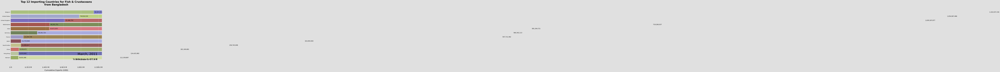

In [18]:
# Country-wise exports for a specific product from Bangladesh
import textwrap
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import re


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/fish_crustaceans_export_race.mp4'
TARGET_HS_CODE = '03'  # HS Code for 'Fish & Crustaceans'
NUM_BARS = 12          # Number of top countries to show
# --- End of Configuration ---


hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}


def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"


def create_bar_chart_race_by_product(csv_path, output_path, hs_code):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    product_name = hs_code_map.get(hs_code, f"Product (HS {hs_code})")
    print(f"Filtering for product: {product_name}...")
    
    df_product = df[df['hs_code'] == hs_code].copy()
    if df_product.empty:
        raise SystemExit(f"No data found for HS Code {hs_code} in the CSV.")

    df_product['month_dt'] = pd.to_datetime(df_product['month'], format='%B-%Y')

    print("Pivoting data by country...")
    # The columns are now countries, showing their import value for the selected product
    df_pivot = df_product.pivot_table(
        values='USD', index='month_dt', columns='country', aggfunc='sum'
    ).fillna(0)
    
    # Clean country names to prevent issues
    df_pivot.columns = [re.sub(r'[^a-zA-Z0-9\s-]', '', col).strip() for col in df_pivot.columns]


    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)
    
    print("Creating figure...")
    fig, ax = plt.subplots(figsize=(16, 9), dpi=144)
    fig.subplots_adjust(left=0.2, right=0.9, top=0.9, bottom=0.1)

    ax.set_facecolor("#e0e0e0")
    fig.patch.set_facecolor("#e0e0e0")

    ax.set_title(
        f"Top {NUM_BARS} Importing Countries for {product_name}\nfrom Bangladesh",
        fontsize=22, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=16, labelpad=12)
    
    # Clean up the y-axis (bars are the labels)
    ax.yaxis.set_ticks([])
    
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=6))
    ax.tick_params(axis='x', labelsize=14)
    ax.grid(axis='x', linestyle="--", alpha=0.7, color='white')
    ax.spines[['top', 'right', 'left', 'bottom']].set_visible(False)

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            bar_size=0.85,
            bar_label_size=12,
            tick_label_size=12,
            dpi=300,            
            cmap='tab20b',
            fig=fig,
            title='', # Use the ax.set_title instead
            period_label={'x': .95, 'y': .2, 'ha': 'right', 'va': 'center', 'size': 28},
            period_fmt='%B, %Y',
            period_summary_func=lambda v, r: {
                'x': 0.95, 'y': 0.1, 's': f"Total Exports: {format_tick_value(v.sum())}",
                'ha': 'right', 'size': 18
            },
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise

if __name__ == "__main__":
    # Call the modified function with the target HS code
    create_bar_chart_race_by_product(INPUT_CSV, OUTPUT_VIDEO, TARGET_HS_CODE)

Reading CSV...
Filtering for product: Fish & Crustaceans...
Pivoting data by country...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/fish_crustaceans_export_race_portrait.mp4


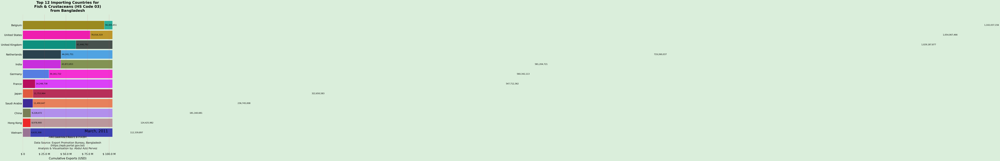

In [32]:
# Country-wise exports for a specific product from Bangladesh mobile version
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import re


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/fish_crustaceans_export_race_portrait.mp4'
TARGET_HS_CODE = '03'  # HS Code for 'Fish & Crustaceans'
NUM_BARS = 12          # Number of top countries to show
# --- End of Configuration ---


hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}


def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"

def summary_func(values, ranks):
    return {
        'x': 0.5, 'y': 0.02,   # place both together at bottom-center
        's': (
            f"All Countries Total: {format_tick_value(values.sum())}\n\n"
            "Data Source: Export Promotion Bureau, Bangladesh\n"
            "(https://epb.portal.gov.bd)\n"
            "Analysis & Visualisation by: Abdul Aziz Pervez"
        ),
        'ha': 'center',        
        'size': 18,
        'color': "#252222"
    }


def create_bar_chart_race_by_product(csv_path, output_path, hs_code):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    product_name = hs_code_map.get(hs_code, f"Product (HS {hs_code})")
    print(f"Filtering for product: {product_name}...")
    
    df_product = df[df['hs_code'] == hs_code].copy()
    if df_product.empty:
        raise SystemExit(f"No data found for HS Code {hs_code} in the CSV.")

    df_product['month_dt'] = pd.to_datetime(df_product['month'], format='%B-%Y')

    print("Pivoting data by country...")
    df_pivot = df_product.pivot_table(
        values='USD', index='month_dt', columns='country', aggfunc='sum'
    ).fillna(0)
    
    df_pivot.columns = [re.sub(r'[^a-zA-Z0-9\s-]', '', col).strip() for col in df_pivot.columns]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)
    
    print("Creating figure...")
    # Swapped figsize to (9, 16) for a portrait aspect ratio
    fig, ax = plt.subplots(figsize=(12, 16), dpi=144)
    # Adjusted margins for the taller layout
    fig.subplots_adjust(left=0.23, right=0.95, top=0.90, bottom=0.07)

    ax.set_facecolor("#daeedb")
    fig.patch.set_facecolor("#daeedb")

    ax.set_title(
        f"Top {NUM_BARS} Importing Countries for\n{product_name} (HS Code {TARGET_HS_CODE})\nfrom Bangladesh",
        fontsize=25, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=20, labelpad=12)
    
    ax.yaxis.set_ticks([])
    
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=5))
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    ax.grid(axis='x', linestyle="--", alpha=0.7, color='#cb4154')
    ax.spines[['top', 'right', 'left', 'bottom']].set_visible(False)

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            bar_size=0.88,
            bar_label_size=14,
            tick_label_size=14,
            dpi=400,            
            cmap='dark24',
            fig=fig,
            title='', 
            # Adjusted text positions for portrait layout
            period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 26},
            period_fmt='%B, %Y',
            period_summary_func=summary_func,
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise

if __name__ == "__main__":
    create_bar_chart_race_by_product(INPUT_CSV, OUTPUT_VIDEO, TARGET_HS_CODE)

In [35]:
# Country-wise exports for a specific product from Bangladesh mobile version
import pandas as pd
import bar_chart_race as bcr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import re


# --- Configuration ---
INPUT_CSV = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/monthly_export_data_cleaned.csv'
OUTPUT_VIDEO = '/media/abdul-aziz/sdb7/epb_exports_excel/product_wise/rubber_export_race_mobile.mp4'
TARGET_HS_CODE = '40'  # HS Code for 'Rubber'
NUM_BARS = 12          # Number of top countries to show
# --- End of Configuration ---


hs_code_map = {
    '01': 'Live Animals', '02': 'Meat', '03': 'Fish & Crustaceans', '04': 'Dairy & Eggs',
    '05': 'Animal Origin Products', '06': 'Live Trees & Plants', '07': 'Edible Vegetables',
    '08': 'Edible Fruits & Nuts', '09': 'Coffee, Tea, & Spices', '10': 'Cereals',
    '11': 'Milling Products', '12': 'Oil Seeds', '13': 'Lac, Gums, Resins', '14': 'Vegetable Plaiting Materials',
    '15': 'Animal or Vegetable Fats', '16': 'Meat/Fish Preparations', '17': 'Sugars', '18': 'Cocoa',
    '19': 'Cereal Preparations', '20': 'Vegetable/Fruit Preparations', '21': 'Misc. Edible Preparations',
    '22': 'Beverages & Spirits', '23': 'Food Industries Residues', '24': 'Tobacco', '25': 'Salt, Sulphur, Earth',
    '26': 'Ores, Slag, & Ash', '27': 'Mineral Fuels & Oils', '28': 'Inorganic Chemicals', '29': 'Organic Chemicals',
    '30': 'Pharmaceutical Products', '31': 'Fertilizers', '32': 'Tanning & Dyeing Extracts', '33': 'Essential Oils',
    '34': 'Soaps & Waxes', '35': 'Albuminoidal Substances', '36': 'Explosives', '37': 'Photographic Goods',
    '38': 'Misc. Chemical Products', '39': 'Plastics', '40': 'Rubber', '41': 'Raw Hides & Skins',
    '42': 'Leather Articles', '43': 'Furskins', '44': 'Wood', '45': 'Cork', '46': 'Straw Manufactures',
    '47': 'Wood Pulp', '48': 'Paper & Paperboard', '49': 'Printed Books', '50': 'Silk', '51': 'Wool',
    '52': 'Cotton', '53': 'Other Vegetable Fibers', '54': 'Man-made Filaments', '55': 'Man-made Staple Fibers',
    '56': 'Wadding, Felt, & Nonwovens', '57': 'Carpets', '58': 'Special Woven Fabrics',
    '59': 'Impregnated/Coated Fabrics', '60': 'Knitted or Crocheted Fabrics', '61': 'Knitted Apparel',
    '62': 'Woven Apparel', '63': 'Other Made-up Textiles', '64': 'Footwear', '65': 'Headgear',
    '66': 'Umbrellas & Canes', '67': 'Prepared Feathers', '68': 'Stone & Plaster Articles', '69': 'Ceramic Products',
    '70': 'Glass & Glassware', '71': 'Precious Stones & Metals', '72': 'Iron & Steel',
    '73': 'Articles of Iron or Steel', '74': 'Copper', '75': 'Nickel', '76': 'Aluminum', '78': 'Lead',
    '79': 'Zinc', '80': 'Tin', '81': 'Other Base Metals', '82': 'Tools & Cutlery', '83': 'Misc. Articles of Base Metal',
    '84': 'Machinery', '85': 'Electrical Machinery', '86': 'Railway & Tramway', '87': 'Vehicles',
    '88': 'Aircraft & Spacecraft', '89': 'Ships, Boats', '90': 'Optical & Medical Instruments',
    '91': 'Clocks & Watches', '92': 'Musical Instruments', '93': 'Arms & Ammunition', '94': 'Furniture',
    '95': 'Toys, Games, & Sports', '96': 'Misc. Manufactured Articles', '97': 'Works of Art',
    '98': 'Special Classification', '99': 'Special Classification'
}


def format_tick_value(x, pos=None):
    if x >= 1e9:
        return f"$ {x/1e9:,.1f} B"
    if x >= 1e6:
        return f"$ {x/1e6:,.1f} M"
    if x >= 1e3:
        return f"$ {x/1e3:,.0f} K"
    return f"$ {x:,.0f}"

def summary_func(values, ranks):
    return {
        'x': 0.5, 'y': 0.02,   # place both together at bottom-center
        's': (
            f"All Countries Total: {format_tick_value(values.sum())}\n\n"
            "Data Source: Export Promotion Bureau, Bangladesh\n"
            "(https://epb.portal.gov.bd)\n"
            "Analysis & Visualisation by: Abdul Aziz Pervez"
        ),
        'ha': 'center',        
        'size': 18,
        'color': "#252222"
    }


def create_bar_chart_race_by_product(csv_path, output_path, hs_code):
    print("Reading CSV...")
    df = pd.read_csv(csv_path, dtype={'hs_code': str})
    df['hs_code'] = df['hs_code'].str.strip().str.zfill(2)

    product_name = hs_code_map.get(hs_code, f"Product (HS {hs_code})")
    print(f"Filtering for product: {product_name}...")
    
    df_product = df[df['hs_code'] == hs_code].copy()
    if df_product.empty:
        raise SystemExit(f"No data found for HS Code {hs_code} in the CSV.")

    df_product['month_dt'] = pd.to_datetime(df_product['month'], format='%B-%Y')

    print("Pivoting data by country...")
    df_pivot = df_product.pivot_table(
        values='USD', index='month_dt', columns='country', aggfunc='sum'
    ).fillna(0)
    
    df_pivot.columns = [re.sub(r'[^a-zA-Z0-9\s-]', '', col).strip() for col in df_pivot.columns]

    print("Computing cumulative sums...")
    df_cumulative = df_pivot.cumsum(axis=0)
    
    print("Creating figure...")
    # Swapped figsize to (9, 16) for a portrait aspect ratio
    fig, ax = plt.subplots(figsize=(12, 16), dpi=144)
    # Adjusted margins for the taller layout
    fig.subplots_adjust(left=0.23, right=0.95, top=0.90, bottom=0.07)

    ax.set_facecolor("#daeedb")
    fig.patch.set_facecolor("#daeedb")

    ax.set_title(
        f"Top {NUM_BARS} Importing Countries for\n{product_name} (HS Code {TARGET_HS_CODE})\nfrom Bangladesh",
        fontsize=25, pad=20, weight='bold'
    )
    ax.set_xlabel("Cumulative Exports (USD)", fontsize=20, labelpad=12)
    
    ax.yaxis.set_ticks([])
    
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_tick_value))
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=5))
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    ax.grid(axis='x', linestyle="--", alpha=0.7, color='#cb4154')
    ax.spines[['top', 'right', 'left', 'bottom']].set_visible(False)

    print("Generating race...")
    try:
        bcr.bar_chart_race(
            df=df_cumulative,
            filename=output_path,
            n_bars=NUM_BARS,
            sort='desc',
            bar_size=0.88,
            bar_label_size=14,
            tick_label_size=14,
            dpi=400,            
            cmap='dark24',
            fig=fig,
            title='', 
            # Adjusted text positions for portrait layout
            period_label={'x': .95, 'y': .15, 'ha': 'right', 'va': 'center', 'size': 26},
            period_fmt='%B, %Y',
            period_summary_func=summary_func,
        )
        print(f"Saved video: {output_path}")
    except Exception as e:
        print("Error during bar chart race:", e)
        raise

if __name__ == "__main__":
    create_bar_chart_race_by_product(INPUT_CSV, OUTPUT_VIDEO, TARGET_HS_CODE)

Reading CSV...
Filtering for product: Rubber...
Pivoting data by country...
Computing cumulative sums...
Creating figure...
Generating race...


/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_values.iloc[:, 0] = df_values.iloc[:, 0].fillna(method='ffill')
/home/abdul-aziz/lulcmodel-env/lib/python3.12/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


Saved video: /media/abdul-aziz/sdb7/epb_exports_excel/product_wise/rubber_export_race_mobile.mp4
